 # <u> "Visit with us" Tourism Customer Classifier </u>

# Background and Context
You are a Data Scientist for a tourism company named "Visit with us". The Policy Maker of the company wants to enable and establish a viable business model to expand the customer base.

A viable business model is a central concept that helps you to understand the existing ways of doing the business and how to change the ways for the benefit of the tourism sector.

One of the ways to expand the customer base is to introduce a new offering of packages.

Currently, there are 5 types of packages the company is offering - Basic, Standard, Deluxe, Super Deluxe, King.

Looking at the data of the last year, we observed that 18% of the customers purchased the packages.

However, the marketing cost was quite high because customers were contacted at random without looking at the available information.

The company is now planning to launch a new product i.e. Wellness Tourism Package. Wellness Tourism is defined as Travel that allows the traveler to maintain, enhance or kick-start a healthy lifestyle, and support or increase one's sense of well-being.

However, this time company wants to harness the available data of existing and potential customers to make the marketing expenditure more efficient.

You as a Data Scientist at "Visit with us" travel company have to analyze the customers' data and information to provide recommendations to the Policy Maker and Marketing Team and also build a model to predict the potential customer who is going to purchase the newly introduced travel package.


## Objective
1.	To predict whether a customer will purchase the newly introduced travel package
2.	Which variables are most significant
3.  Understanding Customers segmentations for targeting


## Data Dictionary
* Customer details:
  1.	CustomerID: Unique customer ID
  2.	ProdTaken: Whether the customer has purchased a package or not (0: No, 1: Yes)
  3.	Age: Age of customer
  4.	TypeofContact: How customer was contacted (Company Invited or Self Inquiry)
  5.	CityTier: City tier depends on the development of a city, population, facilities, and living standards. The categories are ordered i.e. Tier 1 > Tier 2 > Tier 3
  6.	Occupation: Occupation of customer
  7.	Gender: Gender of customer
  8.	NumberOfPersonVisiting: Total number of persons planning to take the trip with the customer
  9.	PreferredPropertyStar: Preferred hotel property rating by customer
  10.	MaritalStatus: Marital status of customer
  11.	NumberOfTrips: Average number of trips in a year by customer
  12.	Passport: The customer has a passport or not (0: No, 1: Yes)
  13.	OwnCar: Whether the customers own a car or not (0: No, 1: Yes)
  14.	NumberOfChildrenVisiting: Total number of children with age less than 5 planning to take the trip with the customer
  15.	Designation: Designation of the customer in the current organization
  16.	MonthlyIncome: Gross monthly income of the customer
* Customer interaction data: 
  1.	PitchSatisfactionScore: Sales pitch satisfaction score
  2.	ProductPitched: Product pitched by the salesperson
  3.	NumberOfFollowups: Total number of follow-ups has been done by the salesperson after the sales pitch
  4.	DurationOfPitch: Duration of the pitch by a salesperson to the customer


## Business Problem & Objective Analysis

### Purpose:
Growing the customer base while keeping marketing costs efficient.
Predicting consumers that can be targeted for the product pitch to be likely to purchase the product
Currently, since conversion rates are at 18%, the marketing department needs to identify which customers have a higher probability of purchasing the product but also need to keep expenditure costs to a minimum.
### Objective:
Give the marketing department and policymakers information about which data features are the most significant and which segment of customers should be targeted more often. With given data features, the marketing department could also use a model which can accurately predict whether a customer will buy a product.
### Focus:
The travel company wants to ensure that more people accept the product while also growing the customer base. The model should aim to reduce the number customers falsely labeled as not taking on the product while also correctly labeling customers. Thus, more analysis will be done on the metric of the model that should be emphasized right before modeling.
### Data Dictionary Analysis:
1. Customer detail information describes the Age, Gender, Marital Status, Occupation, Designation, and Monthly Income
2. There is also information about how developed their city is
3. Information about owning a car and having a passport
4. Information about trips taken, preferred hotel ratings, number of people on trip and number of children under 5
5. The customer ID will be irrelevant to predicting purchase.
6. There is data about employee interactions with the customer relating to the Pitch: product pitched, duration of pitch, pitch satisfaction score, and number of followups

# Let's start analyzing!

# Library and Data Import

### Importing the libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
pd.set_option('display.max_columns', None) # Removes the limit from the number of displayed columns
pd.set_option('display.max_colwidth', 500) # Sets the width of column
pd.set_option('display.max_rows', 200) # Sets the limit for number of displayed rows
import numpy as np
np.set_printoptions(suppress=True)
import pandas_profiling as pp
import missingno as mno
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
#from sklearn.impute import SimpleImputer # Library to impute missing values

# Libraries for Modeling
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
# Model metrics
from sklearn import metrics
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score, roc_auc_score, roc_curve, auc, plot_roc_curve, confusion_matrix, precision_recall_curve, make_scorer


### Importing Data and First Glance


In [2]:
#df_original = pd.read_excel('Tourism.xlsx', sheet_name = None) # read all sheets
#df_original = pd.read_excel('Tourism.xlsx', sheet_name = [1]) # read the sheet we need

df_original = pd.ExcelFile('Tourism.xlsx') #ExcelFile creates object unlike read_excel
df_original.sheet_names

['Data Dict', 'Tourism']

In [3]:
# Data Dictionary and Tourism dataframes separated
df_data_dict = df_original.parse(sheet_name = 'Data Dict') 
df_tourism_original = df_original.parse(sheet_name = 'Tourism')

#### Data Dictionary Dataframe defined

In [4]:
# Data Dictionary
df_data_dict.columns = df_data_dict.iloc[0] # quick formating cleanup by fixing header column
df_data_dict.drop(df_data_dict.index[0], inplace=True)
df_data_dict = df_data_dict.iloc[: , 1:] # dropping unnecessary first column
df_data_dict

,Data,Variable,Discerption
1,Tourism,CustomerID,Unique customer ID
2,Tourism,ProdTaken,"Whether the customer has purchased a package or not (0: No, 1: Yes)"
3,Tourism,Age,Age of customer
4,Tourism,TypeofContact,How customer was contacted (Company Invited or Self Inquiry)
5,Tourism,CityTier,"City tier depends on the development of a city, population, facilities, and living standards. The categories are ordered i.e. Tier 1 > Tier 2 > Tier 3"
6,Tourism,DurationOfPitch,Duration of the pitch by a salesperson to the customer
7,Tourism,Occupation,Occupation of customer
8,Tourism,Gender,Gender of customer
9,Tourism,NumberOfPersonVisiting,Total number of persons planning to take the trip with the customer
10,Tourism,NumberOfFollowups,Total number of follow-ups has been done by sales person after sales pitch


#### Tourism Dataframe Defined

In [5]:
df = df_tourism_original.copy() # df will be our working dataframe
print('-------------A peek at the dataset-------------')
df.head()

-------------A peek at the dataset-------------


,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


> Reordering columns so that they are in order according to Customer Details and Customer Interaction data

In [6]:
cols = df.columns.tolist()
cols

['CustomerID',
 'ProdTaken',
 'Age',
 'TypeofContact',
 'CityTier',
 'DurationOfPitch',
 'Occupation',
 'Gender',
 'NumberOfPersonVisiting',
 'NumberOfFollowups',
 'ProductPitched',
 'PreferredPropertyStar',
 'MaritalStatus',
 'NumberOfTrips',
 'Passport',
 'PitchSatisfactionScore',
 'OwnCar',
 'NumberOfChildrenVisiting',
 'Designation',
 'MonthlyIncome']

In [7]:
cols = ['CustomerID', 'Age', 'Gender', 'MaritalStatus',
        'TypeofContact', 'Occupation', 'Designation',
        'MonthlyIncome', 'CityTier', 'OwnCar',
        'Passport', 'NumberOfTrips', 'PreferredPropertyStar',
        'NumberOfPersonVisiting', 'NumberOfChildrenVisiting',
        'ProductPitched','ProdTaken','DurationOfPitch', 'NumberOfFollowups',
        'PitchSatisfactionScore']
df = df[cols]
df

,CustomerID,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
0,200000,41.0,Female,Single,Self Enquiry,Salaried,Manager,20993.0,3,1,1,1.0,3.0,3,0.0,Deluxe,1,6.0,3.0,2
1,200001,49.0,Male,Divorced,Company Invited,Salaried,Manager,20130.0,1,1,0,2.0,4.0,3,2.0,Deluxe,0,14.0,4.0,3
2,200002,37.0,Male,Single,Self Enquiry,Free Lancer,Executive,17090.0,1,0,1,7.0,3.0,3,0.0,Basic,1,8.0,4.0,3
3,200003,33.0,Female,Divorced,Company Invited,Salaried,Executive,17909.0,1,1,1,2.0,3.0,2,1.0,Basic,0,9.0,3.0,5
4,200004,NaN,Male,Divorced,Self Enquiry,Small Business,Executive,18468.0,1,1,0,1.0,4.0,2,0.0,Basic,0,8.0,3.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,204883,49.0,Male,Unmarried,Self Enquiry,Small Business,Manager,26576.0,3,1,1,2.0,4.0,3,1.0,Deluxe,1,9.0,5.0,1
4884,204884,28.0,Male,Single,Company Invited,Salaried,Executive,21212.0,1,1,1,3.0,3.0,4,2.0,Basic,1,31.0,5.0,3
4885,204885,52.0,Female,Married,Self Enquiry,Salaried,Senior Manager,31820.0,3,1,0,7.0,4.0,4,3.0,Standard,1,17.0,4.0,1
4886,204886,19.0,Male,Single,Self Enquiry,Small Business,Executive,20289.0,3,0,0,3.0,3.0,3,2.0,Basic,1,16.0,4.0,5


# Dataframe Analysis and Preprocessing
- Includes initial analysis
- Includes data preparation and cleaning for visualization

## A general overview of the dataset

1. The shape of the dataset
2. Checking the datatypes, null values, and the number of unique values

In [8]:
## Dataframe and column Overview &  Analysis function
def dataframe_info (df): # Defined function for general dataframe overview
    print('-------------DATAFRAME INFO-------------')
    print('\n1. The shape of the data set is:', df.shape)
    print('\n2. Data types, null values, and unique values:')
    BDFigures = []
    for col in df.columns:
        if df[col].nunique() <= 10: #list all unique values if less than 5
            BDFigures.append([col ,df[col].dtype,
                df[col].isna().sum(),
                round((df[col].isna().sum()/len(df[col])) * 100,2),
                df[col].nunique(),
                df[col].unique().tolist()]);
        elif df[col].nunique() > 10: #returns a sample of 5 unique values (dropping any duplicates the sample grabs)
            BDFigures.append([col, df[col].dtype,
                df[col].isna().sum(),
                round((df[col].isna().sum()/len(df[col])) * 100,2),
                df[col].nunique(),
                list(df[col].sample(10).drop_duplicates().values)]);
    display(pd.DataFrame(columns=['dataFeatures','dataType', 'null', 'nullPct', 'unique', 'uniqueSample'], data=BDFigures))
    
def dataframe_describe (df):
    print('\nStatiscal analysis of Numerical columns:')
    display(df.describe().T)
    print('\nStatiscal analysis of Object/Categorical columns:')
    display(df.describe(include=['object','category']).T)

In [9]:
dataframe_info(df)

-------------DATAFRAME INFO-------------

1. The shape of the data set is: (4888, 20)

2. Data types, null values, and unique values:


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,CustomerID,int64,0,0.00,4888,"[204405, 200201, 201382, 203819, 201454, 200581, 200267, 200216, 201633, 204165]"
1,Age,float64,226,4.62,44,"[43.0, 53.0, 37.0, 52.0, 42.0, nan, 46.0, 39.0, 32.0]"
2,Gender,object,0,0.00,3,"[Female, Male, Fe Male]"
3,MaritalStatus,object,0,0.00,4,"[Single, Divorced, Married, Unmarried]"
4,TypeofContact,object,25,0.51,2,"[Self Enquiry, Company Invited, nan]"
5,Occupation,object,0,0.00,4,"[Salaried, Free Lancer, Small Business, Large Business]"
6,Designation,object,0,0.00,5,"[Manager, Executive, Senior Manager, AVP, VP]"
7,MonthlyIncome,float64,233,4.77,2475,"[28984.0, 21469.0, 21180.0, 21460.0, 25345.0, 21634.0, 21237.0, 20071.0, 29011.0, 21614.0]"
8,CityTier,int64,0,0.00,3,"[3, 1, 2]"
9,OwnCar,int64,0,0.00,2,"[1, 0]"


> Oberservations:
  - CustomerID can be dropped because it won't help with predictive modeling
  - Need to fix Gender data as it has a typo
    - 'Fe Male' replaced by 'Female'
  - Null values included in 
    - Age, MonthlyIncome, NumberOfTrips, PreferredPropertyStar, NumberOfChildrenVisiting, DurationOfPitch, and NumberOfFollowups
  - Need to fix categorical variables datatypes
    - Categories: Gender, MaritalStatus, TypeofContact, Occupation, Designation, CityTier, OwnCar, Passport, PreferredPropertyStar, NumberOfPersonVisiting, NumberOfChildrenVisiting, ProductPitched, PitchSatisfactionScore, ProdTaken
      - Ordinal - Designation, CityTier, PreferredPropertyStar, NumberOfPersonVisiting, NumberOfChildrenVisiting, PitchSatisfactionScore
      - Nominal - Marital Status, TypeofContact, Occupation, ProductPitched
      - Binary - Gender, OwnCar, Passport, ProdTaken

## Data Cleaning

### Dropping the ID column as it won't be beneficial to the model

In [10]:
df.drop(columns = 'CustomerID', inplace=True)

### Fixing Genders data (Fe Male to Female)

In [11]:
df['Gender'].value_counts()

Male       2916
Female     1817
Fe Male     155
Name: Gender, dtype: int64

In [12]:
df['Gender'] = df['Gender'].replace('Fe Male', 'Female')
df['Gender'].value_counts()

Male      2916
Female    1972
Name: Gender, dtype: int64

### Applying proper datatype formatting to categories

#### Defining variables are being made for easy calling of these datatype columns
- continuous columns, categorical columns, categorical columns without the target variable, and a variable for just the target column

In [13]:
df.columns

Index(['Age', 'Gender', 'MaritalStatus', 'TypeofContact', 'Occupation',
       'Designation', 'MonthlyIncome', 'CityTier', 'OwnCar', 'Passport',
       'NumberOfTrips', 'PreferredPropertyStar', 'NumberOfPersonVisiting',
       'NumberOfChildrenVisiting', 'ProductPitched', 'ProdTaken',
       'DurationOfPitch', 'NumberOfFollowups', 'PitchSatisfactionScore'],
      dtype='object')

In [14]:
con_col = ['Age', 'MonthlyIncome','NumberOfTrips' ,'DurationOfPitch' , 'NumberOfFollowups']
cat_col = ['Gender', 'MaritalStatus', 'TypeofContact', 'Occupation', 'Designation', 'CityTier', 'OwnCar', 'Passport', 'PreferredPropertyStar', 'NumberOfPersonVisiting', 'NumberOfChildrenVisiting', 'ProductPitched', 'PitchSatisfactionScore','ProdTaken']
cat_col_dep = cat_col.copy()
cat_col_dep.remove('ProdTaken')

#### Applying Category Datatype

In [15]:
# for feature in df.columns: # Loop through all columns in the dataframe
#    if df[feature].dtype == 'object': # Only apply for columns with categorical strings
#        df[feature] = pd.Categorical(df[feature])

for i in cat_col_dep:
    df[i] = df[i].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Age                       4662 non-null   float64 
 1   Gender                    4888 non-null   category
 2   MaritalStatus             4888 non-null   category
 3   TypeofContact             4863 non-null   category
 4   Occupation                4888 non-null   category
 5   Designation               4888 non-null   category
 6   MonthlyIncome             4655 non-null   float64 
 7   CityTier                  4888 non-null   category
 8   OwnCar                    4888 non-null   category
 9   Passport                  4888 non-null   category
 10  NumberOfTrips             4748 non-null   float64 
 11  PreferredPropertyStar     4862 non-null   category
 12  NumberOfPersonVisiting    4888 non-null   category
 13  NumberOfChildrenVisiting  4822 non-null   catego

### Before Missing Value Treatment, Let's Look at a Statistical Analysis

## Statical Describing of the Data 

In [16]:
dataframe_describe(df)


Statiscal analysis of Numerical columns:


,count,mean,std,min,25%,50%,75%,max
Age,4662.0,37.622265,9.316387,18.0,31.0,36.0,44.0,61.0
MonthlyIncome,4655.0,23619.853491,5380.698361,1000.0,20346.0,22347.0,25571.0,98678.0
NumberOfTrips,4748.0,3.236521,1.849019,1.0,2.0,3.0,4.0,22.0
ProdTaken,4888.0,0.188216,0.390925,0.0,0.0,0.0,0.0,1.0
DurationOfPitch,4637.0,15.490835,8.519643,5.0,9.0,13.0,20.0,127.0
NumberOfFollowups,4843.0,3.708445,1.002509,1.0,3.0,4.0,4.0,6.0



Statiscal analysis of Object/Categorical columns:


,count,unique,top,freq
Gender,4888,2,Male,2916
MaritalStatus,4888,4,Married,2340
TypeofContact,4863,2,Self Enquiry,3444
Occupation,4888,4,Salaried,2368
Designation,4888,5,Executive,1842
CityTier,4888,3,1,3190
OwnCar,4888,2,1,3032
Passport,4888,2,0,3466
PreferredPropertyStar,4862,3,3,2993
NumberOfPersonVisiting,4888,5,3,2402


- We see very high relative values in MonthlyIncome, Number of Trips, and Duration of Pitch. They will be analyzed for this
- Most customers (over 3000) are self-enquired, live in a tier 3 city, own a car, or have a passport  

## Extreme Value Analysis

> MontlyIncome, NumberOfTrips, DurationOfPitch

### High Value in MonthlyIncome


In [17]:
df.nlargest(5, 'MonthlyIncome')

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
2482,37.0,Female,Divorced,Self Enquiry,Salaried,Executive,98678.0,1,1,1,2.0,5.0,3,1.0,Basic,0,12.0,5.0,2
38,36.0,Female,Divorced,Self Enquiry,Salaried,Executive,95000.0,1,1,1,1.0,NaN,2,0.0,Basic,0,11.0,4.0,2
2634,53.0,Male,Divorced,Self Enquiry,Salaried,VP,38677.0,1,1,0,2.0,NaN,4,2.0,King,0,7.0,5.0,2
4104,53.0,Male,Married,Self Enquiry,Salaried,VP,38677.0,1,1,0,2.0,NaN,4,3.0,King,0,7.0,5.0,1
3190,42.0,Female,Married,Company Invited,Salaried,VP,38651.0,1,1,0,3.0,NaN,3,1.0,King,0,14.0,6.0,4


> The highest monthly income of these 2 customers is significantly higher than everyone elses. Neither of these customers bought a product, so their data is not as important since 82% of our customers in this dataset didnd't take the pitched product

  - Running additional analysis to determine whether to drop or keep
    - Both are Executives so this should be a good indicator of how much their income is

In [18]:
df[df['Designation']=='Executive'].mean()

Age                     33.054181
MonthlyIncome        19939.922507
NumberOfTrips            3.096353
ProdTaken                0.299674
DurationOfPitch         15.194834
NumberOfFollowups        3.693822
dtype: float64

> The monthly income average for Executives is 19,939. Because of this, I am choosing to drop these two rows of data that have values over 90000.

In [19]:
df = df[df.MonthlyIncome != 95000]
df = df[df.MonthlyIncome != 98678]
df.nlargest(5,'MonthlyIncome')

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
2634,53.0,Male,Divorced,Self Enquiry,Salaried,VP,38677.0,1,1,0,2.0,NaN,4,2.0,King,0,7.0,5.0,2
4104,53.0,Male,Married,Self Enquiry,Salaried,VP,38677.0,1,1,0,2.0,NaN,4,3.0,King,0,7.0,5.0,1
3190,42.0,Female,Married,Company Invited,Salaried,VP,38651.0,1,1,0,3.0,NaN,3,1.0,King,0,14.0,6.0,4
4660,42.0,Female,Married,Company Invited,Salaried,VP,38651.0,1,1,0,3.0,NaN,3,2.0,King,0,14.0,6.0,4
3295,57.0,Female,Married,Self Enquiry,Large Business,VP,38621.0,1,0,0,6.0,NaN,4,3.0,King,0,11.0,4.0,4


### High Value in NumberOfTrips



In [20]:
df.nlargest(5, 'NumberOfTrips')

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
3260,40.0,Male,Unmarried,Company Invited,Salaried,Manager,25460.0,1,1,0,22.0,4.0,4,1.0,Deluxe,0,16.0,4.0,2
816,39.0,Male,Unmarried,Company Invited,Salaried,Manager,21782.0,1,1,0,21.0,4.0,3,0.0,Deluxe,0,15.0,3.0,2
2829,31.0,Male,Single,Company Invited,Large Business,Executive,20963.0,1,1,1,20.0,3.0,3,2.0,Basic,1,11.0,4.0,4
385,30.0,Male,Single,Company Invited,Large Business,Executive,17285.0,1,1,1,19.0,3.0,2,1.0,Basic,1,10.0,3.0,4
2446,38.0,Male,Single,Self Enquiry,Free Lancer,Executive,20768.0,1,0,1,8.0,3.0,4,1.0,Basic,1,9.0,5.0,3


> While the four highest number of trips in a year (19-22 trips) is much higher than the average, this is a real-world possibility. We will leave these values as is for now.

* Considered to remove these rows of data, but it is possible these rows have value for the Marketing team and the model
  * All of these customers are males and company invited contacts
  * Two of them bought a product, two didn't

* Note: While bagging classifiers can handle outliers relatively well, boosting classifiers are not good when dealing with extreme outliers. We will be building multiple classifiers and models so we will not be taking out outliers



### High Value in DurationOfPitch

In [21]:
df.nlargest(5, 'DurationOfPitch')

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
3878,53.0,Male,Married,Company Invited,Salaried,Executive,22160.0,3,1,0,4.0,3.0,3,2.0,Basic,0,127.0,4.0,1
1434,NaN,Male,Married,Company Invited,Salaried,Executive,18482.0,3,1,0,3.0,3.0,2,1.0,Basic,0,126.0,3.0,1
2505,39.0,Female,Single,Company Invited,Salaried,Manager,21084.0,1,1,0,3.0,3.0,3,1.0,Deluxe,0,36.0,4.0,3
2585,46.0,Male,Unmarried,Self Enquiry,Small Business,Executive,22130.0,1,1,0,7.0,3.0,3,1.0,Basic,0,36.0,4.0,2
2643,39.0,Male,Divorced,Self Enquiry,Large Business,Manager,24939.0,1,0,0,5.0,3.0,3,2.0,Deluxe,0,36.0,4.0,2


In [22]:
df['DurationOfPitch'] = df['DurationOfPitch'].replace(127,27)
df['DurationOfPitch'] = df['DurationOfPitch'].replace(126,26)

> Assumed human error in input since the closest values to 126 and 127 are 36. I replaced the larger numbers without the extra digit in the beginning.

## Missing Values Treatment

> From earlier analysis, we know these columns have missing values:
  - Age 4.62% missing
  - TypeofContact - .51% missing
  - MonthlyIncome - 4.77% missing
  - NumberOfTrips - 2.86%% missing
  - PreferredPropertyStar -  .53% missing
  - NumberOfChildrenVisiting - 1.35% missing
  - DurationOfPitch - 5.14% missing
  - NumberOfFollowups - 0.92% missing

In [23]:
cols_with_missing = [col for col in df.columns
                     if df[col].isnull().any()]
print("Columns with missing values:")
print(cols_with_missing)

Columns with missing values:
['Age', 'TypeofContact', 'MonthlyIncome', 'NumberOfTrips', 'PreferredPropertyStar', 'NumberOfChildrenVisiting', 'DurationOfPitch', 'NumberOfFollowups']


### Age

In [24]:
# df['Age'] = df['Age'].fillna(df.groupby(['ProdTaken','ProductPitched'])['Age'].transform('mean'))

df['Age'] = df.groupby(['ProdTaken','ProductPitched'])['Age'].transform(lambda x: x.fillna(x.mean()))
df.Age = df.Age.round(0)


print('Number of missing values after imputation: ', df.Age.isnull().sum())

Number of missing values after imputation:  0


> Imputed missing Age values by the average age grouped by those who took the product and what product was pitched. Rounded because age shouldn't have decimals

### TypeofContact

In [25]:
df['TypeofContact'] = df.groupby(['Occupation','Designation'])['TypeofContact'].apply(lambda x: x.fillna(x.value_counts().index[0])) 

print('Number of missing values after imputation: ', df.TypeofContact.isnull().sum())

Number of missing values after imputation:  0


> Imputed missing TypeofContact values by the most common type of contact grouped by their occupation and designation in their organization.

### Monthly Income

In [26]:
df['MonthlyIncome'] = df.groupby(['Occupation', 'Designation'])['MonthlyIncome'].transform(lambda x: x.fillna(x.mean()))
df.MonthlyIncome = df.MonthlyIncome.round(0)

print('Number of missing values after imputation: ', df.MonthlyIncome.isnull().sum()) 

Number of missing values after imputation:  0


> Imputed the MonthlyIncome missing values by the average of MonthlyIncome grouped by the person's occupation and designation. This will return an average that will have similar amounts of incomes so this is a reasonable imputation.

In [27]:
cols_with_missing = [col for col in df.columns
                     if df[col].isnull().any()]
print("Columns with missing values:")
print(cols_with_missing)

Columns with missing values:
['NumberOfTrips', 'PreferredPropertyStar', 'NumberOfChildrenVisiting', 'DurationOfPitch', 'NumberOfFollowups']


### NumberOfTrips

In [28]:
df['NumberOfTrips'] = df.groupby(['Occupation'])['NumberOfTrips'].transform(lambda x: x.fillna(x.mean()))
df.NumberOfTrips = df.NumberOfTrips.round(0)

print('Number of missing values after imputation: ', df.NumberOfTrips.isnull().sum())

Number of missing values after imputation:  0


> Imputed the NumberOfTrips missing values by the average of the number of trips grouped by the individuals occupation. This will return an average based on the occupation of the person. Free-lancers and others may have more time to take more trips- therefore a good grouper for this

### PreferredPropertyStar

In [29]:
df['PreferredPropertyStar'] = df.groupby(['ProductPitched'])['PreferredPropertyStar'].apply(lambda x: x.fillna(x.value_counts().index[0]))

print('Number of missing values after imputation: ', df.PreferredPropertyStar.isnull().sum())

Number of missing values after imputation:  0


> Imputed the PreferredPropertyStar missing values by the most commong preffered property stars grouped by which product tier was pitched. This will return reasonable values for the imputations

### NumberOfChildrenVisiting

In [30]:
#df['NumberOfChildrenVisiting'] = df.groupby(['MaritalStatus'])['NumberOfChildrenVisiting'].transform(lambda x: x.fillna(x.mean()))
#df.NumberOfChildrenVisiting = df.NumberOfChildrenVisiting.round(0)

df['NumberOfChildrenVisiting'] = df['NumberOfChildrenVisiting'].fillna(0)

print('Number of missing values after imputation: ', df.NumberOfChildrenVisiting.isnull().sum()) 

Number of missing values after imputation:  0


> Two options are presented here:
  1. Imputed the NumberOfChildrenVisiting missing values by the average of the number of children under 5 grouped by their martial status
  2. Replace missing values with 0- indicating a missing value means they have 0 kids under the age of 5

  I chose the second option assuming that a missing value meant there are no kids visiting under the age of 5

* Note: This column may be transformed into a new variable during feature engineering. There is a very similar column referring to the number of persons visiting. This feature may be turned into whether or not the customer has a child under 5.

### DurationOfPitch

In [31]:
df[df['DurationOfPitch'].isnull()].head()

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
46,34.0,Male,Single,Company Invited,Small Business,Manager,19568.0,3,1,0,1.0,3.0,3,1.0,Deluxe,0,NaN,3.0,5
75,31.0,Female,Single,Self Enquiry,Salaried,Manager,22721.0,1,0,0,2.0,3.0,3,1.0,Deluxe,0,NaN,3.0,5
76,35.0,Male,Single,Self Enquiry,Small Business,Manager,22672.0,3,0,0,1.0,5.0,2,1.0,Deluxe,0,NaN,4.0,2
84,34.0,Male,Divorced,Self Enquiry,Small Business,Manager,22672.0,1,0,0,2.0,4.0,3,0.0,Deluxe,0,NaN,3.0,5
103,34.0,Female,Single,Self Enquiry,Salaried,Manager,19809.0,1,1,0,2.0,3.0,2,0.0,Deluxe,0,NaN,3.0,3


> Can't say there was no duration of pitch because there is a product pitched, followups, and a PitchSatisfactionScore for those with missing pitch duration information

In [32]:
df.nsmallest(5, ['DurationOfPitch']) #smallest duration of pitch is 5. nan 

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
326,39.0,Male,Divorced,Company Invited,Small Business,VP,34272.0,1,1,0,2.0,3.0,2,1.0,King,0,5.0,4.0,5
1126,50.0,Male,Married,Self Enquiry,Small Business,VP,34331.0,3,0,1,5.0,3.0,2,1.0,King,0,5.0,3.0,5
1526,35.0,Male,Married,Company Invited,Salaried,Senior Manager,24069.0,3,0,0,2.0,5.0,3,0.0,Standard,0,5.0,3.0,4
1901,37.0,Female,Single,Self Enquiry,Salaried,Manager,22721.0,1,0,0,1.0,3.0,2,0.0,Deluxe,0,5.0,3.0,1
2276,52.0,Male,Unmarried,Self Enquiry,Salaried,Senior Manager,25445.0,1,1,0,1.0,4.0,2,1.0,Standard,0,5.0,3.0,3


In [33]:
df['DurationOfPitch'] = df.groupby(['ProductPitched', 'PitchSatisfactionScore'])['DurationOfPitch'].transform(lambda x: x.fillna(x.mean()))
df.DurationOfPitch = df.DurationOfPitch.round(0)

print('Number of missing values after imputation: ', df.DurationOfPitch.isnull().sum())

Number of missing values after imputation:  0


> There were 2 options for imputations here:
  1. Use the smallest seen duration of 5 minutes for all missing values. Replacing by 0s was not an option because there was a Pitch Satisfaction score meaning there had to have been some pitch
  2. Impute the average pitch duration grouped by what product it is and the pitch satisfaction score

  I choose the 2nd option because grouped by these two features, we will see a better fit for the missing values.

### NumberOfFollowups

In [34]:
df['NumberOfFollowups'] = df.groupby(['ProductPitched'])['NumberOfFollowups'].transform(lambda x: x.fillna(x.mean()))
df.NumberOfFollowups = df.NumberOfFollowups.round(0)

print('Number of missing values after imputation: ', df.NumberOfFollowups.isnull().sum())

Number of missing values after imputation:  0


> Imputed the NumberOfFollowups missing values by the average of the number of followups grouped by whether the product was taken and what product was pitched. This will return reasonable values for the imputations.

## Data Analysis after Cleaning


### Automatic Data Profiling and Reports

- This data compliing and visualization will help to highlight significances in the dataset including missing values, uniqueness, correlations, and much more

In [35]:
#import sweetviz as sv
#TourismReport = sv.analyze(df)
#TourismReport.show_html('TourismReport1.html')

#pp.ProfileReport(df).to_file("TourismProfiling1.html") #Pandas profiling done to get an overview of the data
pp.ProfileReport(df) #interactive profiling report

### Info on Dataframe again (Just for information)

In [36]:
dataframe_info(df)

-------------DATAFRAME INFO-------------

1. The shape of the data set is: (4886, 19)

2. Data types, null values, and unique values:


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,Age,float64,0,0.0,44,"[53.0, 33.0, 34.0, 30.0, 28.0, 32.0, 38.0, 36.0]"
1,Gender,category,0,0.0,2,"[Female, Male]"
2,MaritalStatus,category,0,0.0,4,"[Single, Divorced, Married, Unmarried]"
3,TypeofContact,category,0,0.0,2,"[Self Enquiry, Company Invited]"
4,Occupation,category,0,0.0,4,"[Salaried, Free Lancer, Small Business, Large Business]"
5,Designation,category,0,0.0,5,"[Manager, Executive, Senior Manager, AVP, VP]"
6,MonthlyIncome,float64,0,0.0,2479,"[21288.0, 22721.0, 22672.0, 18423.0, 21651.0, 20507.0, 20984.0, 26576.0, 18708.0, 17960.0]"
7,CityTier,category,0,0.0,3,"[3, 1, 2]"
8,OwnCar,category,0,0.0,2,"[1, 0]"
9,Passport,category,0,0.0,2,"[1, 0]"


In [37]:
dataframe_describe(df)


Statiscal analysis of Numerical columns:


,count,mean,std,min,25%,50%,75%,max
Age,4886.0,37.484855,9.133653,18.0,31.0,36.0,43.00,61.0
MonthlyIncome,4886.0,23493.718788,5064.912164,1000.0,20268.5,22386.0,25411.25,38677.0
NumberOfTrips,4886.0,3.230454,1.822778,1.0,2.0,3.0,4.00,22.0
ProdTaken,4886.0,0.188293,0.390986,0.0,0.0,0.0,0.00,1.0
DurationOfPitch,4886.0,15.470323,7.995664,5.0,9.0,14.0,19.00,36.0
NumberOfFollowups,4886.0,3.710806,0.998296,1.0,3.0,4.0,4.00,6.0



Statiscal analysis of Object/Categorical columns:


,count,unique,top,freq
Gender,4886,2,Male,2916
MaritalStatus,4886,4,Married,2340
TypeofContact,4886,2,Self Enquiry,3467
Occupation,4886,4,Salaried,2366
Designation,4886,5,Executive,1840
CityTier,4886,3,1,3188
OwnCar,4886,2,1,3030
Passport,4886,2,0,3466
PreferredPropertyStar,4886,3,3,3018
NumberOfPersonVisiting,4886,5,3,2401


### Correlations and Associations

With the Interactive PandasProfiling, we can see the Phik Correlations for all categorical and continuous columns

    Phik (φk) is a new and practical correlation coefficient that works consistently between categorical, ordinal and interval variables, captures non-linear dependency and reverts to the Pearson correlation coefficient in case of a bivariate normal input distribution

- ProductPitched
  - Perfect correlation with Designation
  - Strong correlation with MonthlyIncome
  - Slight correlation with Age
- Designation
  - Perfect correlation with ProductPitched
  - Strong correlatioon with MonthlyIncome
- MaritalStatus
  - Slight correlation with MonthlyIncome
- NumberOfPersonVisiting and NumberOfChildrenVisiting are slightly correlated


These will more more analysis done throughout the workbook.

## Customer Characteristics by Product/Package

> Simple customer characteristics based on packages. There will be more information on these variables for the Policy Maker and Marketing as we go through data visualization and predictive modeling. 

In [38]:
df.groupby('ProdTaken').agg(lambda x:x.value_counts().index[0]) # Looking at the most common of each feature grouped by if ProdTaken 

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
ProdTaken,,,,,,,,,,,,,,,,,,
0,34.0,Male,Married,Self Enquiry,Salaried,Manager,22672.0,1,1,0,2.0,3.0,3,1.0,Deluxe,9.0,4.0,3
1,31.0,Male,Married,Self Enquiry,Salaried,Executive,19840.0,1,1,1,2.0,3.0,3,1.0,Basic,9.0,4.0,3


Most customers that take a product are 31 (average 34), males, married, self enquired, salaried, executives, have a monthly income average of 22100, take about 3 trips a year. The pitch duration is about 16 minutes with a higher average of followups

In [39]:
df.groupby('ProdTaken').mean() # Looking at the mean of each numerical feature grouped by if ProdTaken 

,Age,MonthlyIncome,NumberOfTrips,DurationOfPitch,NumberOfFollowups
ProdTaken,,,,,
0,38.143217,23812.582703,3.213313,15.157842,3.657085
1,34.646739,22119.138043,3.304348,16.817391,3.942391


In [40]:
df.groupby('ProductPitched').agg(lambda x:x.value_counts().index[0]) # Looking at the most common of each feature grouped by if ProdTaken 

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
ProductPitched,,,,,,,,,,,,,,,,,,
Basic,34.0,Male,Married,Self Enquiry,Salaried,Executive,19840.0,1,1,0,2.0,3.0,3,1.0,0,9.0,4.0,3
Deluxe,37.0,Male,Married,Self Enquiry,Salaried,Manager,22672.0,1,1,0,2.0,3.0,3,1.0,0,9.0,4.0,3
King,50.0,Male,Married,Self Enquiry,Salaried,VP,38097.0,1,1,0,3.0,3.0,3,1.0,0,9.0,4.0,5
Standard,36.0,Male,Married,Self Enquiry,Salaried,Senior Manager,28658.0,1,1,0,2.0,3.0,3,1.0,0,14.0,4.0,3
Super Deluxe,53.0,Male,Married,Self Enquiry,Salaried,AVP,31872.0,1,1,0,3.0,3.0,3,1.0,0,9.0,4.0,3


We can see the information grouped by the product that was pitched and the most common value seen. Customers who are older tend to get pitched higher tier packages. The monhtly income of those who are pitched King and Super Deluxe packages are, on average, over 33,000. 
  - Standard, although a lower tier than deluxe, has a higher average age and higher monthly income.

We can see the duration of the pitch is about 15-16 minutes for most packages but down to 12 minutes for King.



In [41]:
df.groupby('ProductPitched').mean() # Looking at the mean of each numerical feature grouped by if ProdTaken 

,Age,MonthlyIncome,NumberOfTrips,ProdTaken,DurationOfPitch,NumberOfFollowups
ProductPitched,,,,,,
Basic,33.064130,19851.909783,3.097826,0.300000,15.087500,3.695109
Deluxe,37.367783,22643.758661,3.281755,0.117783,15.951501,3.707275
King,48.065217,35878.947826,3.221739,0.086957,12.100000,3.804348
Standard,40.582210,26637.749326,3.316712,0.167116,15.990566,3.791105
Super Deluxe,48.026316,32241.046784,3.502924,0.058480,16.230994,3.576023


> Grouping by both of these will complete our brief overview of the 1) customers associated with each package, 2) customers associated with each package they bought

Simple customer characteristics based on packages. There will be more information on these variables for the Policy Maker and Marketing as we go through data visualization and predictive modeling. 

In [42]:
df.groupby(['ProductPitched','ProdTaken']).agg(lambda x:x.value_counts().index[0]) # Looking at the most common of each feature grouped by if ProdTaken and Product Pitched

Age  Gender MaritalStatus    TypeofContact  \
ProductPitched ProdTaken                                                
Basic          0          34.0    Male       Married     Self Enquiry   
               1          31.0    Male        Single     Self Enquiry   
Deluxe         0          37.0    Male       Married     Self Enquiry   
               1          32.0    Male       Married     Self Enquiry   
King           0          50.0    Male       Married     Self Enquiry   
               1          53.0  Female        Single     Self Enquiry   
Standard       0          36.0    Male       Married     Self Enquiry   
               1          29.0    Male       Married     Self Enquiry   
Super Deluxe   0          53.0    Male       Married     Self Enquiry   
               1          40.0    Male        Single  Company Invited   

                              Occupation     Designation  MonthlyIncome  \
ProductPitched ProdTaken                                                  
Basic          0                Salaried       Executive        19840.0   
               1                Salaried       Executive        19840.0   
Deluxe         0                Salaried         Manager        22672.0   
               1          Small Business         Manager        22721.0   
King           0                Salaried              VP        34144.0   
               1          Small Business              VP        38523.0   
Standard       0                Salaried  Senior Manager        25938.0   
               1          Small Business  Senior Manager        28726.0   
Super Deluxe   0                Salaried             AVP        32181.0   
               1                Salaried             AVP        28758.0   

                          CityTier  OwnCar  Passport  NumberOfTrips  \
ProductPitched ProdTaken                                              
Basic          0                 1       1         0            2.0   
               1                 1       1         1            2.0   
Deluxe         0                 1       1         0            2.0   
               1                 3       1         0            2.0   
King           0                 1       1         0            3.0   
               1                 1       1         1            3.0   
Standard       0                 1       1         0            2.0   
               1                 3       1         0            2.0   
Super Deluxe   0                 1       1         0            3.0   
               1                 3       1         1            2.0   

                          PreferredPropertyStar  NumberOfPersonVisiting  \
ProductPitched ProdTaken                                                  
Basic          0                            3.0                       3   
               1                            3.0                       3   
Deluxe         0                            3.0                       3   
               1                            3.0                       3   
King           0                            3.0                       3   
               1                            3.0                       3   
Standard       0                            3.0                       3   
               1                            3.0                       3   
Super Deluxe   0                            3.0                       3   
               1                            3.0                       3   

                          NumberOfChildrenVisiting  DurationOfPitch  \
ProductPitched ProdTaken                                              
Basic          0                               1.0              9.0   
               1                               1.0              9.0   
Deluxe         0                               1.0              9.0   
               1                               1.0             15.0   
King           0                               1.0              9.0  

In [43]:
df.groupby(['ProductPitched','ProdTaken']).mean() # Looking at the mean of each numerical feature grouped by if ProdTaken and Product Pitched

Age  MonthlyIncome  NumberOfTrips  \
ProductPitched ProdTaken                                            
Basic          0          33.833075   19724.770963       3.043478   
               1          31.269928   20148.567029       3.224638   
Deluxe         0          37.329843   22584.883508       3.226440   
               1          37.651961   23084.745098       3.696078   
King           0          47.985714   35993.885714       3.209524   
               1          48.900000   34672.100000       3.350000   
Standard       0          40.496764   26758.605178       3.377023   
               1          41.008065   26035.419355       3.016129   
Super Deluxe   0          48.307453   32391.186335       3.518634   
               1          43.500000   29823.800000       3.250000   

                          DurationOfPitch  NumberOfFollowups  
ProductPitched ProdTaken                                      
Basic          0                14.792702           3.585404  
               1                15.775362           3.951087  
Deluxe         0                15.581152           3.672120  
               1                18.725490           3.970588  
King           0                12.252381           3.757143  
               1                10.500000           4.300000  
Standard       0                15.373786           3.762136  
               1                19.064516           3.935484  
Super Deluxe   0                16.090062           3.605590  
               1                18.500000           3.100000

As the packages get higher in tier (basic>standard>deluxe>super deluxe>king), we see an increase in age, monthly income mainly. 

There is an interesting difference such that Deluxe packages are bought by younger people with a lower monthly salary than standard even though standard is a tier below this.

The duration of the pitch increases and we see the highest pitch times in those who bought a standard package and a deluxe package. Except for the King package which has a low duration of pitch for those who bought- meaning it is easier to convince older individuals over 48 with an income average of 34,000 to buy the king package.

More customer segmentation information in the next block!

## Category Distribution with Respect to ProdTaken

In [44]:
#Defining functions to look at categorical column distributions and then distribution grouped by if they took a product
def category_distribution(feature): #category distribution information
    col_data = feature.value_counts().to_frame()
    col_data.reset_index(inplace=True)
    col_data.columns = [col_data.columns[1], 'Count']
    col_data['Percent'] = (col_data['Count'] / sum(col_data['Count']))*100
    print('\n % Distribution among this categorical column:')
    print(col_data)

def do_ProdTaken_analysis(df, col):
    col_data = pd.crosstab(df[col],df['ProdTaken'])
    col_data['Total count'] = col_data[0]+col_data[1]
    col_data['Percent taking product'] = (col_data[1] / col_data['Total count'])*100

    print('\nFurther analyzing %s category with respect to who took a package:' %(col))
    print(col_data)
  

for col in cat_col:
    category_distribution(df[col])
    do_ProdTaken_analysis(df, col)
    print('\n-----------------------------------------')


 % Distribution among this categorical column:
   Gender  Count   Percent
0    Male   2916  59.68072
1  Female   1970  40.31928

Further analyzing Gender category with respect to who took a package:
ProdTaken     0    1  Total count  Percent taking product
Gender                                                   
Female     1628  342         1970               17.360406
Male       2338  578         2916               19.821674

-----------------------------------------

 % Distribution among this categorical column:
  MaritalStatus  Count    Percent
0       Married   2340  47.891936
1      Divorced    948  19.402374
2        Single    916  18.747442
3     Unmarried    682  13.958248

Further analyzing MaritalStatus category with respect to who took a package:
ProdTaken         0    1  Total count  Percent taking product
MaritalStatus                                                
Divorced        824  124          948               13.080169
Married        2014  326         2340      

- This dataset contains about 59.6% males and 40.3% females. Out of 2916 males, 19.8% (528 customers) bought a package. Out of 1972 females, 17.3% of them bought a package
    - Not a huge difference between these two returns

- Most customers in this dataset are married with about 2340 out of the 4888 being married (about 47.9%). 19.4% are divorced and 18.7% are single. The remaining ~14% have a significant other but are currently unmarried
    - Notable information here is that 33.2% of Singles and 24.3% of unmarried customers bought a product but they were advertised to the least (at least they weren't in this dataset)
    - Divorced and Married customers returned 13% and 13.9% respectively to buying the product.

- About 29% of the total people are company invited while the other 3469 customers self-enquired. Out of the 1419 company invited customers, 21.8% of them took a product. 17.5% of the 3469 self-enquired customers took a prodcuct. There isn't that significant of a ratio difference here but its important to note

- The Occupation feature in this dataset only has 2 customers that are free-lancers and both of the customers took a product. This may cause modeling problems but we will see as we go forward.
    - About 48.4% of the total customers are salaried, while another 42.6% are small business customers. Both of these have a product buying rate of about 17.4% and 18.4% respectively
    - About 8.8% of the customers are Large Businesses, and out of the 434 Large customers, about 27.6% buy a product
    - As mentioned agained, Less than .01% of the customers are free-lancers. Only 2 out of the entire dataset- and both of the customers have taken a product

- The Designation category are different levels within the organization. The order is Executive > Manager > Senior Manager > AVP > VP
    - Managers and Senior Managers can be grouped together similarly like AVP and VPs
    - Executives (37.7%) and Managers (35.4%) are advertised to the most
    - Executives do take the product 29.96% of the time, but the managers only take it about 11.7%  of the time
        - Notable information that managers are advertised to a lot in this dataset but obviously don't come back and buy the product as often
    - Senior Managers comprise of about 15.2% of the dataset and about 16.7% of them bought the product
    - AVP and VP are advertised to 7% and 4.7% of the occurences in this dataset respectively
        - The return to buying a product after it was pitched is about 5.8% for AVP and 8.6% for VPs, both relatively lower than the return rates for Executives, Managers, and Senior managers

- CityTiers show that better cities, levels 2 and 3, show a greater return of packages bought (23% each compared to the 16% of tier 1 cities)
  - Not many customers in Tier 2 cities are included in this dataset, only 4% of the total number

- While 62% of the customers had a car and the other 38% didn't, this didn't show a huge impact on whether or not they took a product. This may not be too significant of a feature but we will see

- About 29% of customers had a passport and out of these 1422 passport holders, 34% of them ended up buying a product!
    - The other 70.9% of customers without a passport only returned to buying a product 12.3% of the time
    - Large gap between passport holders/no passports

- 61% of customers perferred a 3 star property while 4 star and 5 star preferences were seen 19% each
  - Customers who have a higher PreferredPropertyStar rating are more likely to take a product
  - This is significant as about 10% more customers will take on the product package if there is a higher property star rating!

- Number of Persons visiting shows that group sizes of 1 person and 5 people aren't very common (combined less than 1%)
  - Customer group sizes of 2-4 have about a 19% rate of buying a product pitched to them
  - Half the customers in this dataset have size of 3 while 2-person groups are about 29% and 4 person groups appear about in 20.1% of the customers
- Number of Children visiting is technically included in Persons visiting so this may be data engineered into a binary categorical variable asking if there is a child under 5 visiting or not
  - 42% of customers will bring at least 1 child along
  - While customers with 3 children under five visiting only represent about 6% of the customers, they return more packages bought by 2%

- Out of the 5 products/packages, the order is Basic>Standard>Deluxe>Super Deluxe>King
    - Two most frequently pitched are the Basic (37.68%) and the Deluxe (35.4%)
    - When the Basic product is pitched, almost 30% of customers took the product while the Deluxe product was only bought 11.7% of the times when pitched
        - The previous two point shows that while both of these products are pitched, together about 73%, to all the customers, the Basic returns almost double the customers in ratio
    - The Standard package is pitched 742 times (15.1% of the dataset) and returns about 16% of customers buying the package
    - The Super Deluxe proudct is pitched about 7% of the time and returns only 5.8% of customers buying the product
        - Out of the 342 customers who were pitched the Super Deluxe, only 20 bought the package
        - This package has the lowest ratio of pitched/bought
    - The King product is pitched to only 4.7% of customers in this dataset (only 230 customers) and 20 of the customers buy the package. This puts the bought percentage at 8.69%. Slightly higher than the Super Deluxe but also the least pitched product. 

- PitchSatisfactionScore is a 3 out of 5 for 30% of these customers and returns 21% of customers buying the product
  - Pitch Satisfaction scores of 1 & 2 return 15% of customers buying the package
  - Pitch Satisfaction Scores of 3 and 5 return ~21% packages bought while a satisfcation score of 4 returned 17.7% of customers buying the product
  - As Satisfaction score goes up, it makes sense that more customers will buy it as they are happy with the pitch but we see a score of 4 returns less than a score of 3

- It is also imperative to point out that the categorical values that are non-binary will be needed to be turned into dummy variables for the model
- Designation and ProductPitched will be restructured during Data Engineering after data visualization since they are ordered in tiers
  - Designation: Executives < Managers and Senior Managers < AVP and VP
  - ProductPitches: Basic < Standard < Deluxe < Super Deluxe < King


In [45]:
# This will be done later but shows how ProductPitched and Designation is tiered in order
#replaceStruct = {
#                "ProductPitched": {"Basic": 1, "Standard": 2 ,"Deluxe": 3 ,"Super Deluxe":4, "King":5},
#                "Designation": {"Executive": 1, "Manager":2 , "Senior Manager": 2, "AVP": 3,"VP": 3},
#                #"MaritalStatus": {"Single": 1, "Unmarried": 2, "Married": 3, "Divorced": 4 }
#                    }

# Data Visualization

## Defined Functions

In [46]:
## Data Visualization Defined functions
def histogram_boxplot(feature, figsize=(15, 10), bins=None):
    """Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(
        feature, kde=True, ax=ax_hist2, bins=bins, color="orange"
    ) if bins else sns.distplot(
        feature, kde=True, ax=ax_hist2, color="tab:cyan"
    )  # For histogram
    ax_hist2.axvline(
        np.mean(feature), color="purple", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        np.median(feature), color="black", linestyle="-"
    )  # Add median to the histogram

def plot_cat(feature, l=8,b=5):
    #plt.figure(figsize = (l, b))
    sns.countplot(feature, order = feature.value_counts().index)

def perc_on_bar(feature):
    '''
    plot
    feature: categorical feature
    the function won't work if a column is passed in hue parameter
    '''
    #Creating a countplot for the feature
    sns.set(rc={'figure.figsize':(15,7)})
    ax=sns.countplot(x=feature, data=df)
    
    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.25 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 14) # annotate the percantage 
        
    #plt.show() # show the plot
    


def plot_cont(feature, l=8,b=5):
    plt.figure(figsize=(l, b))
    sns.distplot(feature)

# plot kde plot with median and Std values
def plot_cont_kde(df, feature, l=8,b=5):
    mini = feature.min()
    maxi = feature.max()
    ran = feature.max()-feature.min()
    mean = feature.mean()
    skew = feature.skew()
    kurt = feature.kurtosis()
    median = feature.median()
    st_dev = feature.std()
    points = mean-st_dev, mean+st_dev
    fig, axes=plt.subplots(1,2)
    sns.boxplot(data=df,x=feature, ax=axes[0])
    sns.distplot(a=feature, ax=axes[1], color='#ff4125')
    sns.lineplot(points, [0,0], color = 'black', label = "std_dev")
    sns.scatterplot([mini, maxi], [0,0], color = 'orange', label = "min/max")
    sns.scatterplot([mean], [0], color = 'red', label = "mean")
    sns.scatterplot([median], [0], color = 'blue', label = "median")
    fig.set_size_inches(l,b)
    plt.title('std_dev = {}; nskew = {}; range = {}; nmean = {}; median =  {}'.format((round(points[0],2),round(points[1],2)),round(skew,2),(round(mini,2),round(maxi,2), round(ran,2)),round(mean,2), round(median,2)))
    
def Grouped_Box_Plot(data, cont, cat1, cat2):
    #boxplot
    sns.boxplot(x=cat1, y=cont, hue=cat2, data=data, orient='v')
    plt.title('Boxplot')


## Univariate

### Categorical Variables

- We have seen this data in the categorical distribution analysis we did in the last section


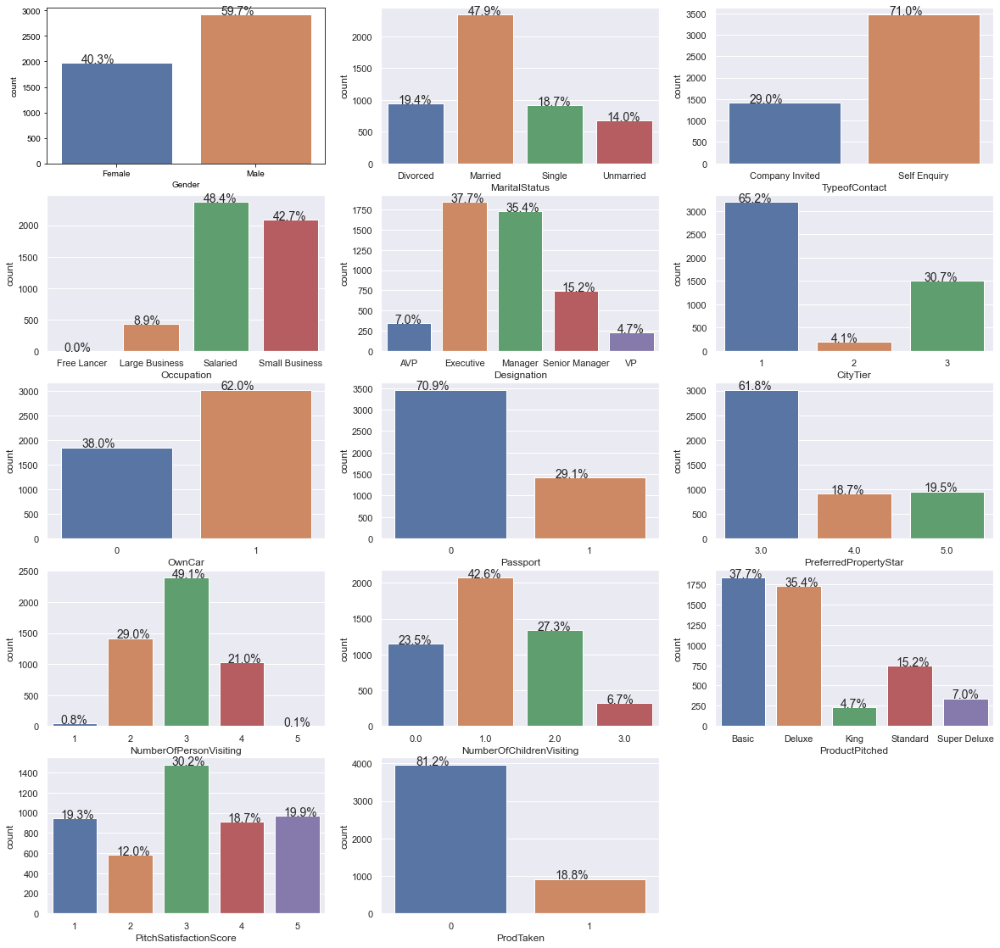

In [47]:
#perc_on_bar(df['ProdTaken'])
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(cat_col):
    ax=fig.add_subplot(10,3,i+1)
    perc_on_bar(df[col])

#### Observation and Insights

- This distribution data was listed out in the previous section. No new information. This is a visualization of what was outputted and commented. We will later look at some visualization with each of these with respect to ProdTaken 



### Continuous Variables

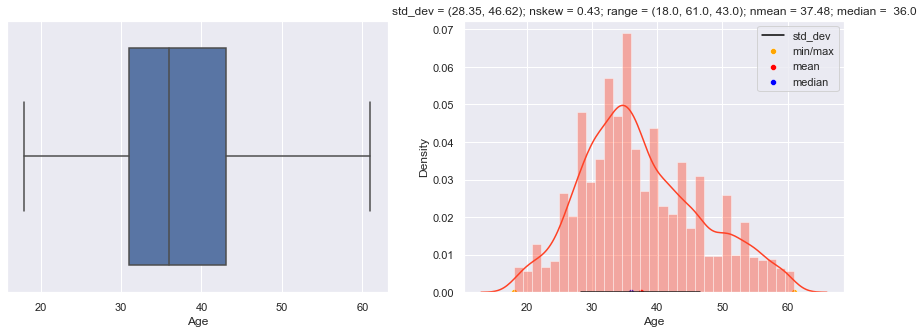

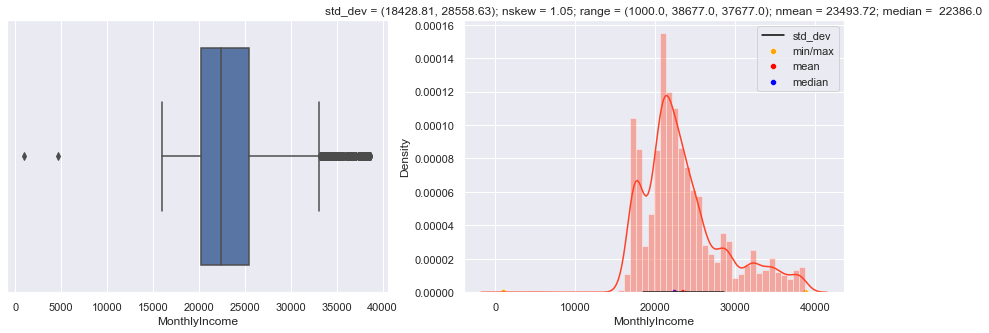

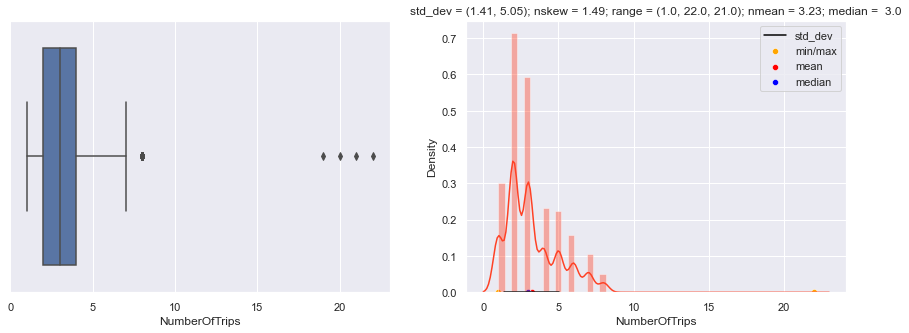

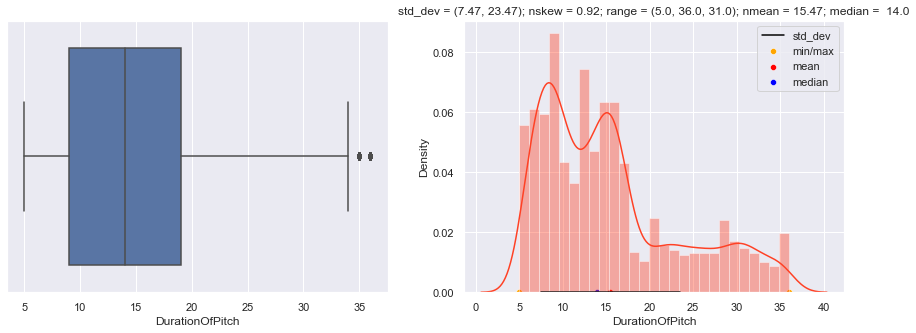

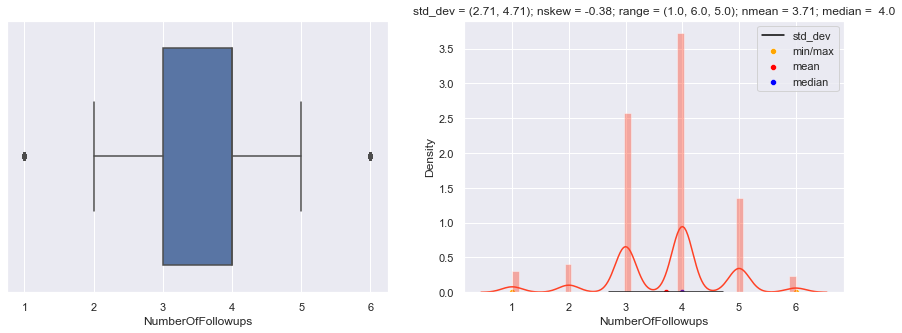

In [48]:
for col in (con_col):
    plot_cont_kde(df,df[col], l=15)

### Observations and Insights:

- Age column is normaly distrubuted with a slight right skew

- MonthlyIncome is an average of 23,493 units of payment. It is pretty normally distributed except for a couple outliers on the lower end of the spectrum.
  - Data Skewed to the right

- The number of trips for customers is usually between 2-4 but can range from 1 trip - 22 trips. There are not many people who takes trips more than 8 times
  - Heavily right skewed

- The duration of the product pitch lasts, on average, abbout 15.47 units of time. This data is skewed to thr right as the duration increases, there are less customers being pitched to.

- We can see the number of pitch followups is usually 3-4 times. Customers are rarely followed up with 6 times but are followed up 5 times more than 1-2 times
  - Data is slightly skewed to the left but the range is pretty small

## Bivariate & Multivariate Analysis
- Much of this will be done with respect to ProdTaken
- Oberserving insightful relationships between features to aid the travel company to gain more customers while keeping expenditure low

### ProdTaken against Continuous column

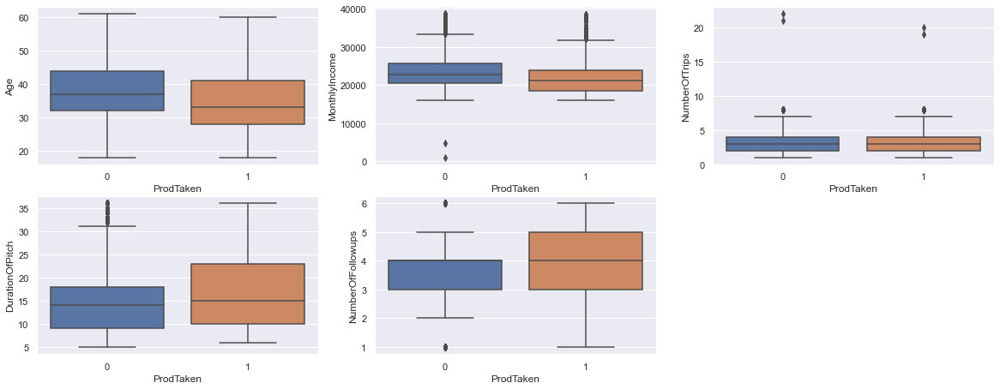

In [49]:
#fig=plt.figure(figsize=(20,40))
#for i,col in enumerate(con_col):
#    ax=fig.add_subplot(10,3,i+1)
#    sns.boxplot(y=df[col],x=df['ProdTaken'])

fig=plt.figure(figsize=(20,40))
for i,col in enumerate(con_col):
    ax=fig.add_subplot(10,3,i+1)
    sns.boxplot(x=df['ProdTaken'],y=df[col])

> This shows us that there is a slightly lower distribution of age and monthly income amongst those who have taken a prodcut. The duration of the pitch and the number of followups also contributes to this.

### ProdTaken Against Continuous Columns with regards to ProductPitched

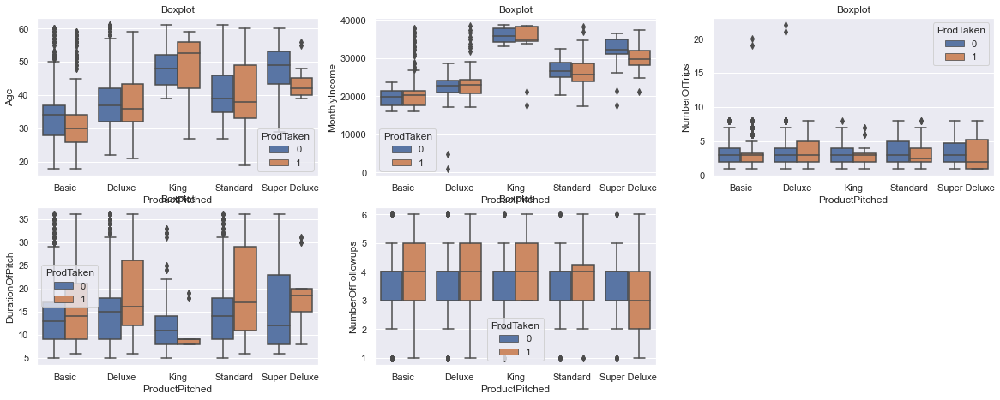

In [50]:
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(con_col):
    ax=fig.add_subplot(10,3,i+1)
    #Grouped_Box_Plot(df, col, 'ProdTaken', 'ProductPitched')
    Grouped_Box_Plot(df, col, 'ProductPitched', 'ProdTaken') 

#### Observations and Insights
- As customers get older, they are pitched higher tier packages
  - Basic packages are pitched to younger ages as we see the distribution on the lower end of the graph
    - Basic packages are usually purchased by younger ages with the average being about 30
  - Standard packages are pitched to almost all ages over 25 but all ages have purchased one
  - Deluxe Packages are advertised to almost all ages and the distribution of those who have purchased one is also pretty even, with slightly higher ages shown than in Basic and Standard
  - Super Deluxe Packages are usually pitched to those over 40 and almost everyone who has purchased one is above the age of 39
  - King packages are advertised to everyone but mostly to the higher ages
    - No customers who were advertised King packages under 40 years oldbought one
    - Customers who purchase a king package are also usually over 40 years old

- We can see that higher tier products are pitched and bought by those higher MonthlyIncomes
  - Basic packages are pitched to mostly those within 18000-28000 
    - Basic packages are usually purchased by those within this range but there are outliers who have bought Basic packages with MonthlyIncomes all the way up to 40,000
  - Standard packages are pitched to those with a little bit higher incomes and we see those with higher incomes buy more often
  - Deluxe Packages are advertised to those with a little less monthly income than when compared to the lower-tier Standard Package.
    - The customers are distributed well between purchsing and not purchasing but we see outliers with higher monthly incomes buy Deluxe packages
  - Super Deluxe Packagesare advertised to those with incomes over 27000 usually but the average of those who take it is lower than those who don't take it when pitched to them
  - King packages are advertised to those with the higest incomes above 33,000 and these are also the highest tier packages- which makes sense that those with higher incomes will be able to afford it

- We can see that Super Deluxe and Deluxe packages have the greatest distribution of being bought when there are a higher number of trips taken by the customer
  - Basic and King packages are taken even when number of trips are low
  - The NumberOfTrips column may not provide significant enough information

### Distribution Density of each Continuous column depending if they purchased package

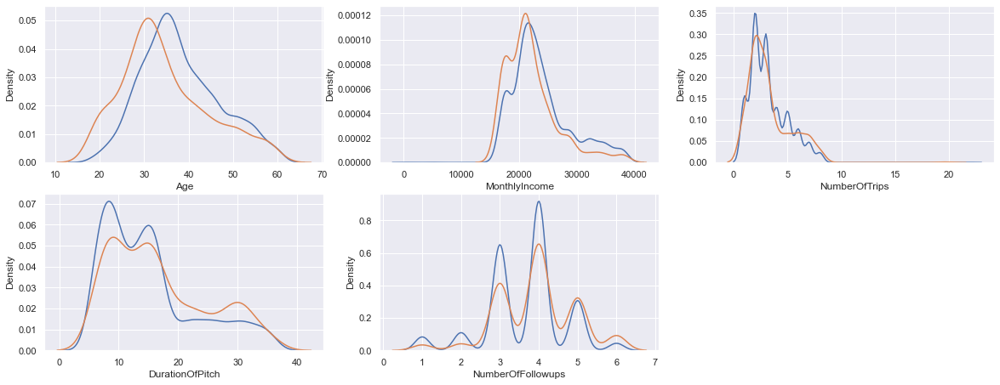

In [51]:
# Plot to show distribution density within each column depending if they took a product
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(con_col):
    ax=fig.add_subplot(10,3,i+1)
    ax1=sns.distplot(df[col][df['ProdTaken']==0],hist=False, label='ProdTaken=0')
    sns.distplot(df[col][df['ProdTaken']==1],hist=False,ax=ax1, label='ProdTaken=1')

#### Observations and Insights

- The Prod Taken feature shows some variation amongst these continuous columns
- Monthly Income is positvely correlated to the probability a customer will take on a product
    - This has been highlighted in *visualizations*


### ProdTaken against Categorical Columns

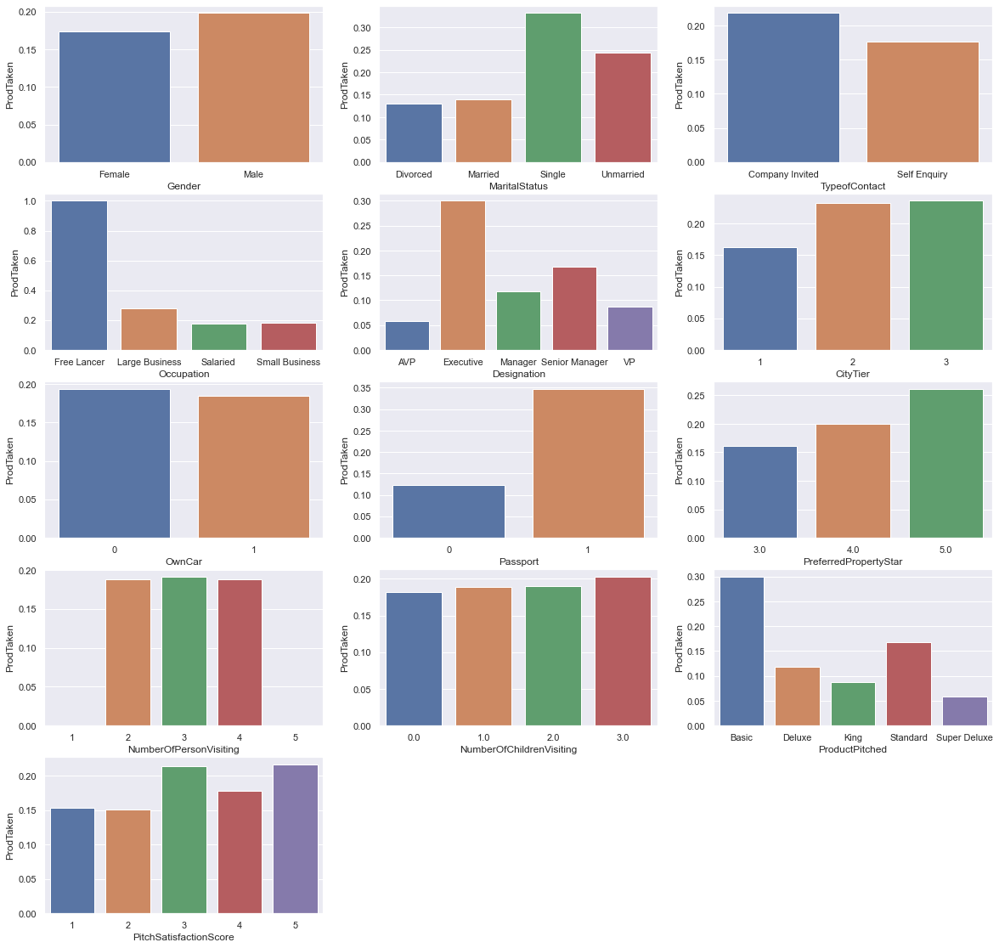

In [52]:
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(cat_col_dep):
    ax=fig.add_subplot(10,3,i+1)
    sns.barplot(x=col,y='ProdTaken',data=df,ci=None)

> This data represents the data distribution amongst categorical columns. This is a visualization of analysis that was done earlier. Let's look at this data with regards to the ProductPitched

### ProdTaken Against **Categorical** Columns with regards to ProductPitched

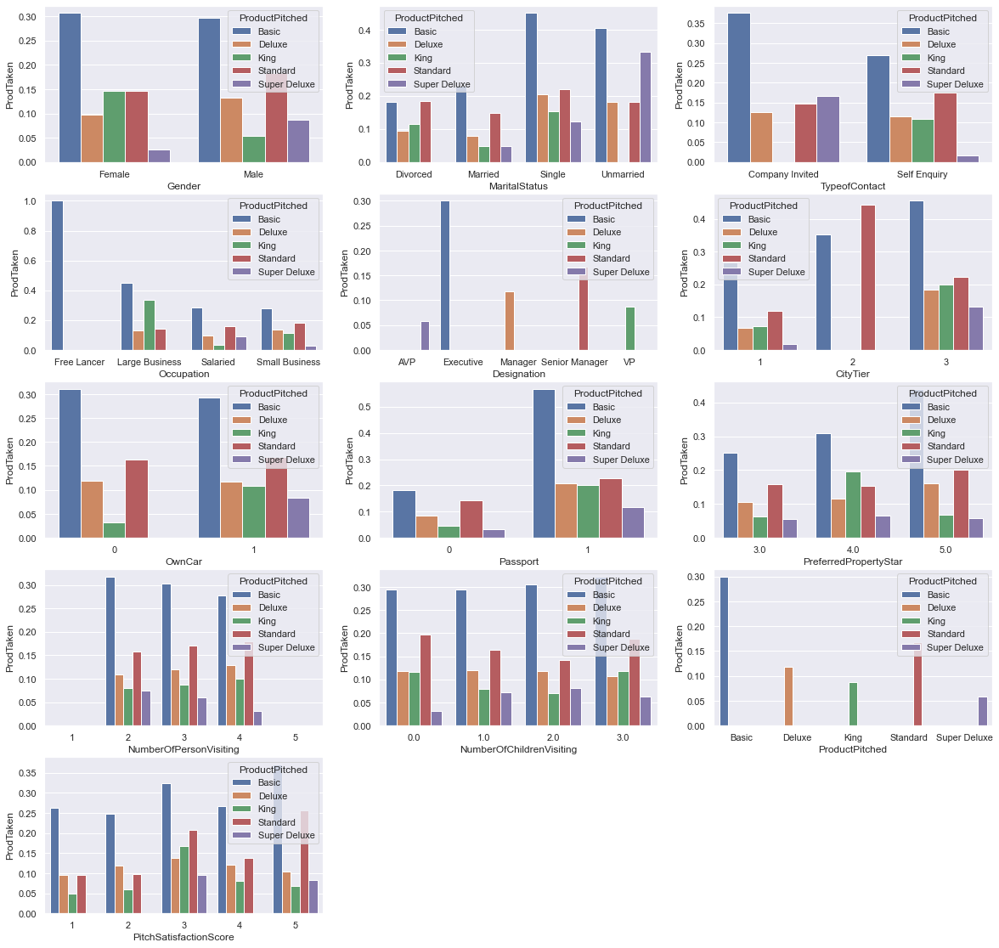

In [53]:
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(cat_col_dep):
    ax=fig.add_subplot(10,3,i+1)
    sns.barplot(x=col,y='ProdTaken', hue='ProductPitched',data=df,ci=None)

#### Observations and Insights
-Between Males and Females, we see that the basic package is the most likely to be purchased
  - Males are more likely to purchase Standard and Super Deluxe packages than females
    - Females buy the Super Deluxe package less than 5% of the time
  - Females are more likely to purchase King packages than males

- We see that Unmarried and Single customers are the most likely to buy a package while Divorced and Married buy less often
  - Unmarried individuals buy the Super Deluxe package over 30%, a lot more often than other Martial Statuses but are not pitched the King product
    - Unmarried individuals also buy the Basic package about 40% of the time
  - Single Customers buy the Basic package almost 50% of the time when pitched to
  - Divorced customers end up buying a package less than 15% of the time and are not pitched the Super Deluxe
  - Married Customers buy a product less than 15% of the time as well with King and Super Deluxes returning a purchase less than 5%.

- Customers that are Company Invited contacts tend to return overall better package purchsing ratios, but we see that King packages are not pitched to those Company Invited
  - The Basic is most preferred with with Company Invited with over 35% buying the package
  - Self Enquired customers end up buying Basic and Standard packages about 20% of the time

- The Occupation 'Free Lancer' shows that bought the Basic package every time it was offered to them
  - There are only 2 'Free Lancer' customers so we have to keep this in mind
    - Not as significant as it may seem but we will see during model building
  - Large Business customers buy the Basic package over 45% of the time and the King package over 30% of the time when pitched to!
  - Salaried customers rarely buy King packages, and Small businesses rarely buy Super Deluxe packages

- Customers with certain designations are pitched only certain types of products
  - Data engineering will be done to combine Manager and Senior Managers into one group, and VP and AVP into one group
  - Executives are only pitched Basic packaged and return 30% of purchased products
 

- Customers living in City Tier 2 were only advertised Basic and Standard Packages and had above a 35% return on the package being bought
  - City Tier 1 customers should only be advertised Basic Products as the return for the rest of the packages are lower than 10%
  - We see the Basic package is usually purchased CityTier 3 with over 40% return
  - Similarly, Standard packages do exceptionally well in City Tier 2 with over 40% of customers buying the package

- Customers who own a car are a little bit more likely to purchase a product
  - Customers who own a car are much more likely to buy a King or Super Deluxe Package than customers who don't
  - Customers who don't own a car should only be pitched Basic and Standard packages as others return low rates of return

- Customers with no passport are a lot less likely to buy a package
  - Customers with a passport that are pitched a Basic product end up buying a product over 50% of the time! Standard, Deluxe, and Super Deluxe are purchased about 20% of the time

- Customers with a higher preferred property star are more likely to purchase a product
  - Preferred Property Star of 5 are more likely to purchase a product but still buy the Basic Package most often with over 45% return. King packages are only 10% likely to be purchased by these customers
  - Customers with a preferred property star of 4 are likely to buy a King package at 20% and more likely to buy a Basic package at 30% of them buying it

- Customers purchases of packages is pretty even regardless of NumberOfPersonsVisiting but the product type makes a differense as well
  - Standard and Deluxe packages goes up as Number of Persons Visiting increases (15% to 20%)
  - Customers are less likely to buy Basic packages as Number of Persons Visiting increases (35% to 25%)
  - Customers purchase King Packages more likely as Persons visiting increases, but still overall sits at 10% which is relatively low

- Regardless of Number of Children Visiting, The likelihood of customers buying a product is changed minimally
  - Data Engineering on this column will be needed to change it to whether customer has a child or not

- PitchSatisfactionScore yields more packages purchased as the score gets better- as expected
  - A score of 4 is slightly less likely to be purchased but scores 3-5 are a lot more likely to be purchased than scores of 1 or 2
  - The Policymaker must make sure that the employee's pitch delivery is good enough to satisfy customers
  - Basic package is bought at least 25% of the time regardless of the PitchSatisfactionScore and it increases significantly at a score of 3 and a score of 5
  - Standard packages see the best results when paired with a higher satisfaction score


### ProdTaken with regards to ProductPitched and Duration of Pitch

> This shows us the Duration of Pitch for customers who took the product and which product it was


<Figure size 1440x720 with 0 Axes>

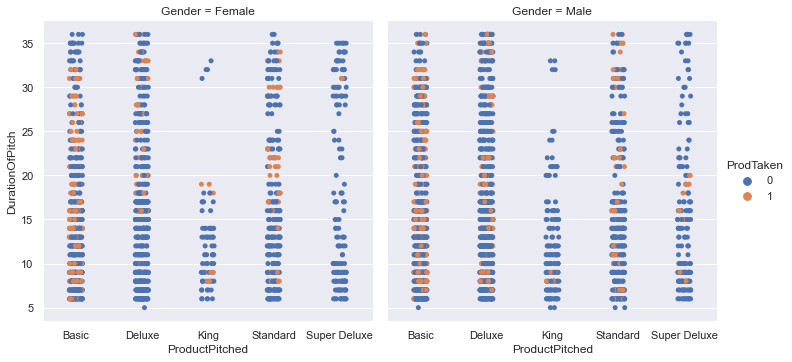

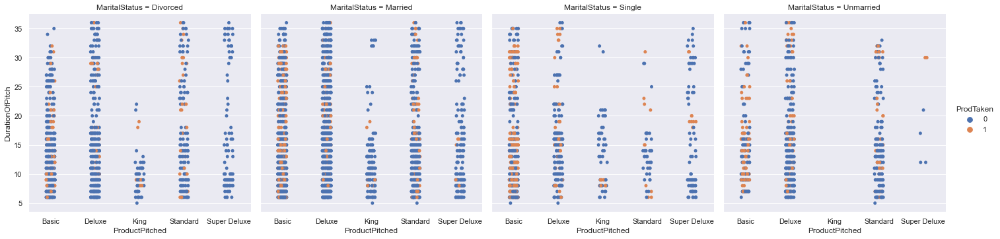

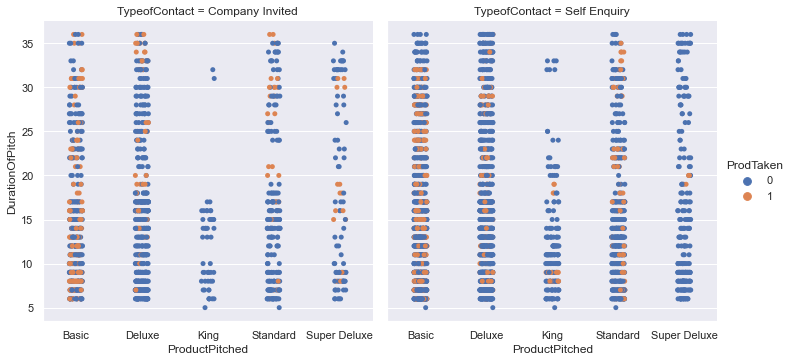

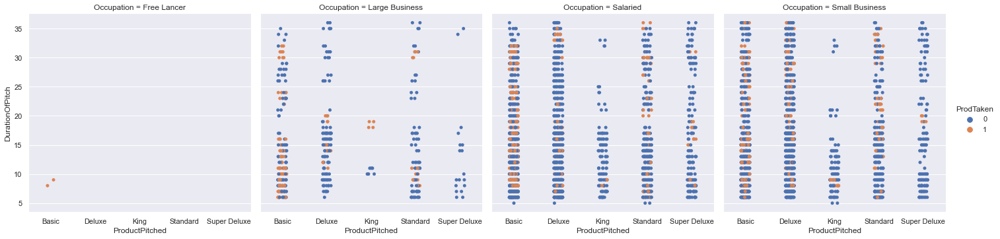

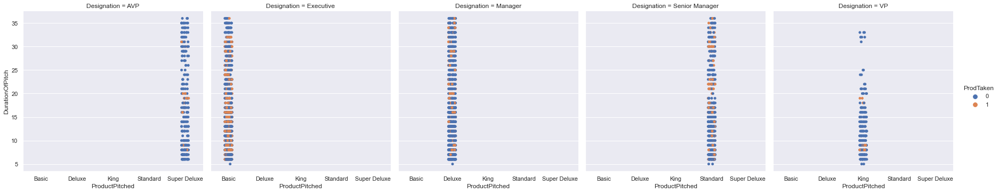

...

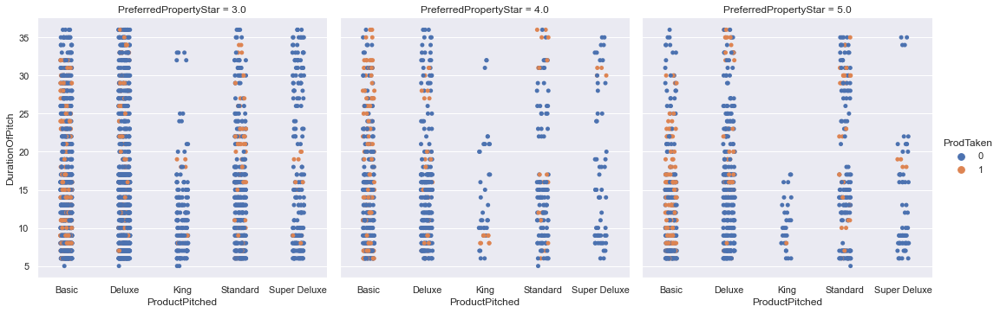

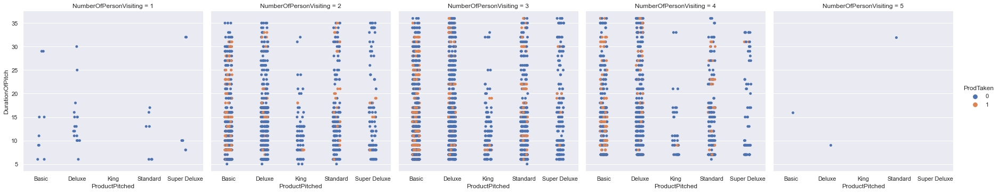

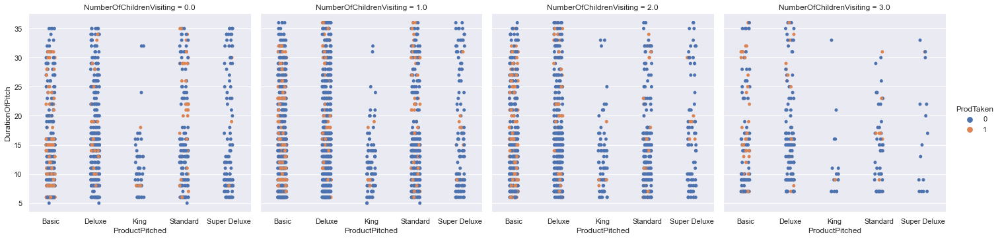

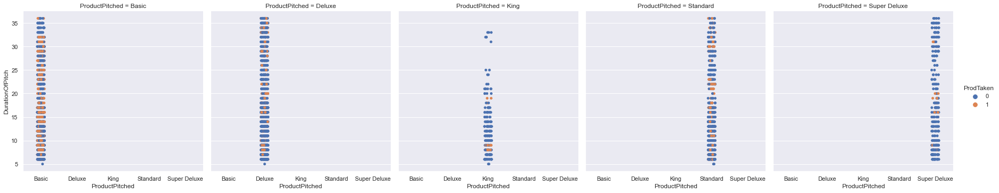

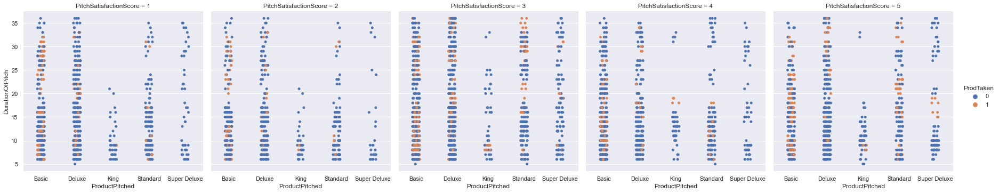

In [54]:
fig=plt.figure(figsize=(20,10))
for i,col in enumerate(cat_col_dep):
    #ax=fig.add_subplot(10,3,i+1)
    sns.catplot(x= 'ProductPitched', y='DurationOfPitch' ,hue= 'ProdTaken', col= col, data = df)
#sns.catplot(x= 'ProductPitched', y='DurationOfPitch' ,hue= 'ProdTaken', col= 'Designation', kind = 'swarm', data = df)
#sns.catplot(x= 'ProductPitched', y='DurationOfPitch' ,hue= 'ProdTaken', col= 'Designation', kind = 'violin', data = df)
# sns.catplot(x= 'ProductPitched', y='DurationOfPitch' ,hue= 'ProdTaken', col= 'MaritalStatus', kind = 'swarm', data = df)

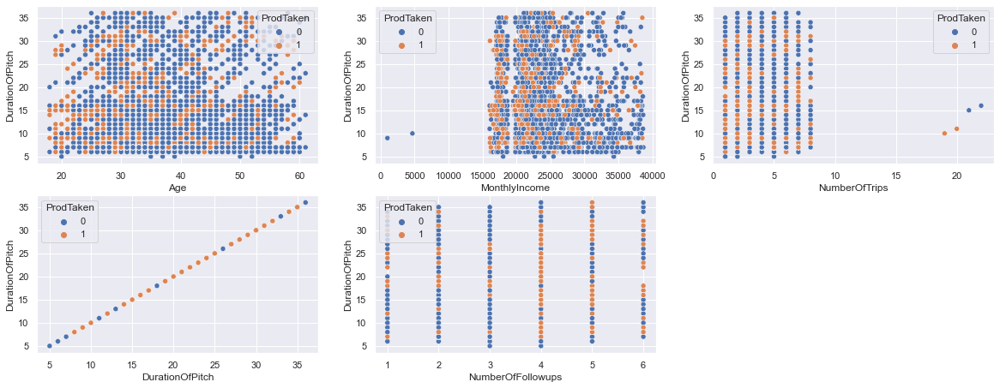

In [55]:
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(con_col):
    ax=fig.add_subplot(10,3,i+1)
    sns.scatterplot(col,'DurationOfPitch',hue='ProdTaken',data=df)

> These graphs show us the Duration of the Pitch for customers in regards to how much time is given for them and how likely they are to take the product after that. This data is interesting to see that the King Package usually is not pitched for that long. Many relationships seen here have been noted in comments for the Policy maker and marketing team to have a greater understaneding of the data

### ProdTaken with regards to ProductPitched and MonthlyIncome

> This shows us the Monthly Income for customers who took the product and which product it was

<Figure size 1440x720 with 0 Axes>

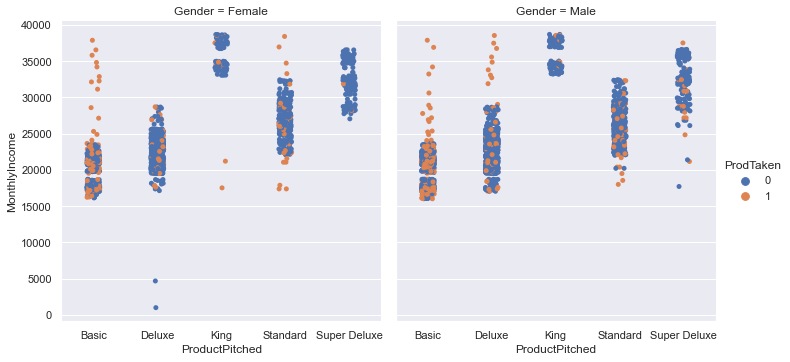

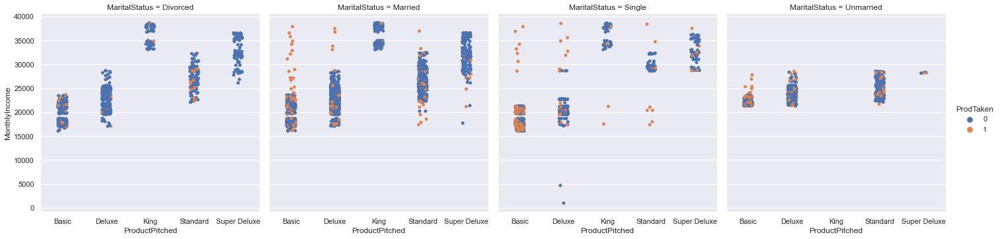

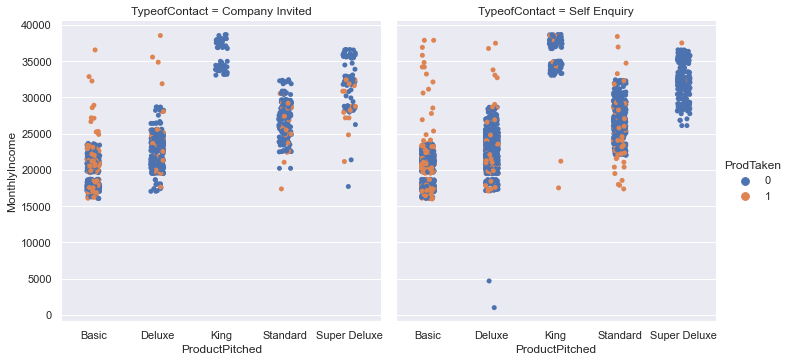

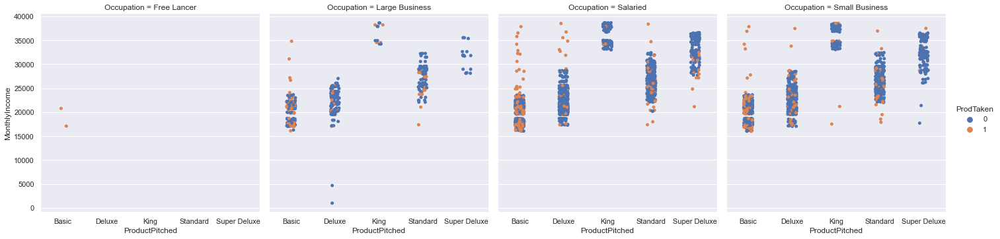

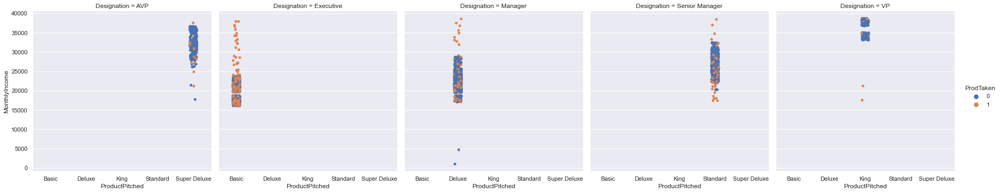

...

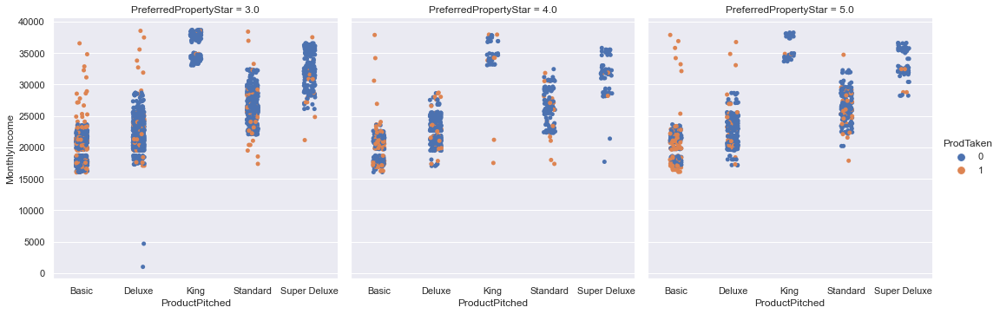

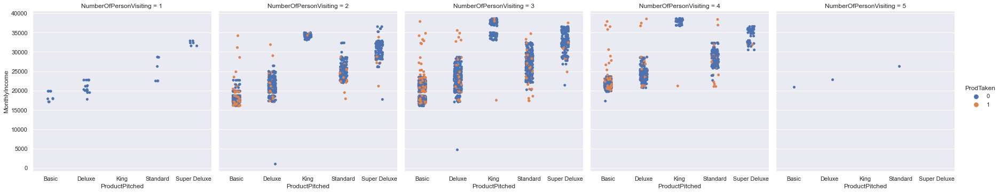

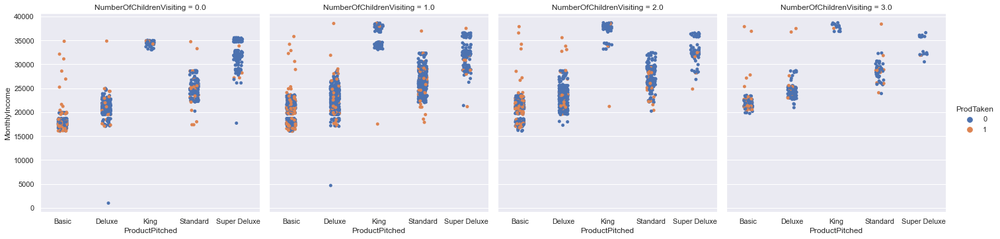

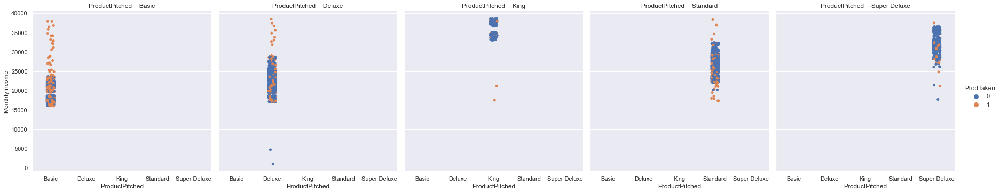

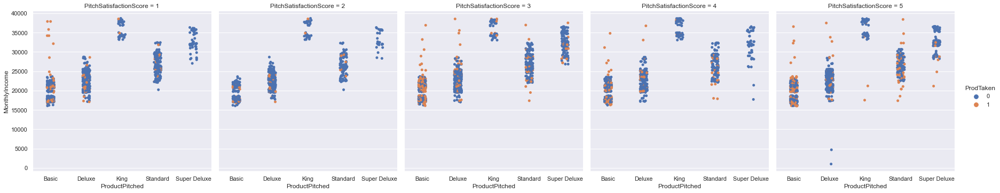

In [56]:
fig=plt.figure(figsize=(20,10))
for i,col in enumerate(cat_col_dep):
    sns.catplot(x= 'ProductPitched',col=col, y='MonthlyIncome', hue='ProdTaken', data = df) #, kind='violin')

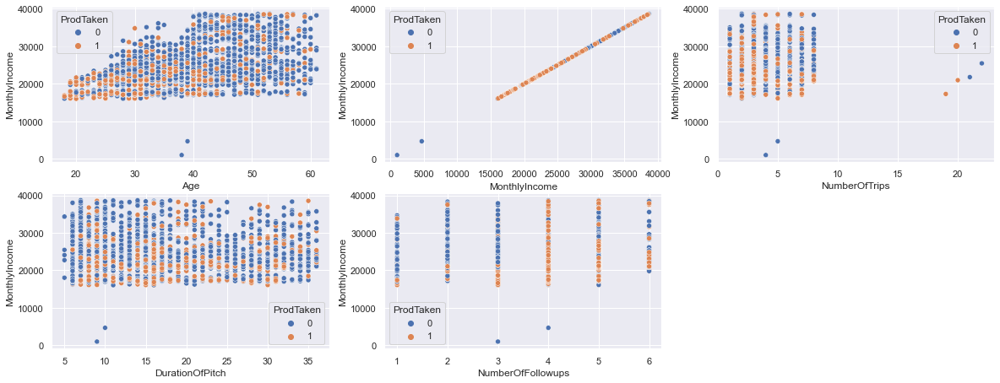

In [57]:
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(con_col):
    ax=fig.add_subplot(10,3,i+1)
    sns.scatterplot(col,'MonthlyIncome',hue='ProdTaken',data=df)

> Only customers with a high monthly income were pitched King packages. We see that many customers who have an income of over 25,000 are likely to purchase a basic or deluxe plan. Divorced customers have relatively higher monthlyincomes and they are advertised all package, but don't purchase them very often regardless of income. 

## Pairplot Overview

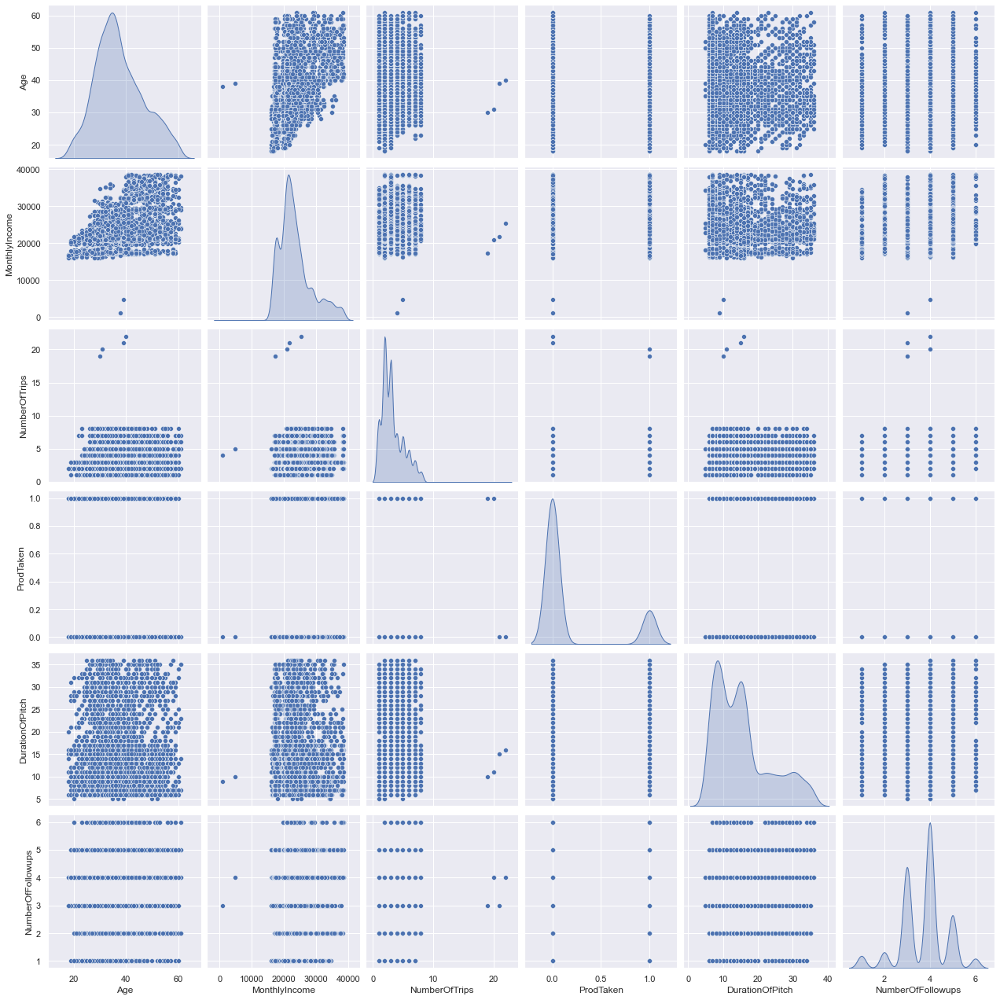

In [58]:
sns.pairplot(df, diag_kind='kde', height=3, aspect=1)

> There are no notable significanes so let's add information about whether they took the product

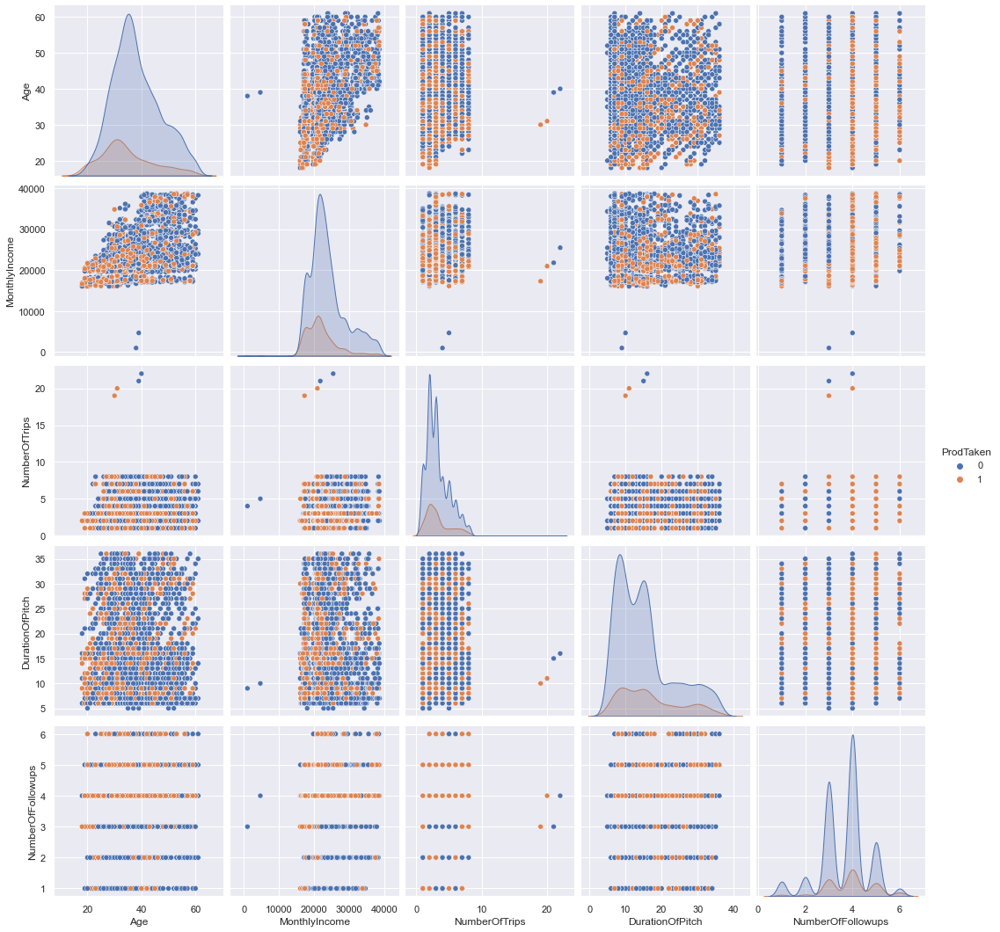

In [59]:
sns.pairplot(df, hue='ProdTaken', diag_kind='kde', height=3, aspect=1)

> Much of this information has been noted already but we see that younger individuals with average monthly incomes buy packages more often than older customers. The duration of pitch also seems to be lower for those who bought a packge as the montly incomes rises.

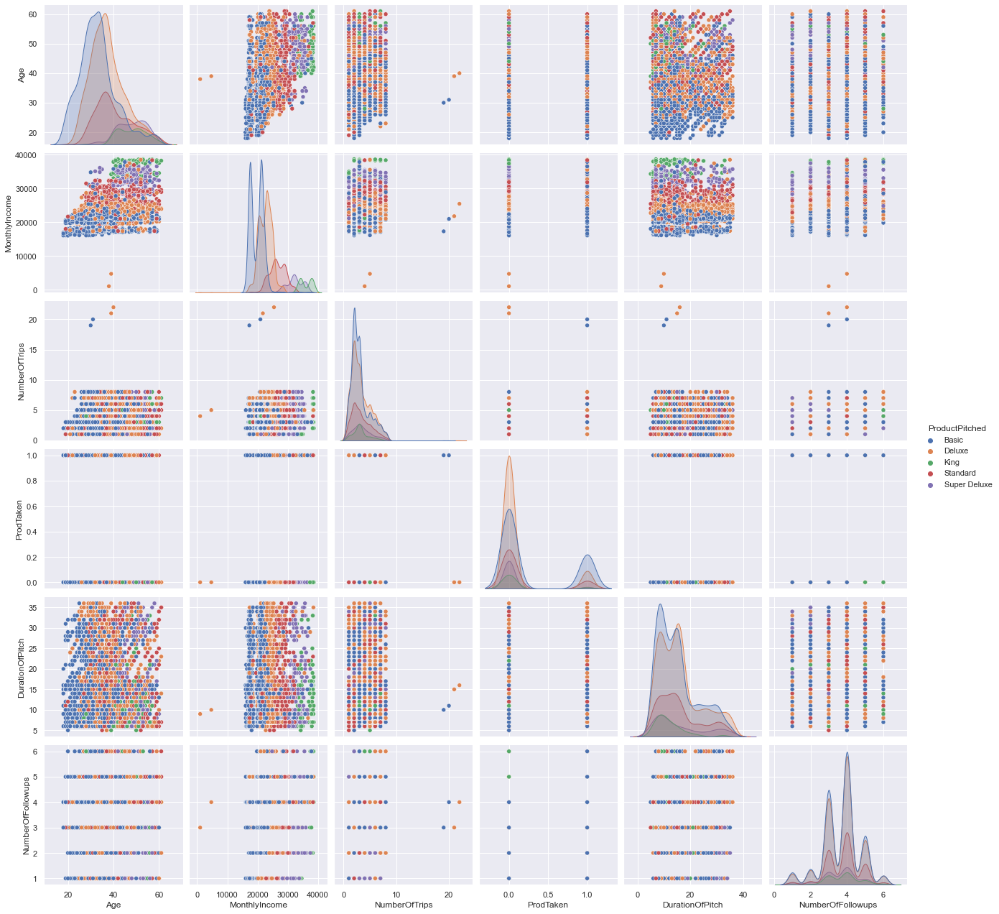

In [60]:
sns.pairplot(df, hue='ProductPitched', diag_kind='kde', height=3, aspect=1) # With regards to the 'ProductPitched' to get an idea of the overall dataset

> We can see that the basic product is pitched to younger customers with a lower average monthly income. The deluxe package is often pitched to those who have average values of Montly income. The duration of the pitch stays distributed throughout. King packages are pitched to those who are older and make more money.

# Data Preprocessing / Feature Engineering

1. Treating outliers
2. Feature Engingeering
3. Proper datatypes conversion
4. Investigating which feature to remove between Age and Experience to avoid Multicolinearity!


## Outliers
This data was highlighted in the data visualization section. Let's look at it again:

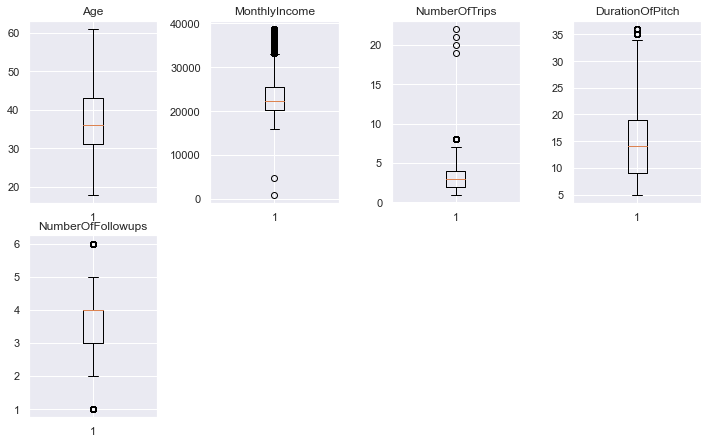

In [61]:
plt.figure(figsize=(10,15))
for i, variable in enumerate(con_col):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(df[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

### Oberservation:
- While there are outliers as defined by the IQR, they are not significantly unrealistic to see in the real-world.
- The only issue I saw during my analysis was that MonthlyIncome can be as low as 1000 but also as high as 100,000. While these are real-world scenarios, they shouldn't be removed from the dataset.


## Feature Engineering:
1. Restructuring columns according to tiers
* Designation is going to be combined to yield more general designations. This also had a direct perfect correlation with ProductPitched so this will help

2. Changing NumberOfChildrenVisiting to a binary categorical variable asking if they are bringing a child or not
* Currently, we have a column that describes the amount of people that are visiting with a customer
* That column includes children, so we can use this feature to extract whether or not they have a child under 5

### Restructuing Categorical Data in order of significance

In [62]:
df_engineer = df.copy()
df_engineer.columns

Index(['Age', 'Gender', 'MaritalStatus', 'TypeofContact', 'Occupation',
       'Designation', 'MonthlyIncome', 'CityTier', 'OwnCar', 'Passport',
       'NumberOfTrips', 'PreferredPropertyStar', 'NumberOfPersonVisiting',
       'NumberOfChildrenVisiting', 'ProductPitched', 'ProdTaken',
       'DurationOfPitch', 'NumberOfFollowups', 'PitchSatisfactionScore'],
      dtype='object')

In [63]:
replaceStruct = {
                "ProductPitched": {"Basic": 1, "Standard": 2 ,"Deluxe": 3 ,"Super Deluxe":4, "King":5},
                 "Designation": {"Executive": 1, "Manager": 2 , "Senior Manager": 2, "AVP": 3,"VP": 3},
                #"MaritalStatus": {"Single": 1, "Unmarried": 2, "Married": 3, "Divorced": 4 }
                    }
df_engineer = df_engineer.replace(replaceStruct)
df_engineer

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,NumberOfChildrenVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore
0,41.0,Female,Single,Self Enquiry,Salaried,2,20993.0,3,1,1,1.0,3.0,3,0.0,3,1,6.0,3.0,2
1,49.0,Male,Divorced,Company Invited,Salaried,2,20130.0,1,1,0,2.0,4.0,3,2.0,3,0,14.0,4.0,3
2,37.0,Male,Single,Self Enquiry,Free Lancer,1,17090.0,1,0,1,7.0,3.0,3,0.0,1,1,8.0,4.0,3
3,33.0,Female,Divorced,Company Invited,Salaried,1,17909.0,1,1,1,2.0,3.0,2,1.0,1,0,9.0,3.0,5
4,34.0,Male,Divorced,Self Enquiry,Small Business,1,18468.0,1,1,0,1.0,4.0,2,0.0,1,0,8.0,3.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,49.0,Male,Unmarried,Self Enquiry,Small Business,2,26576.0,3,1,1,2.0,4.0,3,1.0,3,1,9.0,5.0,1
4884,28.0,Male,Single,Company Invited,Salaried,1,21212.0,1,1,1,3.0,3.0,4,2.0,1,1,31.0,5.0,3
4885,52.0,Female,Married,Self Enquiry,Salaried,2,31820.0,3,1,0,7.0,4.0,4,3.0,2,1,17.0,4.0,1
4886,19.0,Male,Single,Self Enquiry,Small Business,1,20289.0,3,0,0,3.0,3.0,3,2.0,1,1,16.0,4.0,5


### NumberOfChildrenVisiting Feature to HasChild

In [64]:
df_engineer.NumberOfChildrenVisiting.value_counts().sum

<bound method Series.sum of 1.0    2079
2.0    1335
0.0    1147
3.0     325
Name: NumberOfChildrenVisiting, dtype: int64>

In [65]:
df_engineer['HasChild'] = df_engineer['NumberOfChildrenVisiting']
replaceStruct = {
                "HasChild": {1: 1, 2: 1 ,3: 1,0: 0}
                 }
df_engineer = df_engineer.replace(replaceStruct)
df_engineer.drop(columns='NumberOfChildrenVisiting', inplace=True)
df_engineer

,Age,Gender,MaritalStatus,TypeofContact,Occupation,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore,HasChild
0,41.0,Female,Single,Self Enquiry,Salaried,2,20993.0,3,1,1,1.0,3.0,3,3,1,6.0,3.0,2,0
1,49.0,Male,Divorced,Company Invited,Salaried,2,20130.0,1,1,0,2.0,4.0,3,3,0,14.0,4.0,3,1
2,37.0,Male,Single,Self Enquiry,Free Lancer,1,17090.0,1,0,1,7.0,3.0,3,1,1,8.0,4.0,3,0
3,33.0,Female,Divorced,Company Invited,Salaried,1,17909.0,1,1,1,2.0,3.0,2,1,0,9.0,3.0,5,1
4,34.0,Male,Divorced,Self Enquiry,Small Business,1,18468.0,1,1,0,1.0,4.0,2,1,0,8.0,3.0,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,49.0,Male,Unmarried,Self Enquiry,Small Business,2,26576.0,3,1,1,2.0,4.0,3,3,1,9.0,5.0,1,1
4884,28.0,Male,Single,Company Invited,Salaried,1,21212.0,1,1,1,3.0,3.0,4,1,1,31.0,5.0,3,1
4885,52.0,Female,Married,Self Enquiry,Salaried,2,31820.0,3,1,0,7.0,4.0,4,2,1,17.0,4.0,1,1
4886,19.0,Male,Single,Self Enquiry,Small Business,1,20289.0,3,0,0,3.0,3.0,3,1,1,16.0,4.0,5,1


# Final Overview of Data &  Prep for Model
1. We will be looking at the dataframe information again
2. Insert dummy variables where needed while ensuring to drop the first dummy variable to avoid the trap
3. Create X and y dataframes with independent and depedent (target) variable
4. Split data for training/testing at .7/.3 respectively
5. Checking VIF scores


## Quick look at dataframe description

In [66]:
df_engineer.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,4886,NaN,NaN,NaN,37.4849,9.13365,18,31,36,43,61
Gender,4886,2,Male,2916,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MaritalStatus,4886,4,Married,2340,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TypeofContact,4886,2,Self Enquiry,3467,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Occupation,4886,4,Salaried,2366,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Designation,4886,NaN,NaN,NaN,1.74048,0.652988,1,1,2,2,3
MonthlyIncome,4886,NaN,NaN,NaN,23493.7,5064.91,1000,20268.5,22386,25411.2,38677
CityTier,4886,3,1,3188,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OwnCar,4886,2,1,3030,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Passport,4886,2,0,3466,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Creating dummy variables

In [67]:
df_dummy = df_engineer.copy()

dummie_cols = ['Gender','MaritalStatus','TypeofContact','Occupation']
df_dummy = pd.get_dummies(df_dummy, columns=dummie_cols, drop_first=True)
df_dummy.head(5)

,Age,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,ProductPitched,ProdTaken,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore,HasChild,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,TypeofContact_Self Enquiry,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business
0,41.0,2,20993.0,3,1,1,1.0,3.0,3,3,1,6.0,3.0,2,0,0,0,1,0,1,0,1,0
1,49.0,2,20130.0,1,1,0,2.0,4.0,3,3,0,14.0,4.0,3,1,1,0,0,0,0,0,1,0
2,37.0,1,17090.0,1,0,1,7.0,3.0,3,1,1,8.0,4.0,3,0,1,0,1,0,1,0,0,0
3,33.0,1,17909.0,1,1,1,2.0,3.0,2,1,0,9.0,3.0,5,1,0,0,0,0,0,0,1,0
4,34.0,1,18468.0,1,1,0,1.0,4.0,2,1,0,8.0,3.0,5,0,1,0,0,0,1,0,0,1


## Checking Product Taken distribution amongst this dataset

In [68]:
print("Original ProdTaken True Values    : {0} ({1:0.2f}%)".format(len(df_dummy.loc[df_dummy['ProdTaken'] == 1]), (len(df_dummy.loc[df_dummy['ProdTaken'] == 1])/len(df_dummy.index)) * 100))
print("Original ProdTaken False Values   : {0} ({1:0.2f}%)".format(len(df_dummy.loc[df_dummy['ProdTaken'] == 0]), (len(df_dummy.loc[df_dummy['ProdTaken'] == 0])/len(df_dummy.index)) * 100))

Original ProdTaken True Values    : 920 (18.83%)
Original ProdTaken False Values   : 3966 (81.17%)


## Splitting into X and y datasets for modeling

In [69]:
df_dummy = df_dummy.apply(pd.to_numeric)

y = df_dummy['ProdTaken']
X = df_dummy.drop(columns = 'ProdTaken')

df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4886 entries, 0 to 4887
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         4886 non-null   float64
 1   Designation                 4886 non-null   int64  
 2   MonthlyIncome               4886 non-null   float64
 3   CityTier                    4886 non-null   int64  
 4   OwnCar                      4886 non-null   int64  
 5   Passport                    4886 non-null   int64  
 6   NumberOfTrips               4886 non-null   float64
 7   PreferredPropertyStar       4886 non-null   float64
 8   NumberOfPersonVisiting      4886 non-null   int64  
 9   ProductPitched              4886 non-null   int64  
 10  ProdTaken                   4886 non-null   int64  
 11  DurationOfPitch             4886 non-null   float64
 12  NumberOfFollowups           4886 non-null   float64
 13  PitchSatisfactionScore      4886 

## Splitting the datasets for train/test
- We will also check to make sure data has been properly split
- We will also check to see if the training and test sets have evenly distributed value counts in ProdTaken
- **The Stratify arguments maintains the original distribution of classes in the target variable while splitting the data into train and test sets.**
- - When data (classification) exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets. 
- This is done by setting the `stratify` parameter to target variable in the train_test_split function.

In [70]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=24,stratify=y)
print(X_train.shape, X_test.shape)
X_test.head()

(3420, 22) (1466, 22)


,Age,Designation,MonthlyIncome,CityTier,OwnCar,Passport,NumberOfTrips,PreferredPropertyStar,NumberOfPersonVisiting,ProductPitched,DurationOfPitch,NumberOfFollowups,PitchSatisfactionScore,HasChild,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,TypeofContact_Self Enquiry,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business
4538,54.0,2,29612.0,3,0,1,2.0,3.0,4,2,14.0,5.0,1,1,0,1,0,0,1,0,0,1
1733,46.0,3,31872.0,3,1,1,4.0,4.0,3,4,8.0,5.0,5,0,0,1,0,0,1,1,0,0
3529,32.0,1,22762.0,1,1,0,3.0,3.0,3,1,10.0,4.0,4,1,0,0,0,1,0,0,1,0
2594,41.0,2,24283.0,1,1,0,3.0,4.0,3,3,33.0,4.0,2,1,0,1,0,0,0,0,0,1
1437,39.0,3,34431.0,1,0,0,3.0,3.0,2,5,15.0,3.0,4,1,1,0,1,0,0,0,1,0


### Distribution Checking

In [71]:
print("The trainning set contains {0:0.1f}% of the data given in the data set".format((len(X_train)/len(df_dummy.index)) * 100))
print("The test set contains {0:0.1f}% of the data given in the data set".format((len(X_test)/len(df_dummy.index)) * 100))

The trainning set contains 70.0% of the data given in the data set
The test set contains 30.0% of the data given in the data set


In [72]:
print("Original ProdTaken True Values    : {0} ({1:0.2f}%)".format(len(df_dummy.loc[df_dummy['ProdTaken'] == 1]), (len(df_dummy.loc[df_dummy['ProdTaken'] == 1])/len(df_dummy.index)) * 100))
print("Original ProdTaken False Values   : {0} ({1:0.2f}%)".format(len(df_dummy.loc[df_dummy['ProdTaken'] == 0]), (len(df_dummy.loc[df_dummy['ProdTaken'] == 0])/len(df_dummy.index)) * 100))
print("")
print("Training ProdTaken True Values    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training ProdTaken False Values   : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test ProdTaken True Values        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test ProdTaken False Values       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Original ProdTaken True Values    : 920 (18.83%)
Original ProdTaken False Values   : 3966 (81.17%)

Training ProdTaken True Values    : 644 (18.83%)
Training ProdTaken False Values   : 2776 (81.17%)

Test ProdTaken True Values        : 276 (18.83%)
Test ProdTaken False Values       : 1190 (81.17%)



## Multicolinearity Check
* We are investigating VIF scores. Any values over a threshold of 5 should be treated.
* We are using basic model metrics to choose the better variable to keep.

In [73]:
def treating_multicollinearity(high_vif_columns, x_train, x_test, y_train, y_test):
    """
    Drop every column that has VIF score greater than 5, one by one.
    Look at the scores of this model and drop the  lowest outputs
    """
    # build ols models by dropping one of these at a time and observe the metrics
    for cols in high_vif_columns:
        train = x_train.loc[:, ~x_train.columns.str.startswith(cols)]
        test = x_test.loc[:, ~x_test.columns.str.startswith(cols)]
        # Create the model
        model = LogisticRegression(random_state=0)
        model.fit(train, y_train)
        pred_train = model.predict(train)
        pred_test = model.predict(test)
        print("Accuracy on training set : ",accuracy_score(pred_train,y_train))
        print("Accuracy on test set : ",accuracy_score(pred_test,y_test))
        print("Recall on training set : ",recall_score(y_train,pred_train))
        print("Recall on test set : ",recall_score(y_test,pred_test))
        print("Precision on training set : ",precision_score(y_train,pred_train))
        print("Precision on test set : ",precision_score(y_test,pred_test))
        print('F1 Score on train data:',f1_score(y_train, pred_train))
        print('F1 Score on test data:',f1_score(y_test, pred_test))
        print("------------------------")

In [74]:
num_feature_set = X.copy()
num_feature_set = add_constant(num_feature_set)
num_feature_set = num_feature_set.astype(float)

vif_series1 = pd.Series([variance_inflation_factor(num_feature_set.values,i) for i in range(num_feature_set.shape[1])],index=num_feature_set.columns, dtype = float)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

const                         2558.317014
Age                              1.431922
Designation                     16.818617
MonthlyIncome                    3.583098
CityTier                         1.102222
OwnCar                           1.015493
Passport                         1.007994
NumberOfTrips                    1.089231
PreferredPropertyStar            1.009507
NumberOfPersonVisiting           1.472351
ProductPitched                  11.411361
DurationOfPitch                  1.015367
NumberOfFollowups                1.198107
PitchSatisfactionScore           1.013689
HasChild                         1.287258
Gender_Male                      1.010975
MaritalStatus_Married            1.816323
MaritalStatus_Single             1.648396
MaritalStatus_Unmarried          1.515469
TypeofContact_Self Enquiry       1.007285
Occupation_Large Business      200.217025
Occupation_Salaried            615.798498
Occupation_Small Business      603.344727

In [75]:
high_vif_columns = ['Designation', 'ProductPitched']
treating_multicollinearity(high_vif_columns, X_train, X_test, y_train, y_test)

Accuracy on training set :  0.8380116959064328
Accuracy on test set :  0.8335607094133697
Recall on training set :  0.22981366459627328
Recall on test set :  0.21014492753623187
Precision on training set :  0.7184466019417476
Precision on test set :  0.6904761904761905
F1 Score on train data: 0.3482352941176471
F1 Score on test data: 0.3222222222222222
------------------------
Accuracy on training set :  0.8385964912280702
Accuracy on test set :  0.834924965893588
Recall on training set :  0.21894409937888198
Recall on test set :  0.2028985507246377
Precision on training set :  0.7421052631578947
Precision on test set :  0.717948717948718
F1 Score on train data: 0.3381294964028777
F1 Score on test data: 0.3163841807909605
------------------------


- Designation and ProducttPitched are still showing collinearity even after feature engineering
- Metric scores on base logistic model is very similar but fits better to the test data with ProductPitched
- We are going to drop this column, resplit data, and recheck VIF scores

In [76]:
X.drop(columns='Designation',inplace=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=24,stratify=y)
print(X_train.shape, X_test.shape)

(3420, 21) (1466, 21)


In [77]:
num_feature_set = X.copy()
num_feature_set = add_constant(num_feature_set)
num_feature_set = num_feature_set.astype(float)

vif_series1 = pd.Series([variance_inflation_factor(num_feature_set.values,i) for i in range(num_feature_set.shape[1])],index=num_feature_set.columns, dtype = float)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

const                         2558.037044
Age                              1.405817
MonthlyIncome                    2.397355
CityTier                         1.083064
OwnCar                           1.015226
Passport                         1.007789
NumberOfTrips                    1.088991
PreferredPropertyStar            1.008323
NumberOfPersonVisiting           1.433325
ProductPitched                   2.170452
DurationOfPitch                  1.011072
NumberOfFollowups                1.187629
PitchSatisfactionScore           1.013484
HasChild                         1.271767
Gender_Male                      1.008945
MaritalStatus_Married            1.816314
MaritalStatus_Single             1.644876
MaritalStatus_Unmarried          1.513659
TypeofContact_Self Enquiry       1.006511
Occupation_Large Business      200.215257
Occupation_Salaried            615.785157
Occupation_Small Business      603.330464
dtype: float64



* There's no more multicollinearity present
  * Dummy variables do not get considered for high VIF scores

* We can move onto Modeling a predictive classifier to help determine who is likely to purchase a product

## Model Defined Functions (Metric Scores, Confusion Matrix, and more) 


In [78]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,train=X_train,test=X_test,train_y= y_train,test_y=y_test,flag=True):
    '''
    Function to calculate different metric scores of the model - Accuracy, Recall, Precision, and F1 score
    model: classifier to predict values of X
    train, test: Independent features
    train_y,test_y: Dependent variable
    threshold: thresold for classifiying the observation as 1
    flag: If the flag is set to True then only the print statements showing different will be displayed. The default value is set to True.

    '''
    # defining an empty list to store train and test results
    score_list=[]
    
    pred_train = model.predict(train)
    pred_test = model.predict(test)
    train_acc = accuracy_score(pred_train,train_y)
    test_acc = accuracy_score(pred_test,test_y)
    train_recall = recall_score(train_y,pred_train)
    test_recall = recall_score(test_y,pred_test)
    train_precision = precision_score(train_y,pred_train)
    test_precision = precision_score(test_y,pred_test)
    train_f1 = f1_score(train_y,pred_train)
    test_f1 = f1_score(test_y,pred_test)
    train_rocauc = roc_auc_score(train_y,pred_train)
    test_rocauc = roc_auc_score(test_y,pred_test)

    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1, test_f1, train_rocauc, test_rocauc))
     # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",accuracy_score(pred_train,train_y))
        print("Accuracy on test set : ",accuracy_score(pred_test,test_y))
        print("Recall on training set : ",recall_score(train_y,pred_train))
        print("Recall on test set : ",recall_score(test_y,pred_test))
        print("Precision on training set : ",precision_score(train_y,pred_train))
        print("Precision on test set : ",precision_score(test_y,pred_test))
        print("F1 Score on training set : ",f1_score(train_y,pred_train))
        print("F1 Score on test set : ",f1_score(test_y,pred_test))
        print('ROC-AUC Score on train data:',roc_auc_score(y_train, pred_train))
        print('ROC-AUC Score on test data:',roc_auc_score(y_test, pred_test))
        
    return score_list # returning the list with train and test scores))

In [79]:
#confusion matrix function for model evaluation
def make_confusion_matrix(model, y_actual ,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [80]:
#classification report function for model evaluation
def get_classification_report(model, train=X_train,test=X_test,train_y= y_train,test_y=y_test,flag=True):
    '''
    returns classification report for model

    '''
    # defining an empty list to store train and test results
    score_list=[]

    pred_train = model.predict(train)
    pred_test = model.predict(test)
    train_class = classification_report(train_y,pred_train)
    test_class = classification_report(test_y,pred_test)
    
    score_list.extend((train_class, test_class))     
     # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Classification report on training set :\n",classification_report(train_y,pred_train))
        print("Classification report on test set :\n",classification_report(test_y,pred_test))
    return score_list # returning the list with train and test scores

In [81]:
#Function to plot the ROC Curve for the Train and Test datasets
def plot_roc(model, X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test):
    #ROC Curve for Train
    logit_roc_auc_train = roc_auc_score(y_train, model.predict_proba(X_train)[:,1])
    fpr, tpr, thresholds = roc_curve(y_train, model.predict_proba(X_train)[:,1])
    plt.figure(figsize=(7,5))
    plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_train)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Train set - Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    #ROC Curve for Test
    logit_roc_auc_test = roc_auc_score(y_test, model.predict_proba(X_test)[:,1])
    fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
    plt.figure(figsize=(7,5))
    plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc_test)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Test set - Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

In [82]:
#Returing dataframe of coefficients, odds, and probability from Logistic Regression modeling
def get_coef_odds(model, X_train=X_train):
    log_odds = model.coef_[0]
    coef_df = pd.DataFrame(log_odds, X_train.columns, columns=['coef'])

    odds = (np.exp(np.abs(model.coef_[0]))-1)*100
    odds_df = pd.DataFrame(odds, X_train.columns, columns=['odds'])

    coef_odds_prob = coef_df.join(odds_df)

    coef_odds_prob['Probability'] = coef_odds_prob['odds']/(1+coef_odds_prob['odds'])
    pd.options.display.float_format = '{:.3f}'.format
    coef_odds_prob = coef_odds_prob.sort_values(by='odds', ascending=False)
    display(coef_odds_prob)

In [83]:
# Using a given threshold value, this function updates the model and evaluates the new metric scores
def give_threshold_score(threshold, model,X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    
    score_list=[]
    
    pred_train_opt = (model.predict_proba(X_train)[:,1]>threshold)
    pred_test_opt = (model.predict_proba(X_test)[:,1]>threshold)
    
    train_acc = accuracy_score(pred_train_opt, y_train)
    test_acc = accuracy_score(pred_test_opt, y_test)
    train_recall = recall_score(y_train,pred_train_opt)
    test_recall = recall_score(y_test,pred_test_opt)
    train_precision = precision_score(y_train,pred_train_opt)
    test_precision = precision_score(y_test,pred_test_opt)
    train_f1 = f1_score(y_train,pred_train_opt)
    test_f1 = f1_score(y_test,pred_test_opt)
    train_rocauc = roc_auc_score(y_train,pred_train_opt)
    test_rocauc = roc_auc_score(y_test,pred_test_opt)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1, test_f1, train_rocauc, test_rocauc))
     # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True:
        print('Accuracy on train data:',accuracy_score(y_train, pred_train_opt))
        print('Accuracy on test data:',accuracy_score(y_test, pred_test_opt))
        print('Recall on train data:',recall_score(y_train, pred_train_opt))
        print('Recall on test data:',recall_score(y_test, pred_test_opt))
        print('Precision on train data:',precision_score(y_train, pred_train_opt))
        print('Precision on test data:',precision_score(y_test, pred_test_opt))
        print('F1 Score on train data:',f1_score(y_train, pred_train_opt))
        print('F1 Score on test data:',f1_score(y_test, pred_test_opt))
        print('ROC-AUC Score on train data:',roc_auc_score(y_train, pred_train_opt))
        print('ROC-AUC Score on test data:',roc_auc_score(y_test, pred_test_opt))

    return score_list # returning the list with train and test scores

In [84]:
# Function to calculate recall score for training and test set
def get_recall_score(model):
    '''
    model : classifier to predict values of X

    '''
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
    print("Recall on test set : ",metrics.recall_score(y_test,pred_test))

# Modeling Begins



## Modeling Table of Contents:


1. Metric Insights
2. Bagging
  - Random Forest
  - Decision Tree
  - Bagging Classifier
3. Boosting
  - AdaBoost
  - Gradient Boost
  - XGBoost
4. Classifiers Comparison
5. Stacking Classifier
6. Final Classifier Analysis

For Each Classifier:
  - Each Classifier will be made as a base
  - Metric Scores will be given for the base for evaluation
  - Improving and Tuning the model using Hyparameter gridsearch or other methods will take place afterwards

## Preferred Metric Insights:

**Note: Assigning a class weight is important because of the imbalanced dataset.**


- *True Positives:* We correctly predict that customer will purchase new package and that was confirmed from the actual observations.
    - Reality: A customer bought the package
    - Model predicted: The customer will contribute to revenue making marketing expenditure more efficient
    - Outcome: The model is good as it helps the tourism company sell more packages with efficient marketing

- *True Negatives:* We correctly predicted that customer will NOT take the package and that was confirmed from the actual observations.
    - Reality: A customer did NOT make buy the package
    - Model predicted: The customer will NOT purchase a package
    - Outcome: The business did not waste marketing expenditures. This helps lient avoid making unnecessary targeting towards customers that won't buy the package.

- *False Positives:* We incorrectly predict that customer persons will purchase product BUT they did not (aka "Type I error")
    - Reality: A customer did NOT buy the package
    - Model predicted: The customer will contribute to revenue
    - Outcome: The team which is targeting the potential customers will be wasting their resources on the people/customers who will not be contributing to the revenue.

- *False Negatives:*  We incorrectly predict that customer will NOT take a package product BUT they did ("Type II error")
    - Reality: A customer made a purchase.
    - Model predicted: The customer will NOT contribute to revenue.
    - Outcome: The potential customer is missed by the marketing team, the team could have offered the potential customer more information
      - We need to minimize False Negatives so that the tourism company is not missing out on those who those who may purchase


----------------------------------------------------------
**What does a tourism company want?**
- The Policy Maker wants to enable and establish a viable business model to expand the customer base. This is being done by introdcuing a new offering of packages.
- Marketing Team wants to keep marketing expenditure efficient while also wanting to increase from 18% of customer purchasing packages 
- This will be achieved by targeting customers that are more likely to purchase the package using predictive modeling

* When the Client wants to minimize the loss - it can face 2 types of losses here: 
   1. Whenever the marketing team spends money & resources on customer, but customer don't end up purchasing a package.
   2. The marketing team doesn't target certain individuals that are likely to purchase a package- losing out on customer growth. Only 18% of last years customers purchased a package so we need to capture as much opportunity as possible.

**Which loss is greater?**
1. Predicting that customer will purchase the package but customer does not- wasting marketing expenditure.
2. Losing out on new customers and growth by missing opportunity.

- Since the Tourism company wants to grow but also not waste Marketing Expenditure, the focus should be on minimizing the false negatives so that the Policies can be made such that the Marketing Team spends resources efficiently on those customers that are predicted to more likely purchase the package. BUT also need to capture as much opportunity as possible to help the tourism company grow its customer base! 

F1 Score is the best measure to use if we need to seek a balance between Precision and Recall AND there is an uneven class distribution (large number of Actual Negatives).

**Since we want grow the customer base while also making sure to keep marketing expenditure efficient, we should use the F1 as a metric of model evaluation**

**In this case, not being able to identify a potential customer is similar to wasting marketing expenditure in terms of loss we can face. Hence, F1 score is the right metric to check the performance of the model.**


## Bagging Models

### Decision Tree Classifier (model name = dtree, dtree_tuned, dtree_ccp)

###### Base Decision Tree

Accuracy on training set :  1.0
Accuracy on test set :  0.9045020463847203
Recall on training set :  1.0
Recall on test set :  0.7246376811594203
Precision on training set :  1.0
Precision on test set :  0.7575757575757576
F1 Score on training set :  1.0
F1 Score on test set :  0.7407407407407408
ROC-AUC Score on train data: 1.0
ROC-AUC Score on test data: 0.8354280842771892


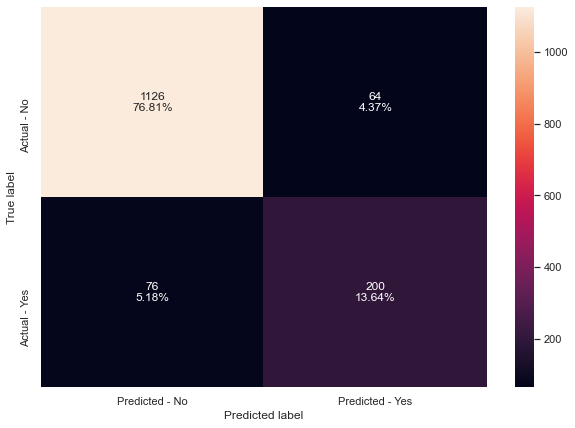

In [85]:
#Fitting the model
dtree = DecisionTreeClassifier(random_state=24, class_weight={0:0.18,1:0.82})
dtree.fit(X_train,y_train)

#Calculating different metrics
dtree_score = get_metrics_score(dtree)
#Creating confusion matrix
make_confusion_matrix(dtree,y_test)

> The base decision tree is overfitting the training data by a lot.
Let's try hyperparameter tuning or we can try cost-complexity tuning!

##### Decision Tree Hypertuning (model name = dtree_tuned)

In [86]:
#Choose the type of classifier. 
dtree_tuned = DecisionTreeClassifier(class_weight={0:0.18,1:0.82},random_state=24)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2,30), 
              'min_samples_leaf': np.arange(1,15),
              'max_leaf_nodes' : np.arange(2,30,2),
              'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
             }


# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_tuned, parameters, scoring=scorer,n_jobs=-1, verbose=2, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_tuned.fit(X_train, y_train)

Fitting 5 folds for each of 21952 candidates, totalling 109760 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 5040 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 14096 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 25776 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 40016 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 56880 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 76304 tasks      | elapsed:   57.6s
[Parallel(n_jobs=-1)]: Done 98352 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 109760 out of 109760 | elapsed:  1.4min finished


DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=5,
                       max_leaf_nodes=24, min_impurity_decrease=0.0001,
                       min_samples_leaf=7, random_state=24)

Accuracy on training set :  0.7573099415204678
Accuracy on test set :  0.7407912687585266
Recall on training set :  0.8043478260869565
Recall on test set :  0.7572463768115942
Precision on training set :  0.4238952536824877
Precision on test set :  0.4003831417624521
F1 Score on training set :  0.555198285101822
F1 Score on test set :  0.5238095238095238
ROC-AUC Score on train data: 0.7753727603057261
ROC-AUC Score on test data: 0.7471105833637803


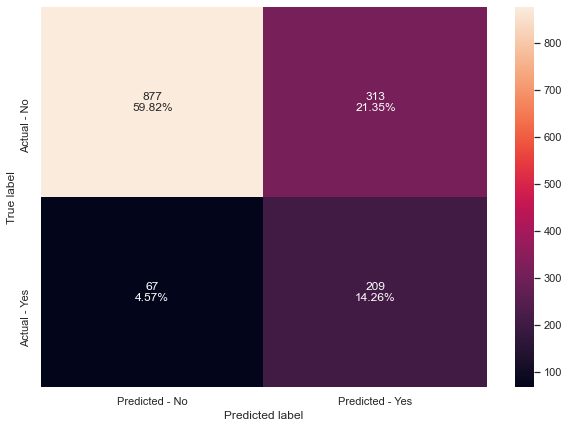

In [87]:
#Calculating different metrics
dtree_tuned_score = get_metrics_score(dtree_tuned)
#Creating confusion matrix
make_confusion_matrix(dtree_tuned,y_test)

> While the hypertuned model decreased training data scores, it definitely fit the testing data much better.
The recall score is good and fits well, but there is a low value for precision. Precision is also important in this situation!

Let's try Cost Complexity Pruning

##### Decision Tree Cost Complexity Pruning (model name = dtree_ccp)


The `DecisionTreeClassifier` provides parameters such as
``min_samples_leaf`` and ``max_depth`` to prevent a tree from overfiting. Cost
complexity pruning provides another option to control the size of a tree. In
`DecisionTreeClassifier`, this pruning technique is parameterized by the
cost complexity parameter, ``ccp_alpha``. Greater values of ``ccp_alpha``
increase the number of nodes pruned. Here we only show the effect of
``ccp_alpha`` on regularizing the trees and how to choose a ``ccp_alpha``
based on validation scores.

Total impurity of leaves vs effective alphas of pruned tree:

- Minimal cost complexity pruning recursively finds the node with the "weakest
link". The weakest link is characterized by an effective alpha, where the
nodes with the smallest effective alpha are pruned first. To get an idea of
what values of ``ccp_alpha`` could be appropriate, scikit-learn provides
`DecisionTreeClassifier.cost_complexity_pruning_path` that returns the
effective alphas and the corresponding total leaf impurities at each step of
the pruning process. As alpha increases, more of the tree is pruned, which
increases the total impurity of its leaves.

In [88]:
clf = DecisionTreeClassifier(class_weight={0:0.18,1:0.82},random_state=24)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [89]:
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000e+00,-2.304272e-16
1,1.555539e-19,-2.302717e-16
2,1.555539e-19,-2.301161e-16
3,2.333309e-19,-2.298828e-16
4,2.333309e-19,-2.296495e-16
...,...,...
262,1.007632e-02,4.040053e-01
263,1.023303e-02,4.142384e-01
264,1.643892e-02,4.306773e-01
265,2.073340e-02,4.514107e-01


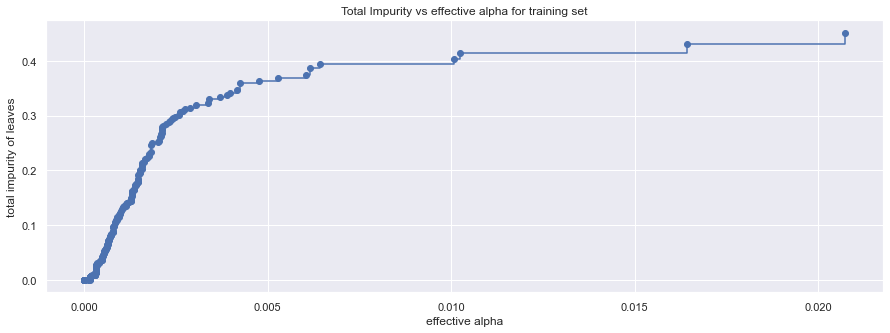

In [90]:
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

Next, we train a decision tree using the effective alphas. The last value
in ``ccp_alphas`` is the alpha value that prunes the whole tree,
leaving the tree, ``clfs[-1]``, with one node.

In [91]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=24, ccp_alpha=ccp_alpha, class_weight={0:0.18,1:0.82})
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.04820753377099918



For the remainder, we remove the last element in
``clfs`` and ``ccp_alphas``, because it is the trivial tree with only one
node. Here we show that the number of nodes and tree depth decreases as alpha
increases.

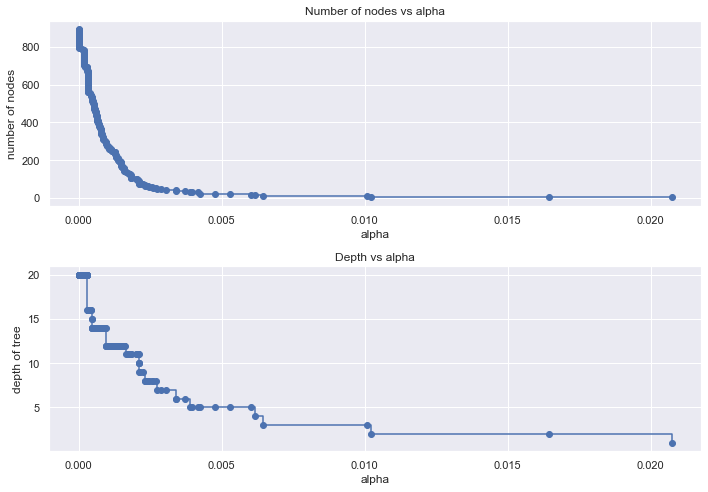

In [92]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1,figsize=(10,7))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [93]:
# F1 vs alpha for training and testing sets
f1_train=[]
for clf in clfs:
    pred_train3=clf.predict(X_train)
    values_train=metrics.f1_score(y_train,pred_train3)
    f1_train.append(values_train)

In [94]:
f1_test=[]
for clf in clfs:
    pred_test3=clf.predict(X_test)
    values_test=metrics.f1_score(y_test,pred_test3)
    f1_test.append(values_test)

In [95]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

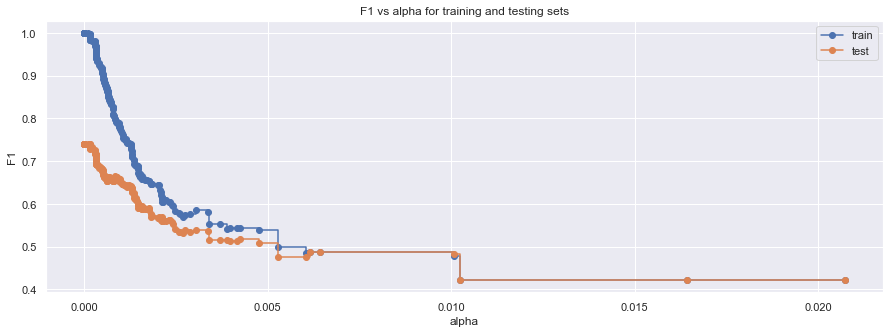

In [96]:
fig, ax = plt.subplots(figsize=(15,5))
ax.set_xlabel("alpha")
ax.set_ylabel("F1")
ax.set_title("F1 vs alpha for training and testing sets")
ax.plot(ccp_alphas, f1_train, marker='o', label="train",
        drawstyle="steps-post",)
ax.plot(ccp_alphas, f1_test, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

We can choose alpha 0.002 retaining information and getting higher recall. We can also get the value where we get the best alpha value.

In [97]:
# creating the model where we get highest train and test recall
index_dtree_ccp = np.argmax(f1_test)
dtree_ccp = clfs[index_dtree_ccp]
print(dtree_ccp)

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, random_state=24)


Accuracy on training set :  1.0
Accuracy on test set :  0.9045020463847203
Recall on training set :  1.0
Recall on test set :  0.7246376811594203
Precision on training set :  1.0
Precision on test set :  0.7575757575757576
F1 Score on training set :  1.0
F1 Score on test set :  0.7407407407407408
ROC-AUC Score on train data: 1.0
ROC-AUC Score on test data: 0.8354280842771892


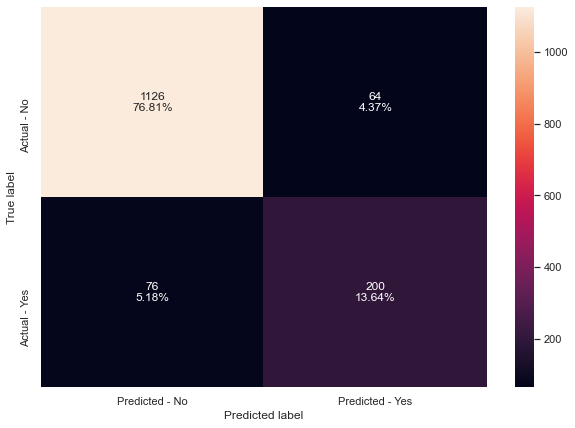

In [98]:
dtree_ccp.fit(X_train, y_train)

#Calculating different metrics
dtree_ccp_score = get_metrics_score(dtree_ccp)
#Creating confusion matrix
make_confusion_matrix(dtree_ccp,y_test)

> While the metrics in this model are better than the tuned model, this model overfits the training data- just like our original base decision tree model.

Let's move onto another classifier and see how it performs

### Bagging Classifier (model name = bagging1, bagging1_tuned)

---



##### Base Bagging Classifier

Accuracy on training set :  0.9944444444444445
Accuracy on test set :  0.9201909959072305
Recall on training set :  0.9704968944099379
Recall on test set :  0.6521739130434783
Precision on training set :  1.0
Precision on test set :  0.8955223880597015
F1 Score on training set :  0.9850275807722616
F1 Score on test set :  0.7547169811320754
ROC-AUC Score on train data: 0.985248447204969
ROC-AUC Score on test data: 0.8172634271099743


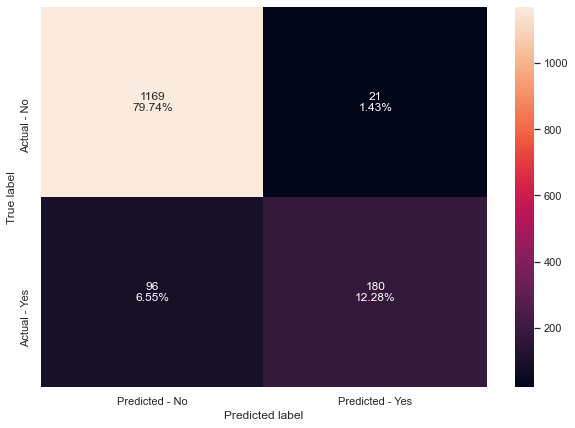

In [99]:
#Fitting the model
bagging1 = BaggingClassifier(random_state=24)
bagging1.fit(X_train,y_train)

#Calculating different metrics
bagging1_score = get_metrics_score(bagging1)
#Creating confusion matrix
make_confusion_matrix(bagging1,y_test)

> The base bagging classifier does a good job on metrics but seems to be overfitting our training data. This can be seen especially with the recall values.
  - Compared to our tuned decision tree model, it does better on testing metrics but is overfitting the model.

Let's try adding class weight to this classifier 

##### Weighted Bagging Classifier

Accuracy on training set :  0.9915204678362574
Accuracy on test set :  0.907912687585266
Recall on training set :  0.9565217391304348
Recall on test set :  0.5833333333333334
Precision on training set :  0.9983792544570502
Precision on test set :  0.8895027624309392
F1 Score on training set :  0.9770023790642347
F1 Score on test set :  0.7045951859956237
ROC-AUC Score on train data: 0.9780807542914423
ROC-AUC Score on test data: 0.7832633053221288


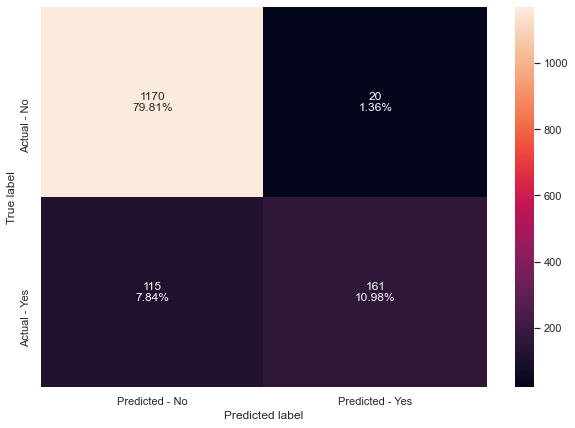

In [100]:
#Fitting the model
bagging1_weight = BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0:0.17,1:0.83},random_state=24),random_state=24)
bagging1_weight.fit(X_train,y_train)

#Calculating different metrics
bagging1_weight_score = get_metrics_score(bagging1_weight)
#Creating confusion matrix
make_confusion_matrix(bagging1_weight,y_test)

> Similar to the base bagging classifier, we see overfitting on the training data with miniscule changes to test data metrics.
  - This model does take into account class weights, so it is already better than the base model regardless

Let's hypertune the parameters

##### Bagging Classifier Hypertuning (model name = bagging1_tuned)



> Some of the important hyperparameters available for bagging classifier are:

- base_estimator: The base estimator to fit on random subsets of the dataset. If None(default), then the base estimator is a decision tree.
- n_estimators: The number of trees in the forest, default = 100.
- max_features: The number of features to consider when looking for the best split. 
- bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
- bootstrap_features: If it is true, then features are drawn with replacement. Default value is False.
- max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
- oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

In [101]:
# Choose the type of classifier. 
bagging1_tuned = BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0:0.17,1:0.83},random_state=24),random_state=24)

# Grid of parameters to choose from
parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1],
              'n_estimators' : np.arange(10,100,10)
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(bagging1_tuned, parameters, scoring=scorer,n_jobs=-1, verbose=2, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging1_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging1_tuned.fit(X_train, y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 634 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:   13.2s finished


BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.17,
                                                                      1: 0.83},
                                                        random_state=24),
                  max_features=0.9, max_samples=0.9, n_estimators=80,
                  random_state=24)

Accuracy on training set :  0.9997076023391813
Accuracy on test set :  0.907912687585266
Recall on training set :  0.9984472049689441
Recall on test set :  0.5760869565217391
Precision on training set :  1.0
Precision on test set :  0.8983050847457628
F1 Score on training set :  0.9992229992229993
F1 Score on test set :  0.7019867549668874
ROC-AUC Score on train data: 0.9992236024844721
ROC-AUC Score on test data: 0.7804804530507856


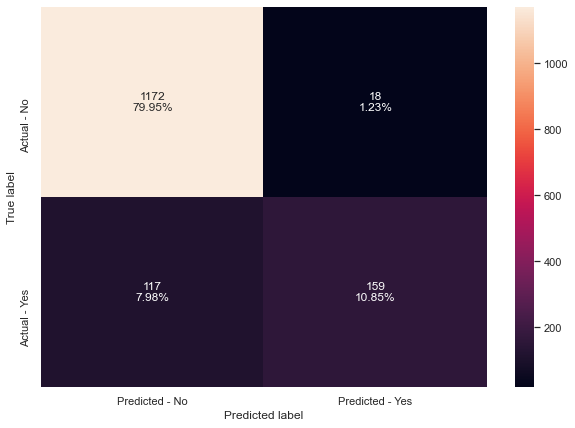

In [102]:
#Calculating different metrics
bagging1_tuned_score = get_metrics_score(bagging1_tuned)
#Creating confusion matrix
make_confusion_matrix(bagging1_tuned,y_test)

> We are seeing similar results in our confusion matrix and metric scores as we saw in the weighted bagging classifier. There is also overfitting on the training data!

Let's move on to another model.

### Random Forest Classifier (model name = rand_forest, rand_forest_tuned)

##### Base Random Forest Classifier

Accuracy on training set :  1.0
Accuracy on test set :  0.9133697135061392
Recall on training set :  1.0
Recall on test set :  0.5942028985507246
Precision on training set :  1.0
Precision on test set :  0.9162011173184358
F1 Score on training set :  1.0
F1 Score on test set :  0.7208791208791208
ROC-AUC Score on train data: 1.0
ROC-AUC Score on test data: 0.7907989282669591


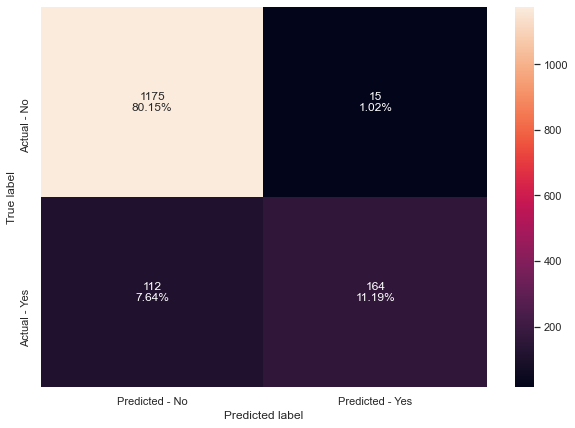

In [103]:
#Fitting the model
rand_forest = RandomForestClassifier(random_state=24, class_weight={0:0.18,1:0.82})
rand_forest.fit(X_train,y_train)

#Calculating different metrics
rand_forest_score = get_metrics_score(rand_forest)
#Creating confusion matrix
make_confusion_matrix(rand_forest,y_test)

> This base random forest model overfits the training data. The recall score shows this most apparently.

Let's get into hypertuning for this model!

##### Random Forest Hypertuning


Some of the important hyperparameters available for random forest classifier are:**

- n_estimators: The number of trees in the forest, default = 100.
- max_features: The number of features to consider when looking for the best split. 
- class_weight: Weights associated with classes in the form {class_label: weight}.If not given, all classes are supposed to have weight one.  
- For example: If the frequency of class 0 is 80% and the frequency of class 1 is 20% in the data, then class 0 will become the dominant class and the model will become biased toward the dominant classes. In this case, we can pass a dictionary {0:0.2,1:0.8} to the model to specify the weight of each class and the random forest will give more weightage to class 1. 
- bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
- max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
- oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

- Note: A lot of hyperparameters of Decision Trees are also available to tune  Random Forest like max_depth, min_sample_split etc.

In [104]:
# Choose the type of classifier. 
rand_forest_tuned = RandomForestClassifier(class_weight={0:0.18,1:0.82},random_state=24)

parameters = {  
                'max_depth': list(np.arange(5,30,5)) + [None],
                'max_features': ['sqrt','log2',None],
                'min_samples_leaf': np.arange(1,15,5),
                'min_samples_split': np.arange(2, 20, 5),
                'n_estimators': np.arange(10,110,10),
                "max_samples": [0.3, 0.7, 0.9, None],
                'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
                }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(rand_forest_tuned, parameters, scoring=scorer, cv=5,n_jobs=-1, verbose=2)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rand_forest_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
rand_forest_tuned.fit(X_train, y_train)

Fitting 5 folds for each of 34560 candidates, totalling 172800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 634 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 1930 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 2820 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 3874 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 5088 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 6466 tasks      | elapsed:   52.9s
[Parallel(n_jobs=-1)]: Done 8004 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 9706 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 11568 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 13594 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 15780 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 18130 tasks  

RandomForestClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=20,
                       max_features=None, min_impurity_decrease=0.0001,
                       min_samples_split=7, n_estimators=40, random_state=24)

Accuracy on training set :  0.9915204678362574
Accuracy on test set :  0.9160982264665757
Recall on training set :  0.9906832298136646
Recall on test set :  0.7101449275362319
Precision on training set :  0.9652042360060514
Precision on test set :  0.8200836820083682
F1 Score on training set :  0.9777777777777779
F1 Score on test set :  0.7611650485436893
ROC-AUC Score on train data: 0.9911989636100025
ROC-AUC Score on test data: 0.8370052368773597


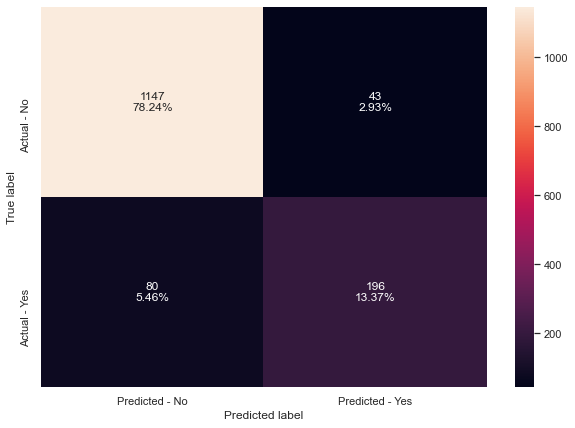

In [105]:
#Calculating different metrics
rand_forest_tuned_score = get_metrics_score(rand_forest_tuned)
#Creating confusion matrix
make_confusion_matrix(rand_forest_tuned,y_test)

> From this tuned model, we see that it doesn't overfit the training data as much as the base model
  - Our best model yet- in terms of not overfitting the data and metric scores
  - The Tuned Bagging is the next best model but it is overfitting the data more than this with similar test data metrics
  - The Tuned Decision tree is the next best model. The metrics aren't very high on precision but it is the best fit so far

### Bagging Classifiers Overview and Feature Importances so far 

- We have seen decision trees, bagging classifiers, and random forest models so far
  - All the models have been mostly overfitting our training data
  - The rand_forest_tuned model is the best model we have seen yet in terms of not overfitting the data and decent metric scores
    - We can look at important features according to our best classifier so far

In [106]:
def imp_feats (model):
  feature_names = X_train.columns
  importances = model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(12,12))
  plt.title('Feature Importances')
  plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
  plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
  plt.xlabel('Relative Importance')
  plt.show()

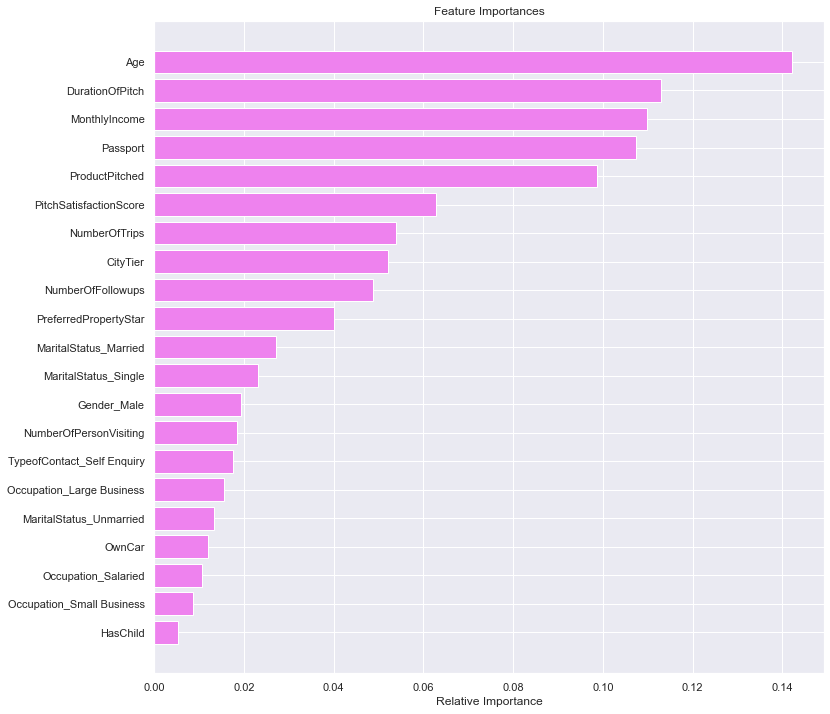

In [107]:
imp_feats(rand_forest_tuned)

> With this model, the customers Age is the most important factor in determining if they will buy a product followed by the Duration of the Pitch. The customer's MonthlyIncome and having a passport are also very significant relatively!

  * The marketing team and policymaker can use these features although it may not be the best model!



**Let's move on to another group of classifiers now**

## Boosting

### AdaBoost Classifier (model name = ada_boost)

##### Base AdaBoost Classifier

Accuracy on training set :  0.8497076023391813
Accuracy on test set :  0.8383356070941337
Recall on training set :  0.34006211180124224
Recall on test set :  0.3188405797101449
Precision on training set :  0.711038961038961
Precision on test set :  0.6423357664233577
F1 Score on training set :  0.46008403361344535
F1 Score on test set :  0.42615012106537525
ROC-AUC Score on train data: 0.6540007965346268
ROC-AUC Score on test data: 0.6388320545609549


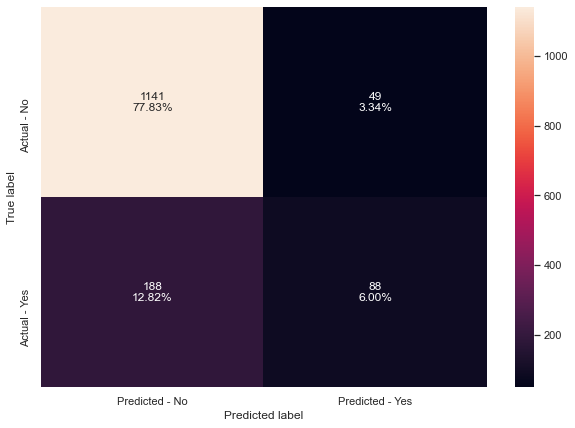

In [108]:
#Fitting the model
ada_boost = AdaBoostClassifier(random_state=24)
ada_boost.fit(X_train,y_train)

#Calculating different metrics
ada_boost_score = get_metrics_score(ada_boost)
#Creating confusion matrix
make_confusion_matrix(ada_boost,y_test)

> The base Ada boost classifier returns very low recall scores so this is not a good model.

Let's hypertune the parameters!

##### AdaBoost Hypertuning

In [109]:
# Choose the type of classifier. 
ada_boost_tuned = AdaBoostClassifier(random_state=24)

# Grid of parameters to choose from
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1),DecisionTreeClassifier(max_depth=2),
                      DecisionTreeClassifier(max_depth=3)],
    "n_estimators": np.arange(10,110,10),
    "learning_rate":np.arange(0.1,2,0.1)
}

# Type of scoring used to compare parameter  combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(ada_boost_tuned, parameters, scoring=scorer, cv=5, n_jobs=-1, verbose=2)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
ada_boost_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
ada_boost_tuned.fit(X_train, y_train)

Fitting 5 folds for each of 570 candidates, totalling 2850 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 634 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done 1930 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 2850 out of 2850 | elapsed:   48.1s finished


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                   n_estimators=100, random_state=24)

Accuracy on training set :  0.9906432748538012
Accuracy on test set :  0.9010914051841746
Recall on training set :  0.9580745341614907
Recall on test set :  0.6847826086956522
Precision on training set :  0.9919614147909968
Precision on test set :  0.7651821862348178
F1 Score on training set :  0.9747235387045814
F1 Score on test set :  0.722753346080306
ROC-AUC Score on train data: 0.9781366907118693
ROC-AUC Score on test data: 0.8180215564486665


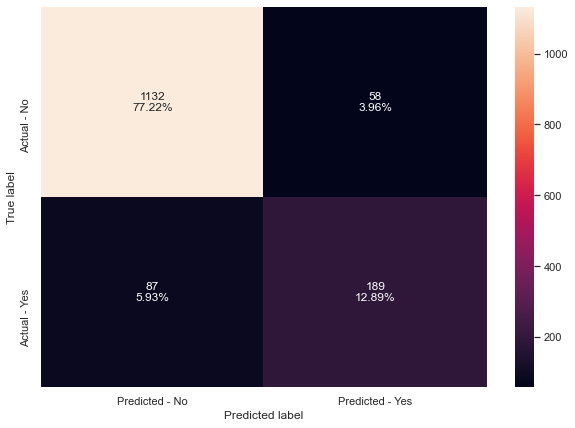

In [110]:
#Calculating different metrics
ada_boost_tuned_score = get_metrics_score(ada_boost_tuned)
#Creating confusion matrix
make_confusion_matrix(ada_boost_tuned,y_test)

> The tuned parameters helped with improving metric scores but it is now overfitting our training data. 
  - Similar to the tuned random forest model, but the metric scores are a little lower and we see more overfitting on the train data

Moving onto Gradient Boosting!

### Gradient Boosting Classifier (model name = grad_boost)

##### Base Gradient Boosting Classifier

Accuracy on training set :  0.8909356725146199
Accuracy on test set :  0.864256480218281
Recall on training set :  0.4860248447204969
Recall on test set :  0.42391304347826086
Precision on training set :  0.8816901408450705
Precision on test set :  0.7452229299363057
F1 Score on training set :  0.6266266266266267
F1 Score on test set :  0.5404157043879907
ROC-AUC Score on train data: 0.7354475808616894
ROC-AUC Score on test data: 0.6951497990500548


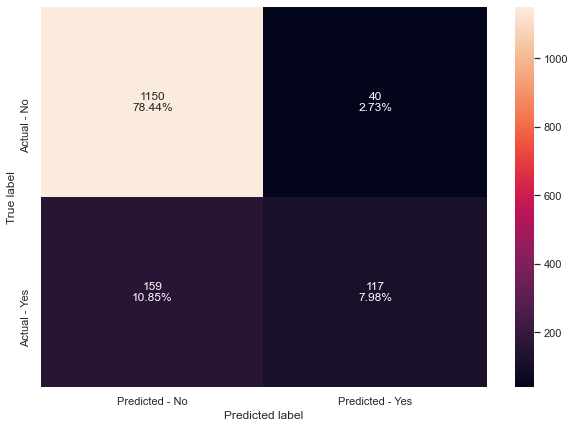

In [111]:
#Fitting the model
grad_boost = GradientBoostingClassifier(random_state=24)
grad_boost.fit(X_train,y_train)

#Calculating different metrics
grad_boost_score = get_metrics_score(grad_boost)
#Creating confusion matrix
make_confusion_matrix(grad_boost,y_test)

> The base gradient boost classifier shows better fitting of the training data but we see low recall score. This will be a problem for the travel company so we will need to work on this model.

Let's try to initialize it using AdaBoost and see how it does

##### Gradient Boosting Classifier initialized by AdaBoost

Accuracy on training set :  0.8845029239766082
Accuracy on test set :  0.8635743519781719
Recall on training set :  0.4472049689440994
Recall on test set :  0.4057971014492754
Precision on training set :  0.8807339449541285
Precision on test set :  0.7567567567567568
F1 Score on training set :  0.5932028836251289
F1 Score on test set :  0.5283018867924528
ROC-AUC Score on train data: 0.7165779887948162
ROC-AUC Score on test data: 0.6877725003044697


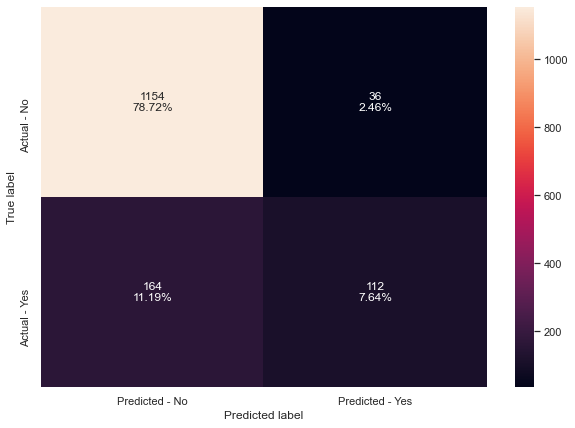

In [112]:
#Fitting the model
grad_boost2 = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=24),random_state=24)
grad_boost2.fit(X_train,y_train)

#Calculating different metrics
grad_boost2_score = get_metrics_score(grad_boost2)
#Creating confusion matrix
make_confusion_matrix(grad_boost2,y_test)

> Initialized by the AdaBoost classifier, we saw a loss in the overall F1 score but a slightly better fit. There is still room for this model to improve.

Hypertuning time!

##### Gradient Boosting Classifier Hypertuning

In [113]:
grad_boost_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=24),random_state=24)

# Grid of parameters to choose from
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(grad_boost_tuned, parameters, scoring=scorer, cv=5, n_jobs=-1, verbose=2)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
grad_boost_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
grad_boost_tuned.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   10.3s finished


GradientBoostingClassifier(init=AdaBoostClassifier(random_state=24),
                           max_features=0.9, n_estimators=250, random_state=24,
                           subsample=0.9)

Accuracy on training set :  0.9257309941520467
Accuracy on test set :  0.8792633015006821
Recall on training set :  0.6475155279503105
Recall on test set :  0.5181159420289855
Precision on training set :  0.9391891891891891
Precision on test set :  0.7647058823529411
F1 Score on training set :  0.7665441176470588
F1 Score on test set :  0.6177105831533477
ROC-AUC Score on train data: 0.8188946515832244
ROC-AUC Score on test data: 0.7405705760565094


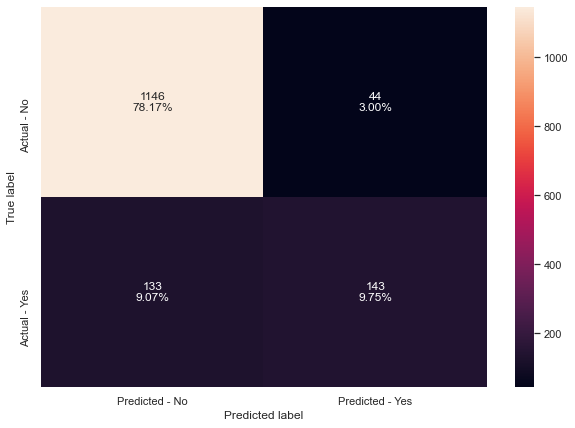

In [114]:
#Calculating different metrics
grad_boost_tuned_score = get_metrics_score(grad_boost_tuned)
#Creating confusion matrix
make_confusion_matrix(grad_boost_tuned,y_test)

> The metrics improved, especially the F1 score but we see that it has began to overfit our training data again. This is very comparable to tuned and may be the best classifier we have seen yet

Let's build a couple more models

### XGBoost Classifier (model name = xgb_boost)

##### Base XGB Boosting Classifier

[11:21:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy on training set :  0.9994152046783625
Accuracy on test set :  0.9290586630286494
Recall on training set :  0.9968944099378882
Recall on test set :  0.7318840579710145
Precision on training set :  1.0
Precision on test set :  0.8706896551724138
F1 Score on training set :  0.9984447900466563
F1 Score on test set :  0.7952755905511812
ROC-AUC Score on train data: 0.9984472049689441
ROC-AUC Score on test data: 0.8533369869687005


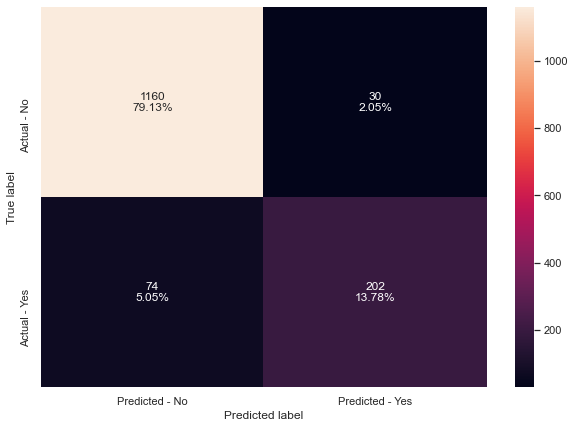

In [115]:
#Fitting the model
xgb_boost = XGBClassifier(random_state=24)
xgb_boost.fit(X_train,y_train)

#Calculating different metrics
xgb_boost_score = get_metrics_score(xgb_boost)
#Creating confusion matrix
make_confusion_matrix(xgb_boost,y_test)

> While test data metrics look good, we need to ensure the model isn't overfitting the training data too much. This is why we see the training and testing metrics differ so significantly.

Hypertuning time!

##### XGB Boosting Classifier Hypertuning

In [116]:
# Choose the type of classifier. 
xgb_boost_tuned = XGBClassifier(random_state=24)

# Grid of parameters to choose from
parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,1,2,5],
    "subsample":[0.5,0.7,0.9,1],
    "learning_rate":[0.01,0.1,0.2,0.05],
    "gamma":[0,1,3],
    "colsample_bytree":[0.7,0.9,1],
    "colsample_bylevel":[0.5,0.7,1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_boost_tuned, parameters, scoring=scorer, cv=5, n_jobs=-1, verbose=2)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_boost_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_boost_tuned.fit(X_train, y_train)

Fitting 5 folds for each of 8640 candidates, totalling 43200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 634 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 1930 tasks      | elapsed:   32.7s
[Parallel(n_jobs=-1)]: Done 2820 tasks      | elapsed:   48.3s
[Parallel(n_jobs=-1)]: Done 3601 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 4768 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 5681 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 6740 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 8245 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 9424 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 10890 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 12692 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 14434 tasks   

[11:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.7,
              colsample_bynode=1, colsample_bytree=0.9, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.2, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=90, n_jobs=16, num_parallel_tree=1, random_state=24,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=5, subsample=0.9,
              tree_method='exact', validate_parameters=1, verbosity=None)

Accuracy on training set :  0.9929824561403509
Accuracy on test set :  0.9154160982264665
Recall on training set :  1.0
Recall on test set :  0.8152173913043478
Precision on training set :  0.9640718562874252
Precision on test set :  0.7550335570469798
F1 Score on training set :  0.9817073170731708
F1 Score on test set :  0.7839721254355401
ROC-AUC Score on train data: 0.9956772334293947
ROC-AUC Score on test data: 0.8769364267446108


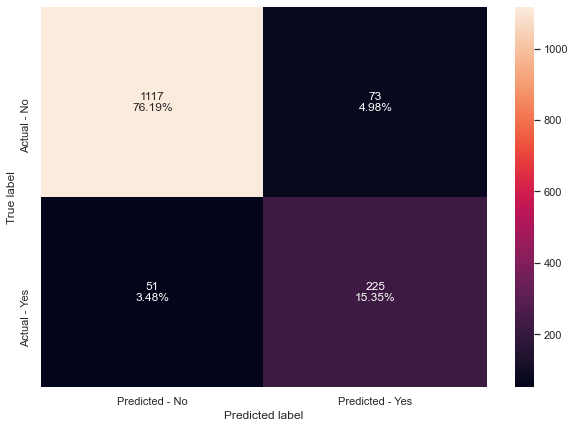

In [117]:
#Calculating different metrics
xgb_boost_tuned_score = get_metrics_score(xgb_boost_tuned)
#Creating confusion matrix
make_confusion_matrix(xgb_boost_tuned,y_test)

> While the metrics are comaprable to the base XGBoost model, this fits the training data slightly better (but not a lot better). It is a good classifier balancing between Precision and Recall but we see the differences because it is still overfitting.

## Comparing All Models

In [118]:
# defining list of models
models = [dtree, dtree_tuned, dtree_ccp, bagging1, bagging1_weight, bagging1_tuned, rand_forest, rand_forest_tuned,
          ada_boost, ada_boost_tuned, grad_boost, grad_boost2, grad_boost_tuned, xgb_boost, xgb_boost_tuned]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = [] 
f1_test = []

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model,flag=False)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    f1_train.append(j[6])
    f1_test.append(j[7])

    

In [119]:
comparison_frame = pd.DataFrame({'Model':['Decision Tree','Tuned Decision Tree','CCP Decision Tree',
                                          'Bagging Classifier', 'Bagging Classifier Weighted','Tuned Weighted Bagging Classifier',
                                          'Random Forest','Tuned Random Forest',
                                          'AdaBoost','Tuned AdaBoost',
                                          'Gradient Boost','Gradient Boost Initialized', 'Tuned Gradient Boost',
                                          'XGBoost ', 'Tuned XGBoost'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test,
                                          'Train_F1-Score':f1_train, 'Test_F1-Score':f1_test}) 

comparison_frame


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1-Score,Test_F1-Score
0,Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741
1,Tuned Decision Tree,0.757310,0.740791,0.804348,0.757246,0.423895,0.400383,0.555198,0.523810
2,CCP Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741
3,Bagging Classifier,0.994444,0.920191,0.970497,0.652174,1.000000,0.895522,0.985028,0.754717
4,Bagging Classifier Weighted,0.991520,0.907913,0.956522,0.583333,0.998379,0.889503,0.977002,0.704595
5,Tuned Weighted Bagging Classifier,0.999708,0.907913,0.998447,0.576087,1.000000,0.898305,0.999223,0.701987
6,Random Forest,1.000000,0.913370,1.000000,0.594203,1.000000,0.916201,1.000000,0.720879
7,Tuned Random Forest,0.991520,0.916098,0.990683,0.710145,0.965204,0.820084,0.977778,0.761165
8,AdaBoost,0.849708,0.838336,0.340062,0.318841,0.711039,0.642336,0.460084,0.426150
9,Tuned AdaBoost,0.990643,0.901091,0.958075,0.684783,0.991961,0.765182,0.974724,0.722753


In [120]:
#Sorting models in decreasing order of test f1 score
comparison_frame.sort_values(by='Test_F1-Score',ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1-Score,Test_F1-Score
13,XGBoost,0.999415,0.929059,0.996894,0.731884,1.000000,0.870690,0.998445,0.795276
14,Tuned XGBoost,0.992982,0.915416,1.000000,0.815217,0.964072,0.755034,0.981707,0.783972
7,Tuned Random Forest,0.991520,0.916098,0.990683,0.710145,0.965204,0.820084,0.977778,0.761165
3,Bagging Classifier,0.994444,0.920191,0.970497,0.652174,1.000000,0.895522,0.985028,0.754717
0,Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741
2,CCP Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741
9,Tuned AdaBoost,0.990643,0.901091,0.958075,0.684783,0.991961,0.765182,0.974724,0.722753
6,Random Forest,1.000000,0.913370,1.000000,0.594203,1.000000,0.916201,1.000000,0.720879
4,Bagging Classifier Weighted,0.991520,0.907913,0.956522,0.583333,0.998379,0.889503,0.977002,0.704595
5,Tuned Weighted Bagging Classifier,0.999708,0.907913,0.998447,0.576087,1.000000,0.898305,0.999223,0.701987


In [121]:
#Sorting models in decreasing order of test recall
comparison_frame.sort_values(by='Test_Recall',ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1-Score,Test_F1-Score
14,Tuned XGBoost,0.992982,0.915416,1.000000,0.815217,0.964072,0.755034,0.981707,0.783972
1,Tuned Decision Tree,0.757310,0.740791,0.804348,0.757246,0.423895,0.400383,0.555198,0.523810
13,XGBoost,0.999415,0.929059,0.996894,0.731884,1.000000,0.870690,0.998445,0.795276
0,Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741
2,CCP Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741
7,Tuned Random Forest,0.991520,0.916098,0.990683,0.710145,0.965204,0.820084,0.977778,0.761165
9,Tuned AdaBoost,0.990643,0.901091,0.958075,0.684783,0.991961,0.765182,0.974724,0.722753
3,Bagging Classifier,0.994444,0.920191,0.970497,0.652174,1.000000,0.895522,0.985028,0.754717
6,Random Forest,1.000000,0.913370,1.000000,0.594203,1.000000,0.916201,1.000000,0.720879
4,Bagging Classifier Weighted,0.991520,0.907913,0.956522,0.583333,0.998379,0.889503,0.977002,0.704595


### Classifier analysis

- After going through all these models and hypertuning them, we see that there is going to be some overfitting on almost all models
- We can build one final classifier which can use some of these weaker classifiers
- Using the Stacking Classifier, we can use two initial estimators and then use a final estimator
  - This may give us better results on modeling as it builds on other classifiers. Let's try it

## Stacking Classifier
- Using the Bagging Classifier, AdaBoost, and the  Random Forest as primary estimators
- Using XGBboost as the final estimator
- First will run with base estimators then the tuned estimators

[11:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy on training set :  0.9862573099415205
Accuracy on test set :  0.91268758526603
Recall on training set :  0.9565217391304348
Recall on test set :  0.7318840579710145
Precision on training set :  0.9700787401574803
Precision on test set :  0.7890625
F1 Score on training set :  0.9632525410476935
F1 Score on test set :  0.7593984962406015
ROC-AUC Score on train data: 0.9748386793634883
ROC-AUC Score on test data: 0.8432529533552553


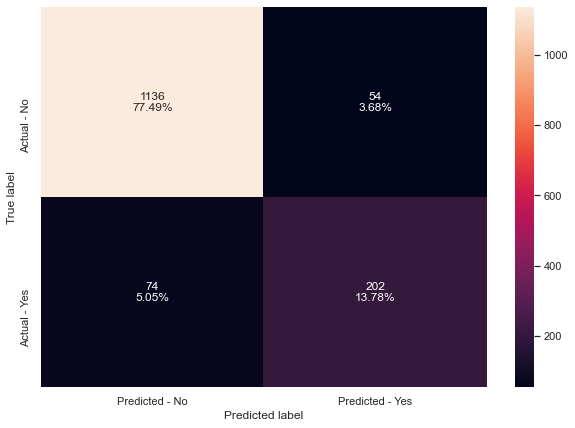

In [122]:
estimators = [('Weighted Bagging Classifier',bagging1_weight), ('AdaBoost', ada_boost), ('Base Decision Tree',dtree)]

final_estimator = xgb_boost

stacking_classifier= StackingClassifier(estimators=estimators,final_estimator=final_estimator)

stacking_classifier.fit(X_train,y_train)

#Calculating different metrics
stacking_classifier_score = get_metrics_score(stacking_classifier)

#Creating confusion matrix
make_confusion_matrix(stacking_classifier,y_test)

> Returned comparable metrics as we saw in the comparison table earlier. The Training data is still being overfit but metrics can be improved. Let's see if we can get better results with tuned estimators in the stacking classifier! 

[11:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy on training set :  0.9944444444444445
Accuracy on test set :  0.9147339699863575
Recall on training set :  1.0
Recall on test set :  0.8804347826086957
Precision on training set :  0.971342383107089
Precision on test set :  0.7253731343283583
F1 Score on training set :  0.9854628921193572
F1 Score on test set :  0.7954173486088381
ROC-AUC Score on train data: 0.9965778097982708
ROC-AUC Score on test data: 0.901561929119474


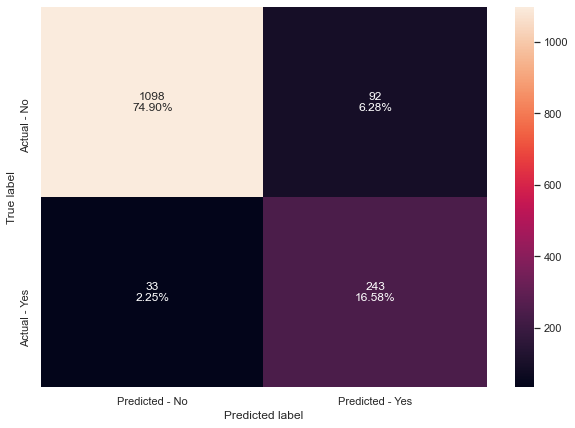

In [123]:
#dtree, dtree_tuned, dtree_ccp, bagging1, bagging1_weight, bagging1_tuned, rand_forest, rand_forest_tuned
#ada_boost, ada_boost_tuned, grad_boost, grad_boost2, grad_boost_tuned, xgb_boost, xgb_boost_tuned

tuned_estimators = [('Tuned Weighted Bagging Classifier',bagging1_tuned), ('Tuned AdaBoost', ada_boost_tuned), ('Tuned Decision Tree',dtree_tuned)]

tuned_final_estimator = xgb_boost_tuned

stacking_classifier_tuned= StackingClassifier(estimators=tuned_estimators,final_estimator=tuned_final_estimator)

stacking_classifier_tuned.fit(X_train,y_train)

#Calculating different metrics
stacking_classifier_tuned_score = get_metrics_score(stacking_classifier_tuned)

#Creating confusion matrix
make_confusion_matrix(stacking_classifier_tuned,y_test)

> The test f1_score os relatively higher than what we saw on any other classifier. There is still training data being overfit, but this is the best model we created in terms of the f1_score and relative fitting

In [124]:
comparison_frame.sort_values(by='Test_F1-Score',ascending=False).head()

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1-Score,Test_F1-Score
13,XGBoost,0.999415,0.929059,0.996894,0.731884,1.000000,0.870690,0.998445,0.795276
14,Tuned XGBoost,0.992982,0.915416,1.000000,0.815217,0.964072,0.755034,0.981707,0.783972
7,Tuned Random Forest,0.991520,0.916098,0.990683,0.710145,0.965204,0.820084,0.977778,0.761165
3,Bagging Classifier,0.994444,0.920191,0.970497,0.652174,1.000000,0.895522,0.985028,0.754717
0,Decision Tree,1.000000,0.904502,1.000000,0.724638,1.000000,0.757576,1.000000,0.740741


## Final Classifier Tuning and Analysis

- The tuned stacking classifier returned the best results. Let's see what we can do with it.

In [125]:
get_classification_report(stacking_classifier_tuned,X_train,X_test,y_train,y_test,flag=True)

Classification report on training set :
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      2776
           1       0.97      1.00      0.99       644

    accuracy                           0.99      3420
   macro avg       0.99      1.00      0.99      3420
weighted avg       0.99      0.99      0.99      3420

Classification report on test set :
               precision    recall  f1-score   support

           0       0.97      0.92      0.95      1190
           1       0.73      0.88      0.80       276

    accuracy                           0.91      1466
   macro avg       0.85      0.90      0.87      1466
weighted avg       0.92      0.91      0.92      1466



['              precision    recall  f1-score   support\n\n           0       1.00      0.99      1.00      2776\n           1       0.97      1.00      0.99       644\n\n    accuracy                           0.99      3420\n   macro avg       0.99      1.00      0.99      3420\nweighted avg       0.99      0.99      0.99      3420\n',
 '              precision    recall  f1-score   support\n\n           0       0.97      0.92      0.95      1190\n           1       0.73      0.88      0.80       276\n\n    accuracy                           0.91      1466\n   macro avg       0.85      0.90      0.87      1466\nweighted avg       0.92      0.91      0.92      1466\n']

> An analysis on specifics within each test and training set. We can see how the training data was overfit with very good scores. The metrics on precision are lower on the dataset but we have a high recall score so this balances out. We chose to focus on the F1 Score because it is a balance between both precision and recall and both scenarios are important for the travel company.

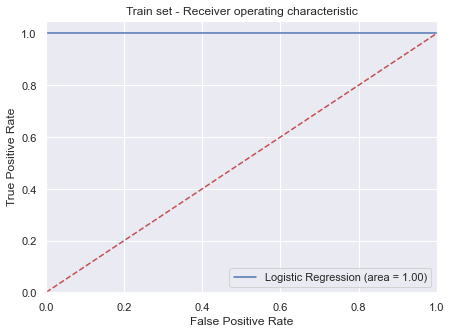

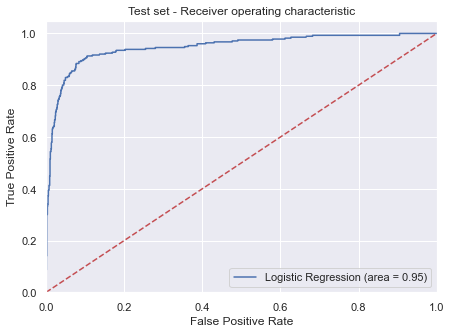

In [126]:
plot_roc(stacking_classifier_tuned, X_train, X_test, y_train, y_test)

From the above graphic, we can see that for this case the Area Under Curve (AUC) is aproximately 0.95.
In general, when AUC score is 1, a perfect classifier is represented, and when 0.5 a worthless classifier is represented. 

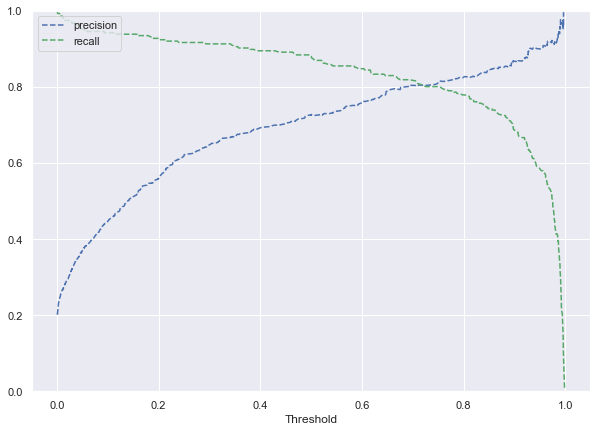

In [127]:
def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], 'b--', label='precision')
    plt.plot(thresholds, recalls[:-1], 'g--', label = 'recall')
    plt.xlabel('Threshold')
    plt.legend(loc='upper left')
    plt.ylim([0,1])

y_scores=stacking_classifier_tuned.predict_proba(X_test)[:,1]
prec, rec, tre = precision_recall_curve(y_test, y_scores,)

plt.figure(figsize=(10,7))
plot_prec_recall_vs_tresh(prec, rec, tre)
plt.show()

> From here, we can set our threshold value up to .6 but this will still return a lower precision score while only slightly improving the precision.

In [128]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, stacking_classifier_tuned.predict_proba(X_test)[:,1])

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print('Best Threshold=%f' %(optimal_threshold))

Best Threshold=0.341662


In [129]:
stacking_classifier_tuned_threshold_score = give_threshold_score(optimal_threshold, stacking_classifier_tuned,X_train,X_test,y_train,y_test,flag=True)

Accuracy on train data: 0.987719298245614
Accuracy on test data: 0.897680763983629
Recall on train data: 1.0
Recall on test data: 0.9094202898550725
Precision on train data: 0.9387755102040817
Precision on test data: 0.6675531914893617
F1 Score on train data: 0.968421052631579
F1 Score on test data: 0.7699386503067484
ROC-AUC Score on train data: 0.9924351585014409
ROC-AUC Score on test data: 0.902189136524175


> After setting the threshold value, we did not see more improvements in the metrics. There was a slight decrease to the overall F1-Score and there is more overfitting on this model

## Visualize Feature Importances


> The stacking classifier can be a very complicated model to understand, so we will be showing the Marketing team and Policy makers some of the most important features we found throughout our modeling.

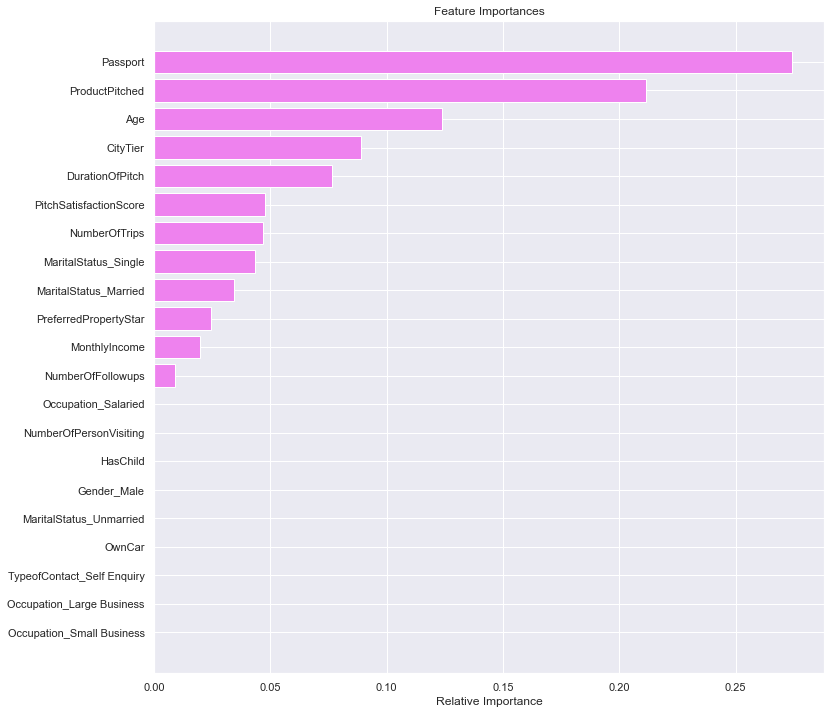

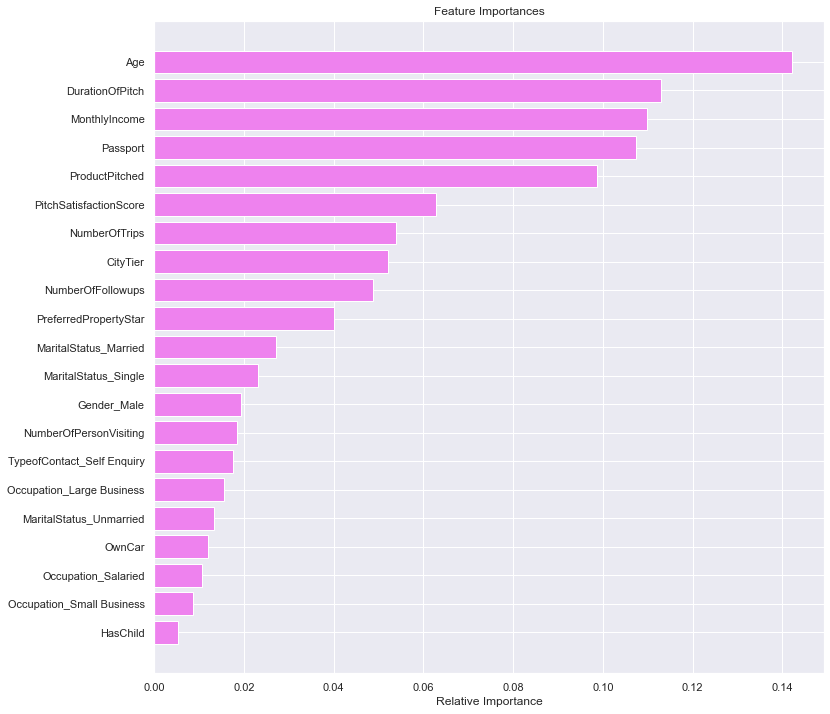

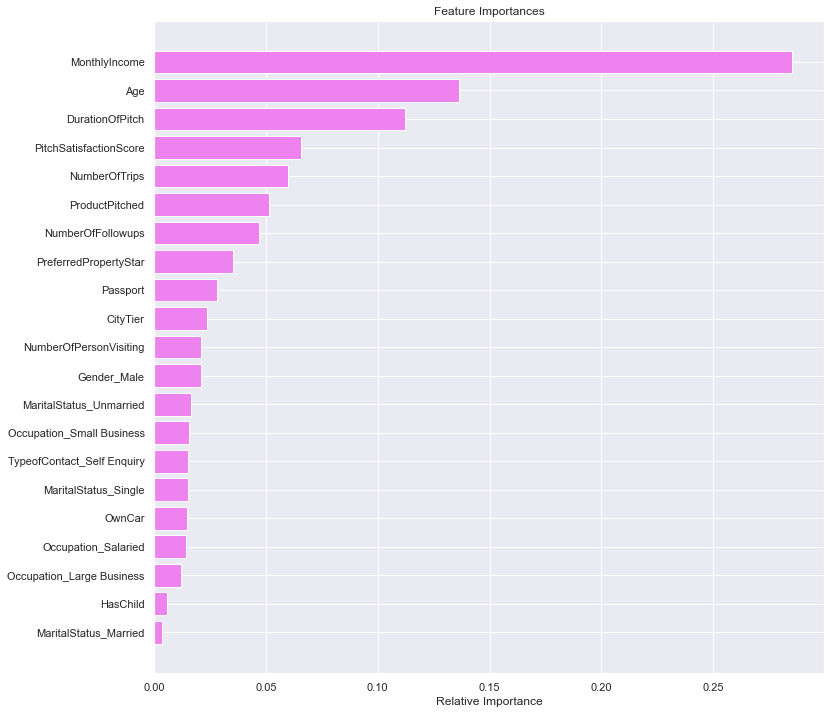

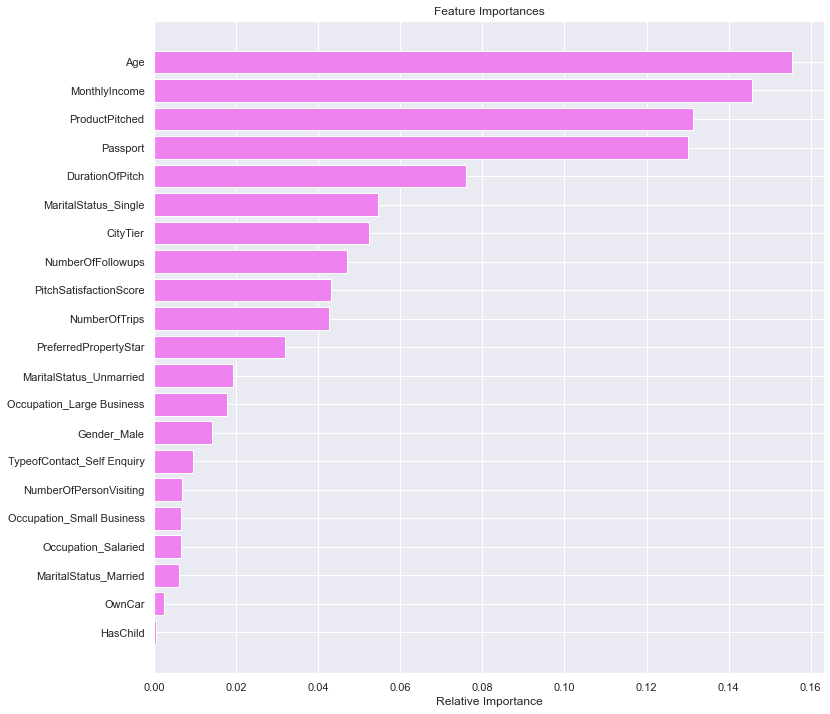

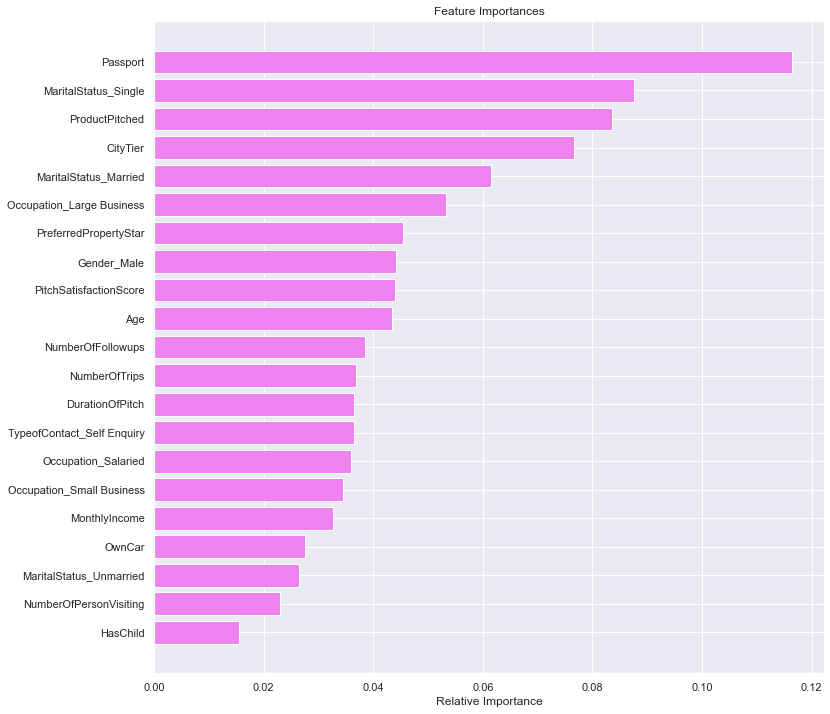

In [130]:
#imp_feats(stacking_classifier_tuned)
imp_feats(dtree_tuned)
imp_feats(rand_forest_tuned)
imp_feats(ada_boost_tuned)
imp_feats(grad_boost_tuned)
imp_feats(xgb_boost_tuned)

> Looking at the estimators and their feature importances, we can compile features that are to be focused on in case there is no modeling available.

- Age - this was visualized in our data visualization. We saw age playing a factor in how likely customer will be to buy a package
- MonthlyIncome - We saw the influence income has on being able to purchase a package
- Passport - Having a Passport is a big indicator if someone is likely to buy a product 
- ProductPitched - We saw that the specific product that's being pitched can play a big factor in how likely someone will be to buy it
- DurationOfPitch - We analyzed this to see how much of a difference it made when the pitch was longer and saw the importance in our modeling
- MartialStatus - We saw that being single and unmarried in our data visualization can be a good indicator on whether a customer will likely buy a product that was pitched

## Business understanding of the model



### Purpose of this Project at Visit with Us:
Growing the customer base while keeping marketing costs efficient.
Predicting consumers that can be targeted for the product pitch to be likely to purchase the product
Currently, since conversion rates are at 18%, the marketing department needs to identify which customers have a higher probability of purchasing the product but also need to keep expenditure costs to a minimum.
### Objective:
Give the marketing department and policymaker information about which data features are the most significant and which segment of customers should be targeted more often. With given data features, the marketing department could also use a model which can accurately predict whether a customer will buy a product.
### Focus:
The travel company wants to ensure that more people accept the product while also growing the customer base. The model should aim to reduce the number customers falsely labeled as not taking on the product while also correctly labeling customers. Thus, more analysis will be done on the metric of the model that should be emphasized right before modeling.


-----------------------------------------------------------------------------------
The policy makers and marketing team wanted to increase the number of customers it has by introducing a new package product. This will help the travel company grow and get more customers to purchase a product when marketed to.

For this application, it was important that we didn't waste money on expenditure on those who would not buy a package while trying to not miss any customers who may take on a package! Last year's conversion rate was healthy at 18%. Whlie some customers may get missed in identification of those who will buy a package, the company does not want to advertise to someone who will not take on a package but also does not want to miss out on opportunity to gain new customers. Because of this, the F-1 score is the metric to focus on as it tries relies on both presicion and recall values to compute.

The importance of each feature from the model will be used to classify the outcome. The goal is to build a model that identifies customers who are most likely to accept the package offer in future package product campaigns.

After a lot of data analysis and running through thousands of different possible model fits, a stacking classifier built using a layer of 3 different modeling techniques (Bagging Classifier, AdaBoost, and the  Random Forest) combined with the XGBoost classifier returned the best results. The model will predict relatively well but there is some over-fitting of the data currently.

As our model expands and learns about new customers, it will be able to improve based on past learning errors. As of right now, there is a decent model for the marketing team to start targeting customers for package pitches!

For the marketing team, there are some things they should always pay attention to:



If the marketing teams needs to target customers as soon as possible, the bank can utilize customer data on high Income, high CCAvg usage, and having a CD Account. If the customer is part of a larger family along with any one those three features, there is a much greater chance they will take on a package product.



There is data available for both the marketing teams and policy maker to help the business grow. By understanding the customer population and delivering good sales pitches, the travel company has a lot of opportunity to grow its customer base while keeping expenditure at a minimum.

For the policy maker: It is very crucial to have employees that know how to advertise and pitch the product. As we saw with customer interaction data, this makes a difference in how likely customers are in buying a product. As a policy-maker, it is your responsibility that there is good documentation and that employees are well-trained in sending out a good pitch. Characteristics of a good pitch, as seen in our data analysis, are having a good pitch satisfaction score, good number of follow ups, and efficiently delivering good information in 14-15 minutes. 

For more information, policy makers are recommended to read through the key points highlighted in the next section. There is more information available on good customer interaction and pitch characteristics in the next group of information that is compiled for the marketing team.


For the marketing team, there are some things they should always pay attention to:

- Most customers that take a product are 31 (average 34), males, married, self enquired, salaried, executives, have a monthly income average of 22100, take about 3 trips a year. The pitch duration is about 16 minutes with a higher average of followups

- As the packages get higher in tier (basic>standard>deluxe>super deluxe>king), we see an increase in age, monthly income mainly.
  - As customers get older, they are pitched higher tier packages
  - Basic packages are pitched to younger ages and purchased by younger ages with the average being about 30
  - Standard packages are pitched to almost all ages over 25 but all ages have purchased one
  - Deluxe Packages are advertised to almost all ages and the distribution of those who have purchased one is also pretty even, with slightly higher ages shown than in Basic and Standard
  - Super Deluxe Packages are usually pitched to those over 40 and almost everyone who has purchased one is above the age of 39
  - King packages are advertised to everyone but mostly to the higher ages
  - No customers who were advertised King packages under 40 years oldbought one
  - Customers who purchase a king package are also usually over 40 years old

- Customers who are older as well high-income earners tend to get pitched tier packages
  - Basic packages are pitched to mostly those within 18000-28000
  -	Basic packages are usually purchased by those within this range but there are outliers who have bought Basic packages with MonthlyIncomes all the way up to 40,000
  -	Super Deluxe Packages are advertised to those with incomes over 27000 usually but the average of those who take it is lower than those who don't take it when pitched to them
  -	King packages are advertised to those with the higest incomes above 33,000 and these are also the highest tier packages- which makes sense that those with higher incomes will be able to afford it
  -	The monthly income of those who are pitched King and Super Deluxe packages are, on average, over 33,000. 
  -	Standard, although a lower tier than deluxe, has a higher average age and higher monthly income
    - Interesting difference such that Deluxe packages are bought by younger people with a lower monthly salary than standard even though standard is a tier below this.

- Genders: 
  - Males are more likely to purchase Standard and Super Deluxe packages than females
  -	Females buy the Super Deluxe package less than 5% of the time
  - Females are more likely to purchase King packages than males

- Unmarried and Single customers are the most likely to buy a package while Divorced and Married buy less often
  -	Unmarried individuals buy the Super Deluxe package over 30%, a lot more often than other Martial Statuses but are not pitched the King product
  -	Unmarried individuals also buy the Basic package about 40% of the time
  -	Divorced and Married customers returned 13% and 13.9% respectively to buying the product.
  -	Single Customers buy the Basic package almost 50% of the time when pitched to
  -	Divorced customers end up buying a package less than 15% of the time and are not pitched the Super Deluxe
  -	Married Customers buy a product less than 15%

- Customers that are Company Invited contacts tend to return overall better package purchsing ratios, but we see that King packages are not pitched to those Company Invited
  - The Basic is most preferred with with Company Invited with over 35% buying the package

- Out of the 5 products/packages, the order is Basic>Standard>Deluxe>Super Deluxe>King
  - Two most frequently pitched are the Basic (37.68%) and the Deluxe (35.4%)
  - When the Basic product is pitched, almost 30% of customers took the product while the Deluxe product was only bought 11.7% of the times when pitched
    - The previous two point shows that while both of these products are pitched, together about 73%, to all the customers, the Basic returns almost double the customers in ratio

- The Designation category are different levels within the organization. The order is Executive > Manager > Senior Manager > AVP > VP
  -	Executives (37.7%) and Managers (35.4%) are advertised to the most
  -	Executives do take the product 29.96% of the time, but the managers only take it about 11.7% of the time
    - Notable information that managers are advertised to a lot in this dataset but obviously don't come back and buy the product as often
  -	There is perfect correlation with the ProductPitched column here
    - All Executives pitched Basic package
    - All Managers pitched Standard Package
    - All Senior Managers pitched Deluxe Package
    - All AVPs pitched Super Deluxe Package
    - All VPs pitched King package
  -	Feature engineering attempt by Managers and Senior Managers grouped together similarly like AVP and VPs
    - Showed high VIF (multicollinearity) so this ended up being dropped
  -	This data still is available perse because it is distributed the same exact as product pitched


- The Occupation feature in this dataset only has 2 customers that are free-lancers and both of the customers took a product. Less than .01% of the customers are free-lancers
  -	This could either be a coincidence or free-lancers are actually more likely to purchase a product. It is a very small portion of the dataset so it’s important to keep that in mind even though there is a 100% return on them so far
  -	Large Business customers buy the Basic package over 45% of the time and the King package over 30% of the time when pitched to!
  -	Salaried customers rarely buy King packages, and Small businesses rarely buy Super Deluxe packages

- CityTiers show that better cities, levels 2 and 3, show a greater return of packages bought (23% each compared to the 16% of tier 1 cities)
  -	Customers living in City Tier 2 were only advertised Basic and Standard Packages and had above a 35% return on the package being bought
  -	City Tier 1 customers should only be advertised Basic Products as the return for the rest of the packages are lower than 10%
  -	We see the Basic package is usually purchased CityTier 3 with over 40% return

- Customers who own a car are much more likely to buy a King or Super Deluxe Package than customers who don't
  - Customers who don't own a car should only be pitched Basic and Standard packages as others return low rates of return

- About 29% of customers had a passport and out of these 1422 passport holders, 34% of them ended up buying a product!
  -	Customers with a passport that are pitched a Basic product end up buying a product over 50% of the time!
    - Standard, Deluxe, and Super Deluxe are purchased about 20% of the time
  -	The other 70.9% of customers without a passport only returned to buying a product 12.3% of the time

- Customers who have a higher PreferredPropertyStar rating are more likely to take a product
  -	This is significant as about 10% more customers will take on the product package if there is a higher property star rating!
  -	Preferred Property Star of 5 are more likely to purchase a product but still buy the Basic Package most often with over 45% return
    - King packages are only 10% likely to be purchased by these customers
  -	Preferred Property star of 4 are likely to buy a King package at 20% and more likely to buy a Basic package at 30%

- Number of Children visiting is technically included in Persons visiting so this was data engineered into a binary categorical variable asking if there is a child under 5 visiting or not labeled HasKid

- PitchSatisfactionScore is a 3 out of 5 for 30% of these customers and returns 21% of customers buying the product
    - Pitch Satisfaction scores of 1 & 2 return 15% of customers buying the package
    - Pitch Satisfaction Scores of 3 and 5 return ~21% packages bought while a satisfcation score of 4 returned 17.7% of customers buying the product
    - Basic package is bought at least 25% of the time regardless of the PitchSatisfactionScore and it increases significantly at a score of 3 and a score of 5

- Duration of the pitch is about 15-16 minutes for most packages but down to 12 minutes for King
  - The duration of the pitch increases and we see the highest pitch times in those who bought a standard package and a deluxe package
      - Except for the King package which has a low duration of pitch for those who bought
        - meaning it is easier to convince older individuals over 48 years old with an income average of 34,000 to buy the king package

The policy makers and marketing team need to work hand in hand to ensure customers are receiving quality pitches as this can greatly influence if a customer purchases a product. While PitchSatisfactionScore is basically survey data, it still doesn't represent the value of having good skills in selling the package! 

If the marketing teams needs to target customers as soon as possible, the travel company can utilize these features extracted as the most important features from modeling:
- Age - this was visualized in our data visualization. We saw age playing a factor in how likely customer will be to buy a package
- MonthlyIncome - We saw the influence income has on being able to purchase a package
- Passport - Having a Passport is a big indicator if someone is likely to buy a product 
- ProductPitched - We saw that the specific product that's being pitched can play a big factor in how likely someone will be to buy it
- DurationOfPitch - We analyzed this to see how much of a difference it made when the pitch was longer and saw the importance in our modeling
- MartialStatus - We saw that being single and unmarried in our data visualization can be a good indicator on whether a customer will likely buy a product that was pitched




To grow the business as best as possible, it is advisable to also focus on some of the other key factors I have pointed out above. Being aware of certain data features can help to retain and grow the customer base.

Influencing customers with good interpersonal skills during the pitch and following up can also play a bigger factor than can be modeled. 